# Setup

Install in R:
```
install.packages("BiocManager")
BiocManager::install(c("edgeR", "BiocParallel", "RhpcBLASctl"))
```

Install

```pip install toytree ete4 pybiomart```

## Options & Data

In [5]:
%load_ext autoreload
%autoreload 2

import os
import re
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.sparse import issparse
from pymer4.models import lmer, lm, glmer, compare
from pymer4 import config
import polars
import statsmodels.api as sm
import senepy
import gseapy as gp
import pertpy as pt
import scanpy as sc
import pandas as pd
import numpy as np
import scflow
from scflow.ax import find_senescence_genes, run_senepy


os.environ["KMP_DUPLICATE_LIB_OK"] = "True"
config.PANDAS_BACKEND = True

pd.set_option("display.max_rows", 500)  # or None for unlimited rows
pd.set_option("display.max_columns", 100)
pd.set_option("display.max_colwidth", 100)
pd.set_option("display.width", 300)

ncpus = os.cpu_count() - 1
overwrite = True

# If You Want Results Emailed (Will Overwrite HTML Regardless of `overwite`)
cur_file = os.path.join(os.path.abspath(""), "analyze_senescence_celltype"
                        "_specific_threshold.ipynb")
html_out = os.path.splitext(cur_file)[0] + ".html"
email = "elizabeth.aslinger@aya.yale.edu"
# set email to None to skip

# Cell Type Label Column
col_celltype = "annotation_by_overlap"
# col_celltype = "Annotation_ToppGene"
# col_celltype = "cellmap_class_name"
# col_celltype = "cellmap_class_name_collapsed"

# Metadata Information
species = "Mouse"
col_sample, col_batch = "sample", "Group"
# col_age = "Characteristics[Age at Euthanasia]"
# col_condition = "Factor Value[Spaceflight]"
col_age = "Age_End"
col_condition = "Condition"
group_order = ["Ground Control | 12 Weeks", "Ground Control | 29 Weeks",
               "Space Flight | 12 Weeks", "Space Flight | 29 Weeks"]
keys = {col_condition: dict(key_control="Ground Control",
                            key_treatment="Space Flight"),
        col_age: dict(key_control="20 Weeks",
                      key_treatment="37 Weeks"),
        col_batch: dict(key_control=group_order[0],
                        key_treatment=group_order[1:])}
palette = {col_condition: {keys[col_condition]["key_control"]: "b",
                           keys[col_condition]["key_treatment"]: "r"},
           col_age: {keys[col_age]["key_control"]: "g",
                     keys[col_age]["key_treatment"]: "y"},
           col_batch: dict(zip(group_order, ["c", "b", "tab:pink", "r"]))}

# Scoring Metrics
sen_metrics = ["senmayo"]
# sen_metrics = ["senepy", "senmayo"]
use_metric = "senmayo"
percentile = 1

# File Input & Output
file_path = "data/OSD-613_integrated.h5ad"
file_path_new = os.path.splitext(file_path)[0] + "_analyzed.h5ad"

# Load Data
self = scflow.Rna(file_path, col_sample=col_sample, col_batch=col_batch,
                  col_celltype=col_celltype)  # data
self.rna.obs.loc[:, col_batch] = self.rna.obs[col_batch].astype(
    pd.CategoricalDtype(categories=group_order, ordered=True))
self.rna.obs.loc[:, "Spaceflight"] = (self.rna.obs[col_condition] == keys[
    col_condition]["key_treatment"]).astype(int)  # 1 vs. 0 spaceflight
self.rna.obs.loc[:, "Aged"] = (self.rna.obs[col_age] == keys[
    col_age]["key_treatment"]).astype(int)  # 1 vs. 0 older
self.rna = self.rna[:, self.rna.var.mt == False]  # snRNA-seq so remove MT-
self.rna = self.rna[:, self.rna.var.ribo == False]  # snRNA-seq so remove RB-
print(self.rna)
print(self.rna.obs.groupby(col_sample).describe())
self.rna.obs

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/senepy/load_hubs.py:3: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_filename
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/marshmallow/__init__.py:17: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  __version_info__ = tuple(LooseVersion(__version__).version)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/marshmallow/fields.py:198: RemovedInMarshmallow4Warning: Passing field metadata as a keyword arg is deprecated. Use the explicit `metadata=...` argument instead.
  warnings.warn(


View of AnnData object with n_obs × n_vars = 103274 × 12097
    obs: 'Group', 'sample', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Source REF.8', 'Term Accession Number.8', 'Parameter Value

,Group,sample,Characteristics[Organism],Term Source REF,Term Accession Number,Characteristics[Strain],Term Source REF.1,Term Accession Number.1,Characteristics[Genotype],Term Source REF.2,Term Accession Number.2,Characteristics[Animal Source],Characteristics[Sex],Term Source REF.3,Term Accession Number.3,Factor Value[Spaceflight],Term Source REF.4,Term Accession Number.4,Factor Value[Age],Unit,Term Source REF.5,Term Accession Number.5,Characteristics[Material Type],Term Source REF.6,Term Accession Number.6,Characteristics[diet],Characteristics[Feeding Schedule],Characteristics[Age at Euthanasia],Unit.1,Term Source REF.7,Term Accession Number.7,Protocol REF,Parameter Value[habitat],Parameter Value[Enrichment material],Parameter Value[duration],Unit.2,Term Source REF.8,Term Accession Number.8,Parameter Value[light cycle],Protocol REF.1,Parameter Value[Euthanasia Method],Parameter Value[Sample Preservation Method],Term Source REF.9,Term Accession Number.9,Parameter Value[Sample Storage Temperature],Unit.3,Term Source REF.10,Term Accession Number.10,Comment[RFID],Comment[Euthanasia Date],n_cells_original_sample,min_max_genes,min_max_cells,max_mt,min_max_counts,zero_center,max_value,doublet_detection,n_genes_by_counts,total_counts,log1p_n_genes_by_counts,log1p_total_counts,total_counts_mt,pct_counts_mt,log1p_total_counts_mt,total_counts_ribo,pct_counts_ribo,log1p_total_counts_ribo,total_counts_hb,pct_counts_hb,log1p_total_counts_hb,n_counts,n_genes,doublet_score,predicted_doublet,resolution_individual,min_dist_individual,leiden_individual,annotation_by_markers_individual,annotation_by_markers_individual_heterogeneous_collapsed,_scvi_batch,_scvi_labels,annotation_scanvi,kws_integrate,leiden,leiden_resolution,leiden_n_neighbors,leiden_min_dist,annotation_by_overlap,annotation_toppgene,predicted_labels,majority_voting,majority_voting_probabilities,majority_voting_short,annotation_majority_voting,Age_Start,Age_End,Condition,Spaceflight,Aged
AAACAGCCAATCGCAC-1_RRRM2_BRN_GC_ISS-T_YNG_GY4,Ground Control | 12 Weeks,RRRM2_BRN_GC_ISS-T_YNG_GY4,Mus musculus,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON/10090,C57BL/6NTac,EFO,http://www.ebi.ac.uk/efo/EFO_0020093,Wild Type,NCIT,http://purl.obolibrary.org/obo/NCIT_C62195,Taconic Biosciences,Female,MESH,http://purl.bioontology.org/ontology/MESH/D005260,Ground Control,OSD,https://osdr.nasa.gov/,12,week,UO,http://purl.obolibrary.org/obo/UO_0000034,Left cerebral hemisphere,FMA,http://purl.org/sig/ont/fma/fma61819,Nutrient Upgraded Rodent Food Bar (NuRFB),ad libitum,20,week,UO,http://purl.obolibrary.org/obo/UO_0000034,Animal Husbandry,Rodent Flight Hardware (Transporter and Habitat),Hut,53,day,UO,http://purl.obolibrary.org/obo/UO_0000033,12 h light/dark cycle,sample collection,"Bilateral thoracotomy with sedation, Cardiac puncture with sedation, Ketamine/xylazine injection",Liquid Nitrogen,NCIT,http://purl.obolibrary.org/obo/NCIT_C68796,-80,degree Celsius,UO,http://purl.obolibrary.org/obo/UO_0000027,6E2A671967,18-Sep-2019,8542,"[321.0, None]","[20, None]",10,"[414.0, 11122.175000000005]",True,10,drop,2074,2960.899414,7.637716,7.993586,13.329097,0.450171,2.662292,10.466295,0.353484,2.439412,1.618296,0.054656,0.962524,4962.0,2152,0.030852,False,0.15,1.5,2,Excitatory,Excitatory,0,0,Excitatory,"{'col_celltype': 'annotation_by_markers_individual_heterogeneous_collapsed', 'flavor': 'scanvi',...",2,0.027,40,1.3,Excitatory,Excitatory,006 L4/5 IT CTX Glut,006 L4/5 IT CTX Glut,0.834218,L4/5 IT CTX Glut,Glutamatergic,12 Weeks,20 Weeks,Ground Control,0,0
AAACAGCCAGCACCAT-1_RRRM2_BRN_GC_ISS-T_YNG_GY4,Ground Control | 12 Weeks,RRRM2_BRN_GC_ISS-T_YNG_GY4,Mus musculus,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON/10090,C57BL/6NTac,EFO,http://www.ebi.ac.uk/efo/EFO_0020093,Wild Type,NCIT,http://purl.obolibrary.org/obo/NCIT_C62195,Taconic Biosciences,Female,MESH,http://purl.bioontology.org/ontology/MESH/D005260,Ground Control,OSD,https://osdr.nasa.gov/,12,week,UO,http://purl.obolibrary.org/obo/UO_0

## Data Descriptives

In [6]:
%matplotlib inline

# Detect Metadata Columns in AnnData Object
metadata_cols = self.rna.obs.groupby(col_sample).apply(
    lambda x: list(x.columns[np.where(
        x.apply(lambda y: len(y.unique()) ==  1))[0]]))
metadata_cols = [x for x in metadata_cols.explode().unique() if all((
    x in metadata_cols.loc[i] for i in metadata_cols.index.values))]

# Value Counts for Categorical Variables
metadata_cols_category = self.rna.obs[metadata_cols].dtypes[((
    self.rna.obs[metadata_cols].dtypes == "category") | (self.rna.obs[
        metadata_cols].apply(lambda x: len(x.unique()) < 6))) & (self.rna.obs[
            metadata_cols].apply(lambda x: len(x.unique()) > 1))].index
for x in metadata_cols_category:
    print(x, "\n\n", self.rna.obs[x].value_counts(), "\n\n")
    if col_batch is not None:  # by batch
        if x != col_batch:
            print(x, "\n\n", self.rna.obs[[x, col_batch]].groupby(
                col_batch).value_counts(), "\n\n")

# Descriptives for Continuous Variables
print(self.rna.obs[self.rna.obs.columns.difference(
    metadata_cols_category)].describe())
if col_batch is not None:  # by batch
    print(self.rna.obs[list(self.rna.obs.columns.difference(
        metadata_cols_category)) + [col_batch]].groupby(col_batch).describe())

/tmp/ipykernel_3228273/2899416034.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  metadata_cols = self.rna.obs.groupby(col_sample).apply(


Group 

 Group
Ground Control | 29 Weeks    35362
Ground Control | 12 Weeks    31600
Space Flight | 29 Weeks      19904
Space Flight | 12 Weeks      16408
Name: count, dtype: int64 


sample 

 sample
RRRM2_BRN_GC_ISS-T_OLD_GO16     18386
RRRM2_BRN_GC_ISS-T_YNG_GY2       9651
RRRM2_BRN_GC_ISS-T_YNG_GY4       7547
RRRM2_BRN_GC_ISS-T_OLD_GO19      7539
RRRM2_BRN_GC_ISS-T_OLD_GO18      5842
RRRM2_BRN_FLT_ISS-T_OLD_FO19     5747
RRRM2_BRN_GC_ISS-T_YNG_GY9       5465
RRRM2_BRN_GC_ISS-T_YNG_GY7       5265
RRRM2_BRN_FLT_ISS-T_YNG_FY8      5095
RRRM2_BRN_FLT_ISS-T_OLD_FO20     4922
RRRM2_BRN_FLT_ISS-T_OLD_FO16     4050
RRRM2_BRN_FLT_ISS-T_YNG_FY5      3914
RRRM2_BRN_FLT_ISS-T_OLD_FO14     3864
RRRM2_BRN_FLT_ISS-T_YNG_FY2      3730
RRRM2_BRN_GC_ISS-T_YNG_GY1       3672
RRRM2_BRN_FLT_ISS-T_YNG_FY7      3669
RRRM2_BRN_GC_ISS-T_OLD_GO13      3595
RRRM2_BRN_FLT_ISS-T_OLD_FO17     1321
Name: count, dtype: int64 


sample 

 Group                      sample                      
Ground Control | 12 

## Get Marker Gene Sets

From Google Drive, except senmayo derived from file downloaded from
https://www.gsea-msigdb.org/gsea/msigdb/human/geneset/SAUL_SEN_MAYO.html
then created using:

```
from pybiomart import Server

senmayo = pd.read_csv("resources/SAUL_SEN_MAYO.v2025.1.Hs.tsv",
                      sep="\t", header=0)
senmayo = senmayo[senmayo.STANDARD_NAME == "GENE_SYMBOLS"]
senmayo = pd.Series({"Senmayo": senmayo.iloc[0, 1].split(
    ",")}, name="symbol").rename_axis("Gene_Set").explode().str.strip(
        ).replace("", np.nan).dropna().to_frame()
server = Server(host="http://www.ensembl.org")
mart = server.marts["ENSEMBL_MART_ENSEMBL"] # Access the Ensembl mart
human_dataset = mart.datasets["hsapiens_gene_ensembl"]
orthologs = human_dataset.query(attributes=[
    "external_gene_name", "mmusculus_homolog_associated_gene_name"])
orthologs = orthologs.dropna().set_index(orthologs.columns[0])
orthologs = orthologs.loc[orthologs.index.intersection(
    senmayo.symbol.to_list())].iloc[:, 0]
print(f"{orthologs.shape[0]} orthologs found out of"
      f" {len(senmayo.symbol.unique())} senmayo genes")
senmayo = senmayo.assign(symbol=senmayo.replace({"symbol": dict(zip(
    orthologs.index, orthologs.values))}))
senmayo.to_csv("gene_sets/senmayo.csv")
```

(Also could use `scflow.tl.convert_gene_species(senmayo.symbol.to_list())`)

Certain gene sets created from Google Drive ADBR AWG > Projects > White Matter > Gene Sets files (with the suffix = "_adjusted") were modified for consistency, e.g.,

```
pd.read_csv("gene_sets/_iron_genes_gmt_out.csv", index_col=[
    0, 1]).rename_axis(["row_id", "pathway"]).stack().to_frame(
        "symbol").reset_index(-1, drop=True).reset_index().to_csv(
            "gene_sets/_iron_genes_gmt_out_adjusted.csv")
```


In [7]:
mks = [pd.read_csv(os.path.join("gene_sets", i)).dropna(
    how="all", axis=1).assign(Source_File=i) for i in os.listdir("gene_sets")]
mks = [x.assign(Gene_Set=x["Source_File"].iloc[0].split("_2025")[0]) if (
    "pathway" in x) else x for x in mks]
mks = pd.concat(mks).drop("Unnamed: 0", axis=1).drop("row_id", axis=1)
mks = mks[mks.symbol.isin(self.rna.var_names)]
mks = mks[["Gene_Set", "symbol"]].set_index("Gene_Set").groupby(
    "Gene_Set").apply(lambda x: x["symbol"].to_list())
marker_genes_dict = dict(mks)
marker_gene_sets = mks.copy()
print(marker_gene_sets)

Gene_Set
GOBP_CELLULAR_RESPONSE_TO_IRON_ION                                                                                                                                                                                                                          [B2m, Bmp6, Gpld1, Ireb2, Tfrc, Trf]
GOBP_CENTRAL_NERVOUS_SYSTEM_MYELIN_FORMATION                                                                                                                                                                                                      [Abca2, Ckap5, Cntn1, Ercc2, Mag, Mios, Tenm4]
GOBP_INTRACELLULAR_IRON_ION_HOMEOSTASIS                                                                                                                                                      [Abcb7, Aco1, Atp13a2, Atp6ap1, Atp6v0a2, Atp6v0d1, Atp6v1a, Atp6v1g1, B2m, Bmp6, Bmyc, Bola2, C...
GOBP_IRON_COORDINATION_ENTITY_TRANSPORT                                                                                     

# Score Senescence

## See Available Hubs

In [8]:
hubs = senepy.load_hubs(species=species)
hubs.metadata.set_index(["tissue", "cell"]).sort_index()

hub_num  size  n_sen           hyp
tissue          cell                                                                          
Bladder         bladder cell                                      0    36      0  1.000000e+00
                bladder cell                                      1    20      0  1.000000e+00
                bladder cell                                      2    67      3  2.352239e-02
                endothelial cell                                  3     5      1  4.491007e-02
Brain           microglial cell                                   1    59      1  4.189625e-01
                microglial cell                                   2    22      2  1.704626e-02
Diaphragm       mesenchymal stem cell                             0   247      6  2.634383e-02
                skeletal muscle satellite cell                    0    60      0  1.000000e+00
                skeletal muscle satellite cell                    1   375     14  9.664211e-06
Fat             endothelial cell                                  0   416     12  4.660581e-04
                mesenchymal stem cell                             0    38      0  1.000000e+00
                mesenchymal stem cell                             1    29      0  1.000000e+00
                mesenchymal stem cell                             2    44      2  6.129178e-02
HSC             hematopoietic stem cell                           1    56      1  4.026751e-01
                hematopoietic stem cell                           2   172      1  7.955235e-01
                hematopoietic stem cell                           3    77      0  1.000000e+00
Heart_and_Aorta endocardial cell                                  0   171     17  3.456117e-13
                endocardial cell                                  1   180      3  2.278544e-01
                endothelial cell                                  0     4      1  3.609150e-02
                endothelial cell                                  1    41      3  6.217995e-03
                fibroblast                                        0    80      5  8.372629e-04
                fibroblast                                        1    50      2  7.663093e-02
                myocyte                                           0   325      4  3.465634e-01
                myocyte                                           1    95     10  1.655335e-08
                smooth muscle cell                                0   120      5  4.954367e-03
Kidney          Henle thick ascending limb epithelial cell        0   765     20  2.476907e-05
                collecting duct principal cell                    0  1323     20  1.865129e-02
                distal convoluted tubule epithelial cell          0   330      2  8.074111e-01
                epithelial cell of proximal tubule                1    53      3  1.261710e-02
                fenestrated cell                                  0   131      4  3.239778e-02
                macrophage                                        0   365     12  1.418130e-04
                podocyte                                          0   315      9  2.531397e-03
                proximal convoluted tubule epithelial cell        0    34      0  1.000000e+00
                proximal convoluted tubule epithelial cell        1    31      3  2.803020e-03
Large_Intestine epithelial cell                                   0   942      7  7.637002e-01
                goblet cell                                       1    36      0  1.000000e+00
                secretory cell                                    0    34      0  1.000000e+00
Limb_Muscle     macrophage                                        0   184      2  5.034232e-01
                macrophage                                        1    45      1  3.389737e-01
                skeletal muscle satellite cell                    0    27      0  1.000000e+00
Liver           Kupffer cell                                      0   

## Run Scoring

If you want just to find the senescence-related genes, run:

```
tissue = "Brain"  # or whatever you want here
celltype = None  # or whatever you want here
genes_senepy, hubs, figs = find_senescence_genes(
    self.rna, species=species, tissue=tissue, celltype=celltype,
    overlap_threshold=0, literature_sources=None,
    sengpt_sources=True, plot=True, col_celltype=col_celltype
)  # find tissue- and/or cell type-specific genes
```

### Senepy

In [9]:
%%time

# tissue = ["Brain", "Myeloid"]
tissue = "Brain"
# tissue = None

# celltype = ["microglia", "t cell", "monocyte", "GABA interneuron"]
# celltype = "microglia"
# celltype = "microglial cell"
celltype = None

if "senepy" in sen_metrics:
    self.rna.X = self.rna.layers["log1p"].copy()
    self.rna, genes_senepy, figs = run_senepy(
        self.rna, species=species, tissue=tissue, celltype=celltype,
        overlap_threshold=0, literature_sources=None,
        sengpt_sources=True, col_celltype=col_celltype,
        col_senscore="score_senepy", identifiers=[col_celltype],
        use_translator=True, plot=True, figsize=(20, 20),
        swap_axes=False, standard_scale="group", plot_layer="log1p"
    )  # find tissue- and/or cell type-specific genes
    self.rna.obs.loc[
        :, "score_senepy_original_scale"] = self.rna.obs.score_senepy
    self.rna.obs.loc[:, "score_senepy"] = np.log(
        self.rna.obs.score_senepy)  # log-transform senescence score
    self.rna.obs[["score_senepy"]]

CPU times: user 2 μs, sys: 1 μs, total: 3 μs
Wall time: 6.44 μs


### Senmayo

In [10]:
sc.tl.score_genes(self.rna, marker_gene_sets.loc["Senmayo"],
                  ctrl_as_ref=True, ctrl_size=50, gene_pool=None,
                  n_bins=25, score_name="score_senmayo", random_state=0,
                  copy=False, use_raw=None, layer="log1p")

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/scanpy/tools/_score_genes.py:241: DeprecationWarning: Bitwise inversion '~' on bool is deprecated and will be removed in Python 3.16. This returns the bitwise inversion of the underlying int object and is usually not what you expect from negating a bool. Use the 'not' operator for boolean negation or ~int(x) if you really want the bitwise inversion of the underlying int.
  r_genes: pd.Index[str] = obs_cut[(obs_cut == cut) & ~keep_ctrl_in_obs_cut].index
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/scanpy/tools/_score_genes.py:241: DeprecationWarning: Bitwise inversion '~' on bool is deprecated and will be removed in Python 3.16. This returns the bitwise inversion of the underlying int object and is usually not what you expect from negating a bool. Use the 'not' operator for boolean negation or ~int(x) if you really want the bitwise inversion of the underlying int.
  r_genes: pd.Index[str] = obs_cut[(obs

## Label SnCs

### Define Snc Threshold & Label Cells

Based on percentile threshold derived from control group

In [11]:
# Determine Threshold
perc_s, perc = str(100 - percentile) + "%", 1 - (percentile / 100)
p_h = 3
perc_s_h, perc_h = str(100 - p_h) + "%", 1 - (p_h / 100)
print("Percentile for Threshold:", perc_s)
for u in sen_metrics:
    self.rna.obs = self.rna.obs.join(self.rna.obs[self.rna.obs[
        col_batch] == keys[col_batch]["key_control"]].groupby(
            col_celltype).apply(lambda x: x[f"score_{u}"].describe(
                percentiles=[perc])[perc_s], include_groups=False).to_frame(
                    f"Senescence_Threshold_{u}"), on=col_celltype).loc[
                        self.rna.obs.index]
    self.rna.obs = self.rna.obs.join(self.rna.obs[self.rna.obs[
        col_batch] == keys[col_batch]["key_control"]].groupby(
            col_celltype).apply(lambda x: x[f"score_{u}"].describe(
                percentiles=[perc_h])[perc_s_h],
                                include_groups=False).to_frame(
                                    f"Senescence_Threshold_{u}_{p_h}"),
                                on=col_celltype).loc[self.rna.obs.index]

# Binary CLassification
for x in sen_metrics:
    self.rna.obs.loc[:, f"Senescent_Cell_{x}"] = (self.rna.obs[
        f"score_{x}"] >= self.rna.obs[f"Senescence_Threshold_{x}"])
    self.rna.obs.loc[:, f"Senescent_Cell_{x}_{p_h}"] = (self.rna.obs[
        f"score_{x}"] >= self.rna.obs[f"Senescence_Threshold_{x}_{p_h}"])

# String Labels (for Plotting/Categorical Analysis)
for x in sen_metrics:
    self.rna.obs.loc[:, f"Senescent_Cell_Label_{x}"] = self.rna.obs[
        f"Senescent_Cell_{x}"].astype(bool).astype(str).replace({
            "True": "Senescent", "False": "Non-Senescent"})
    self.rna.obs.loc[:, f"Senescent_Cell_Label_{x}_{p_h}"] = self.rna.obs[
        f"Senescent_Cell_{x}_{p_h}"].astype(bool).astype(str).replace({
            "True": "Senescent", "False": "Non-Senescent"})
    self.rna.obs.loc[:, f"Senescent_Cell_Label_by_Type_{x}"] = self.rna.obs[
        f"Senescent_Cell_Label_{x}"].replace({
            "Senescent": "SnC ", "Non-Senescent": ""}) + self.rna.obs[
                col_celltype].astype(str)

# Descriptives
for x in sen_metrics:
    print(x, round(self.rna.obs[[
        f"Senescent_Cell_Label_{x}", col_celltype]].value_counts(
            normalize=True).sort_index() * 100, 1).unstack(0))


# Choose Metrics for Main Analysis
for x in ["Senescent_Cell_Label", "Senescent_Cell",
            "Senescence_Threshold", "Senescent_Cell_Label_by_Type"]:
    self.rna.obs.loc[:, x] = self.rna.obs[f"{x}_{use_metric}"]
self.rna.obs.loc[:, "senscore"] = self.rna.obs[f"score_{use_metric}"]
genes = marker_gene_sets.loc["Senmayo"] if (
    use_metric == "senmayo") else genes_senepy

Percentile for Threshold: 99%
senmayo Senescent_Cell_Label_senmayo  Non-Senescent  Senescent
annotation_by_overlap                                 
Excitatory                             39.3        0.6
Inhibitory                             24.9        0.4
Microglial                              3.7        0.1
Oligodendrocyte                        17.6        0.3
Astrocyte                               7.8        0.1
OPC                                     2.9        0.1
Excitatory-Inhibitory                   2.1        0.0


### Label Batch/Cell-Specific Senescence Percentiles

In [12]:
# for x in ["Senescence_Label", "Senescence_CellType"]:
#     if x in self.rna.obs:
#         self.rna.obs = self.rna.obs.drop(x, axis=1)

# # %ile Thresholds (Overall)
# thresh = self.rna.obs["score_senepy"].describe(
#     percentiles=[0.90, 0.95, 0.99])
# thres_ct =  self.rna.obs[["score_senepy", col_celltype]].groupby(
#     col_celltype).describe(percentiles=[0.90, 0.95, 0.99])["score_senepy"]

# sen = self.rna.obs["score_senepy"].apply(
#     lambda x: "Top 1%" if x >= float(thresh.loc["99%"]) else "Top 5%" if (
#         x >= float(thresh.loc["95%"])) else "Top 10%" if x >= float(
#             thresh.loc["90%"]) else "Bottom 90%").to_frame(
#                 "Senescence_Label").loc[self.rna.obs.index]
# self.rna.obs = self.rna.obs.join(sen).loc[self.rna.obs.index]

# # %ile Thresholds (by Cell Type)
# sct = self.rna.obs.groupby(
#     col_celltype).apply(lambda g: g["score_senepy"].apply(
#         lambda x: f"Top 1% {g.name}" if x >= float(thres_ct.loc[g.name][
#             "99%"]) else f"Top 5% {g.name}" if (x >= float(thres_ct.loc[
#                 g.name]["95%"])) else f"Top 10% {g.name}" if x >= float(
#                     thres_ct.loc[g.name]["90%"]) else g.name),
#                         include_groups=False)

# sct = sct.to_frame("Senescence_CellType").reset_index(0, drop=True)
# sct = sct.loc[self.rna.obs.index]
# self.rna.obs = self.rna.obs.join(sct).loc[self.rna.obs.index]

# for x in ["Senescence_Label", "Senescence_CellType"]:
#     self.rna.obs = self.rna.obs.assign(**{
#         x: self.rna.obs[x].astype("category")})

# high_sen_cts = [i for i in self.rna.obs["Senescence_CellType"].unique(
#     ) if " 1% " in i]

### Descriptives of SnCs

Percent Senescent: 

 annotation_by_overlap      Excitatory  Inhibitory  Microglial  Oligodendrocyte  Astrocyte   OPC  Excitatory-Inhibitory
Group                                                                                                                 
Ground Control | 12 Weeks        1.01        1.01        1.01             1.01       1.00  1.02                   1.05
Ground Control | 29 Weeks        1.73        1.76        1.85             1.27       0.96  2.55                   2.35
Space Flight | 12 Weeks          0.65        2.58        1.66             2.09       0.46  3.73                   3.77
Space Flight | 29 Weeks          2.33        1.87        2.56             1.84       1.96  3.75                   1.00


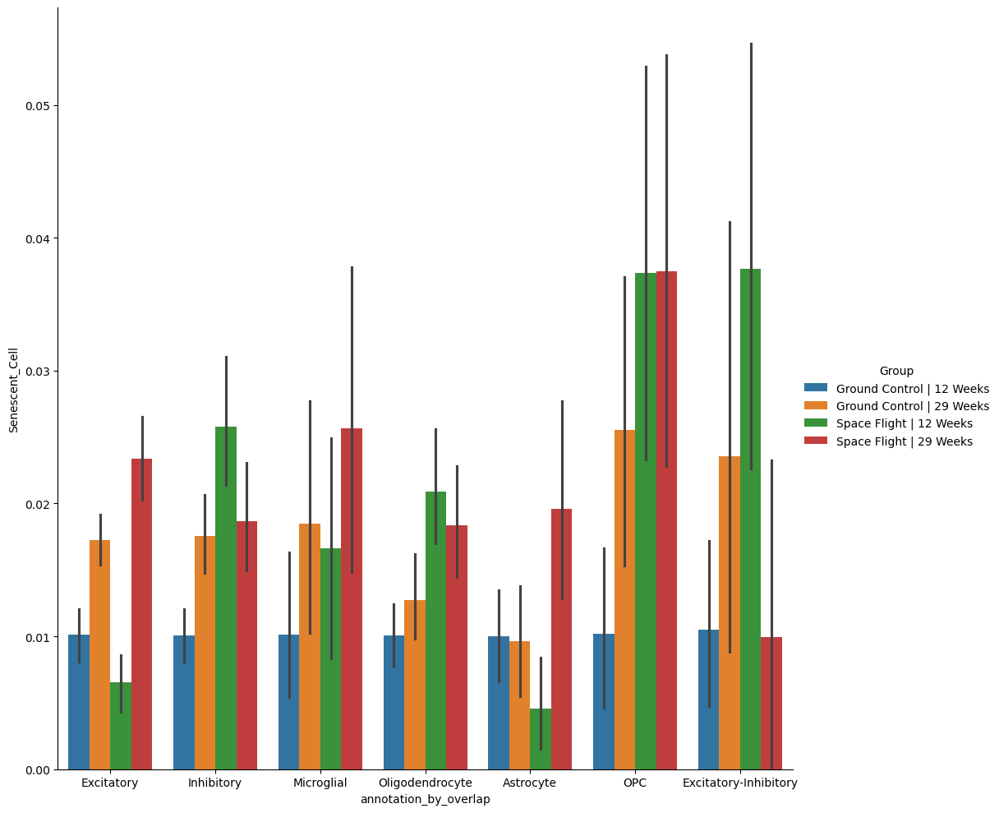

In [13]:
print("Percent Senescent: \n\n", round(self.rna.obs.groupby([
    col_celltype, col_batch]).apply(lambda x: x["Senescent_Cell"].astype(
        int).value_counts(normalize=True)[1], include_groups=False) * 100,
    2).unstack(col_celltype))
sns.catplot(self.rna.obs, y="Senescent_Cell", x=col_celltype,
            hue=col_batch, kind="bar", height=10)

# Plot

## Comparison

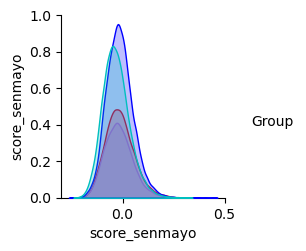

In [241]:
scores = self.rna.obs[[col_batch] + [
    f"score_{x}" for x in sen_metrics]].set_index(
        col_batch, append=True).reset_index()
sns.pairplot(scores, diag_kind="kde", diag_kws=dict(
    cut=0, fill=True, common_norm=True),
             hue=col_batch, palette=palette[col_batch])

## Scores

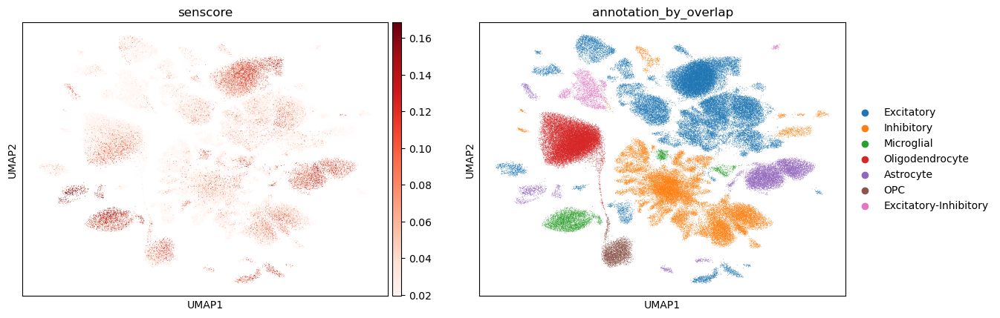

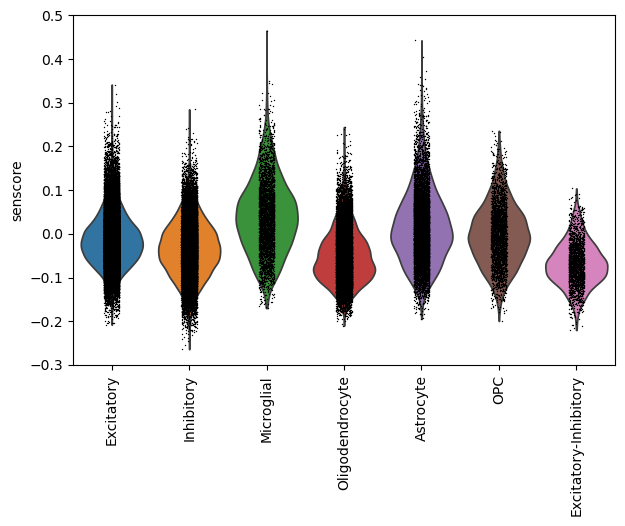

None


<Figure size 640x480 with 0 Axes>

Excitatory


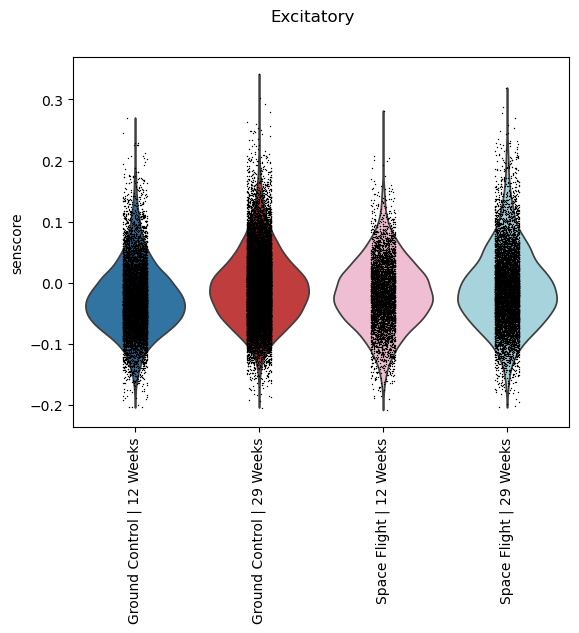

Excitatory-Inhibitory


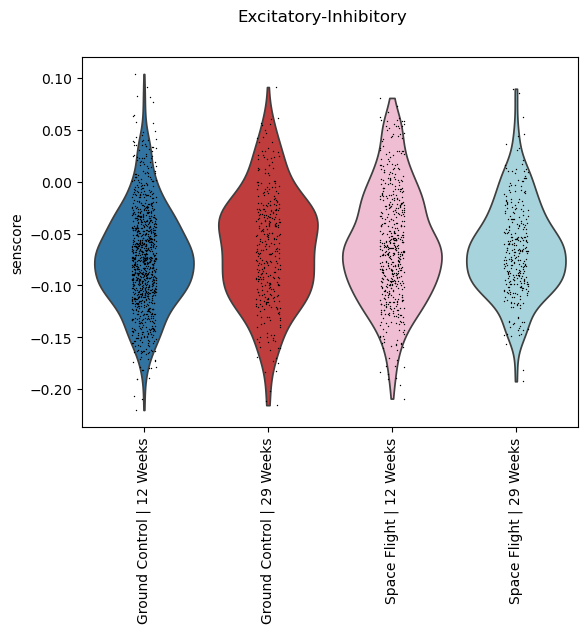

Oligodendrocyte


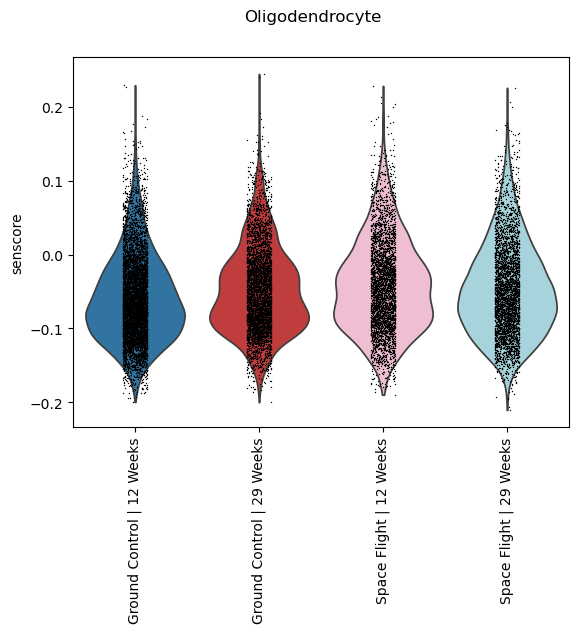

Inhibitory


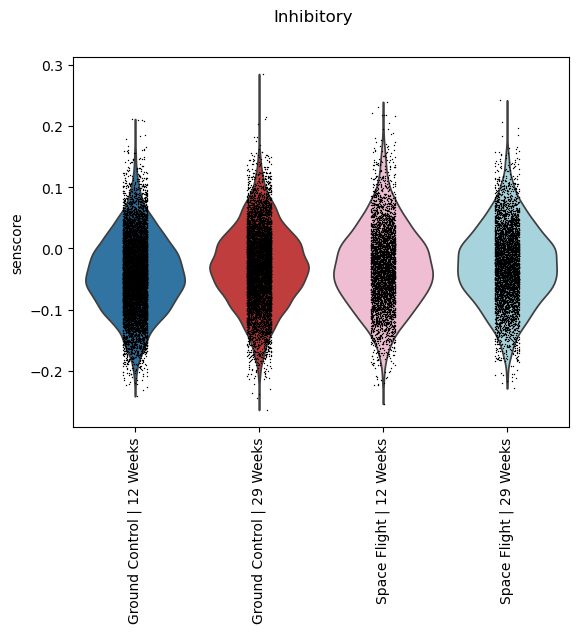

Microglial


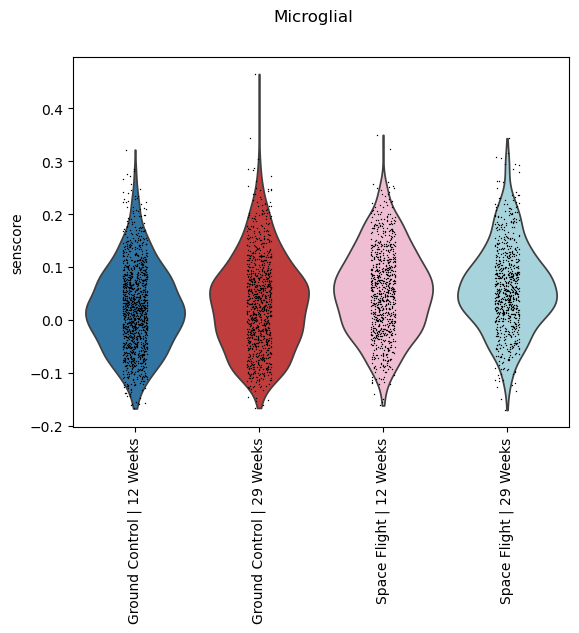

OPC


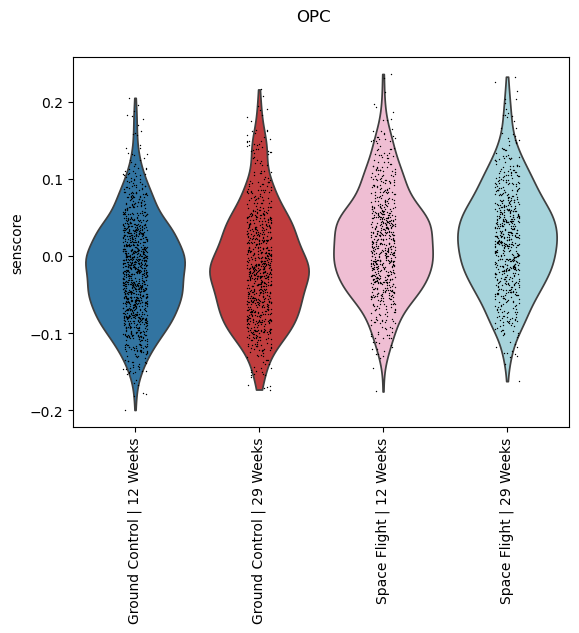

Astrocyte


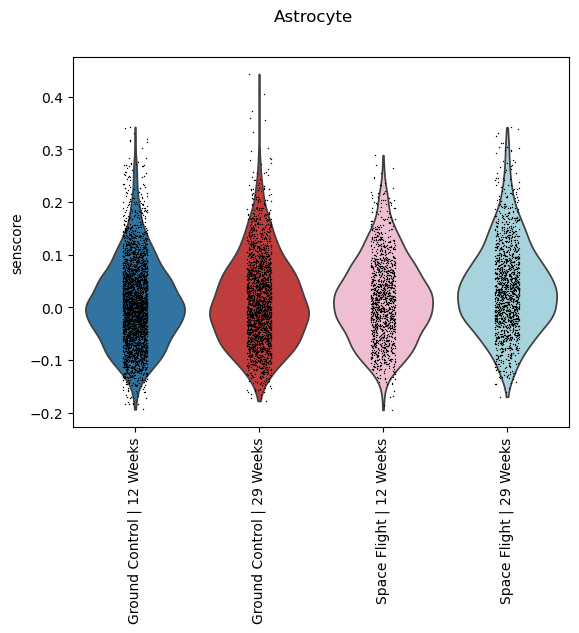

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  

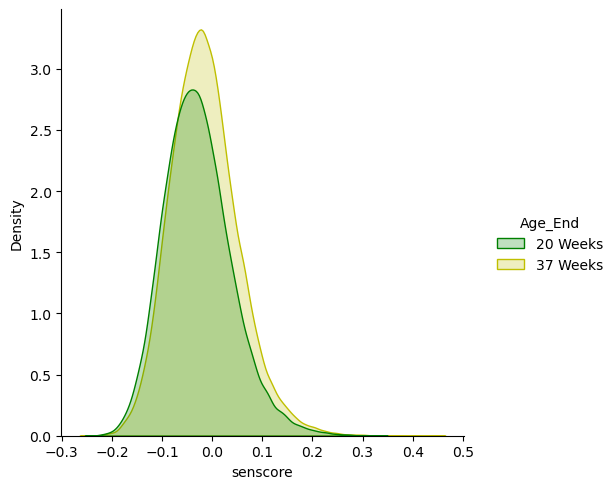

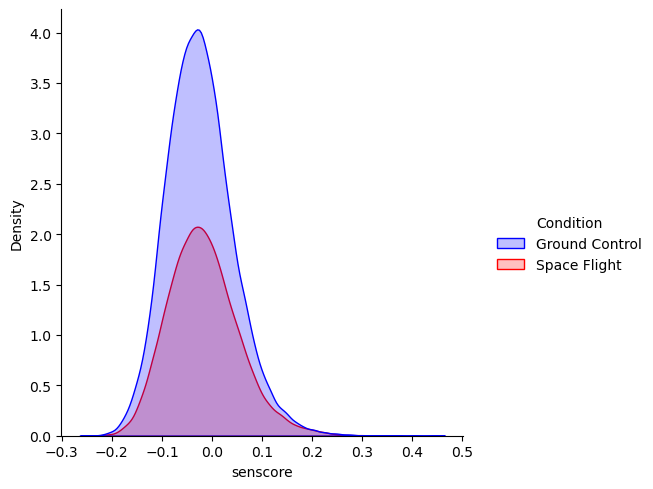

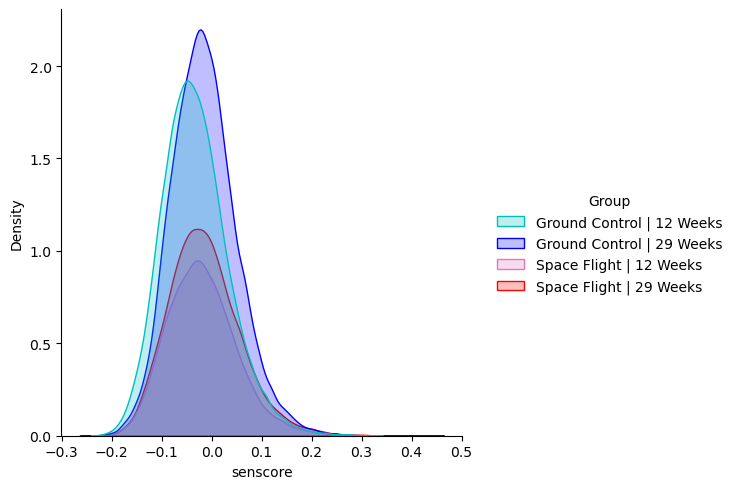

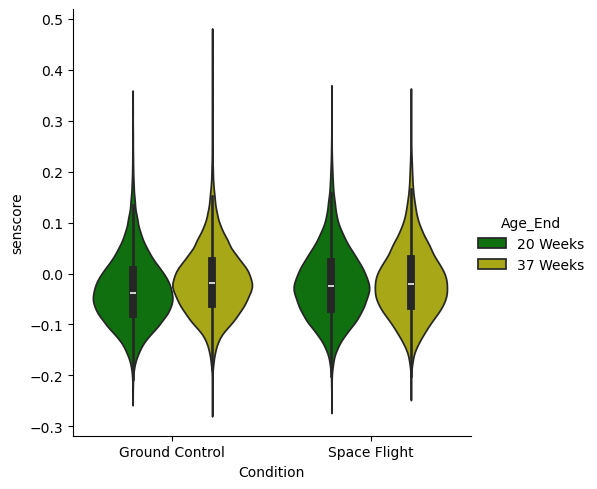

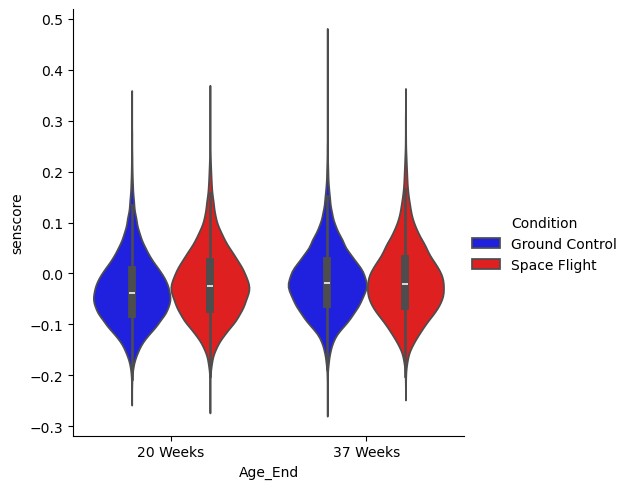

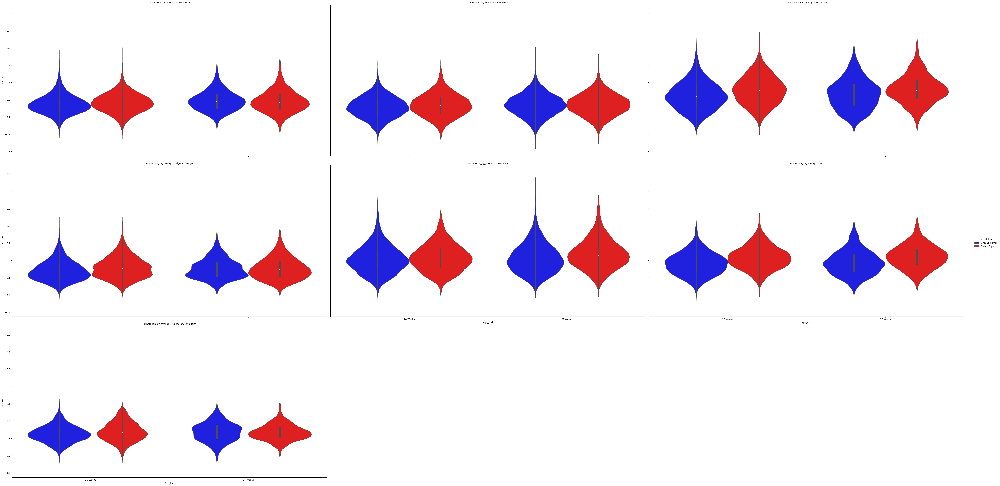

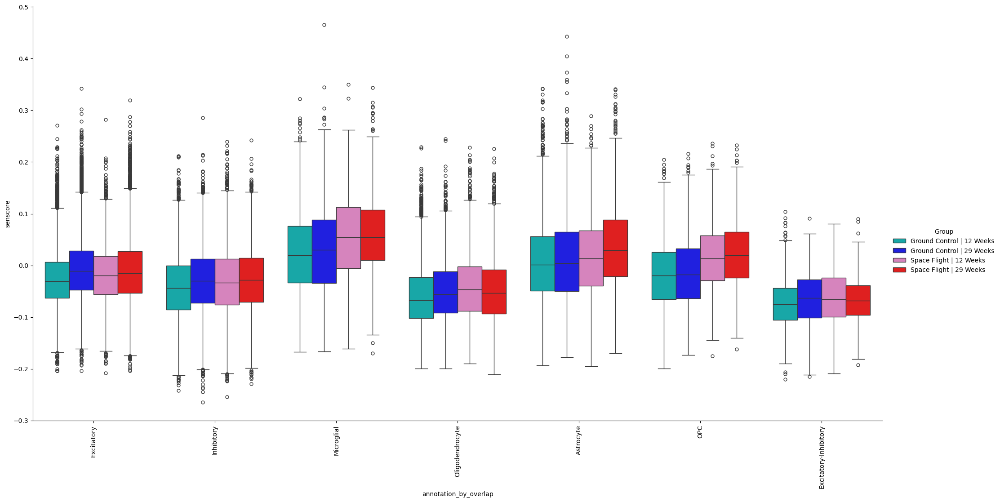

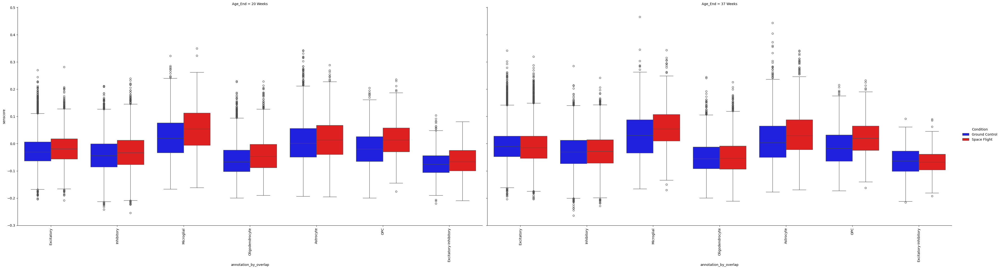

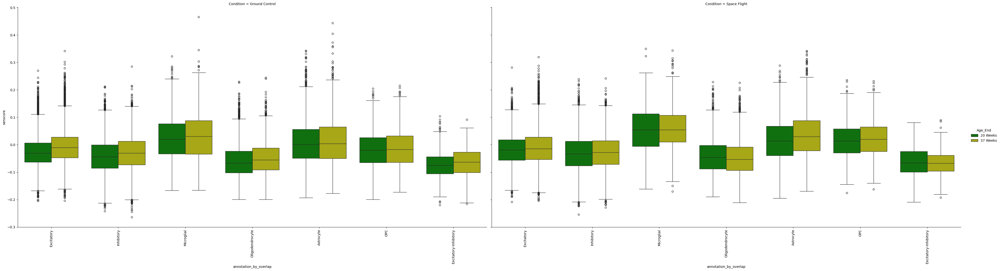

In [246]:
# UMAP with Senescence Scores
bnds = self.rna.obs["senscore"].describe(percentiles=[0.75, 0.99])
_ = self.plot(kind="umap", color=["senscore", col_celltype], umap=dict(
    palette=None, color_map="Reds", vmin=bnds["75%"], vmax=bnds["99%"]))

# Violin Plot of Senescence Scores
_ = self.plot(kind="violin", genes=["senscore"], common_norm=True,
              col_celltype=col_celltype, rotation=90)
_ = self.plot(kind="violin", genes=["senscore"], common_norm=True,
              by_group=col_celltype, col_wrap=1,
              col_celltype=col_batch, rotation=90)

# KDEs
fig_sen_kde = {}
for x in [col_age, col_condition, col_batch]:
    fig_sen_kde[x] = sns.displot(self.rna.obs, hue=x, x="senscore",
                                 palette=palette[x], kind="kde",
                                 cut=0, common_norm=True, fill=True)

# Overall (All Cell Types)
fig_sen_overall = sns.catplot(self.rna.obs, x=col_condition,
                              hue=col_age, y="senscore",
                              palette=palette[col_age],
                              kind="violin")
fig_sen_overall_2 = sns.catplot(self.rna.obs, x=col_age, hue=col_condition,
                                palette=palette[col_condition],
                                y="senscore", kind="violin")

# By Cell Type
fig_sen_rc = sns.catplot(self.rna.obs, col=col_celltype, y="senscore",
                         palette=palette[col_condition],
                         hue=col_condition, x=col_age, kind="violin",
                         height=10, aspect=2, col_wrap=3)
fig_sen = sns.catplot(self.rna.obs, x=col_celltype, y="senscore",
                      palette=palette[col_batch],
                      hue=col_batch, kind="box", height=10, aspect=2)
for a in fig_sen.axes.flatten():
    a.tick_params(axis="x", labelrotation=90)
fig_sen_2 = sns.catplot(self.rna.obs, x=col_celltype, y="senscore",
                        col=col_age, hue=col_condition,
                        palette=palette[col_condition],
                        kind="box", height=10, aspect=2)
for a in fig_sen_2.axes.flatten():
    a.tick_params(axis="x", labelrotation=90)
fig_sen_3 = sns.catplot(self.rna.obs, x=col_celltype, y="senscore",
                        col=col_condition, hue=col_age,
                        palette=palette[col_age],
                        kind="box", height=10, aspect=2)
for a in fig_sen_3.axes.flatten():
    a.tick_params(axis="x", labelrotation=90)

## Burden 

Group by sample and cell type and get percentage of senescent cells

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  



                 min  25%  50%  75%  max
Condition                              
Ground Control  0.0  0.4  1.0  1.9  6.0
Space Flight    0.0  0.8  1.8  2.7  8.0


           min  25%  50%  75%  max
Age_End                          
20 Weeks  0.0  0.4  1.2  2.0  5.8
37 Weeks  0.0  0.5  1.6  2.3  8.0


                          min  25%  50%  75%  max
Condition      Age_End                          
Ground Control 20 Weeks  0.0  0.3  0.8  1.7  4.5
               37 Weeks  0.0  0.5  1.2  2.3  6.0
Space Flight   20 Weeks  0.0  0.8  1.9  3.2  5.8
               37 Weeks  0.0  0.8  1.7  2.3  8.0


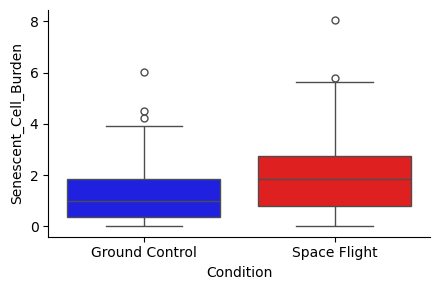

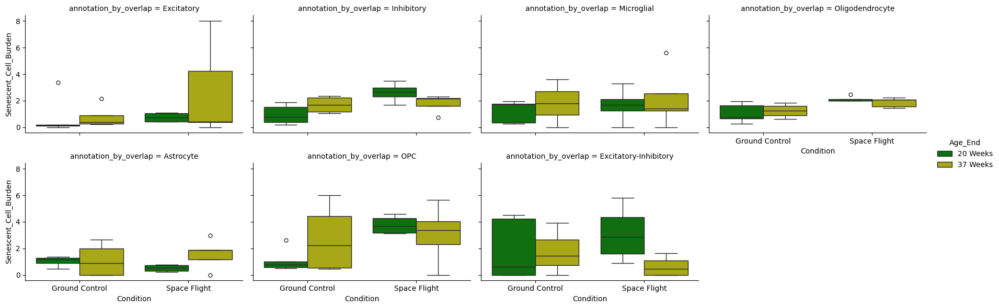

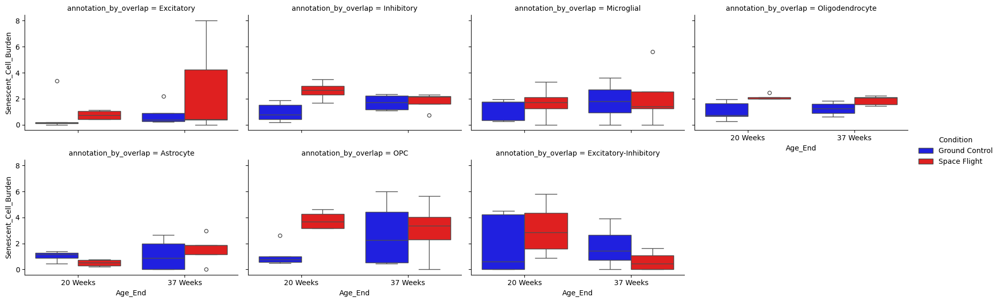

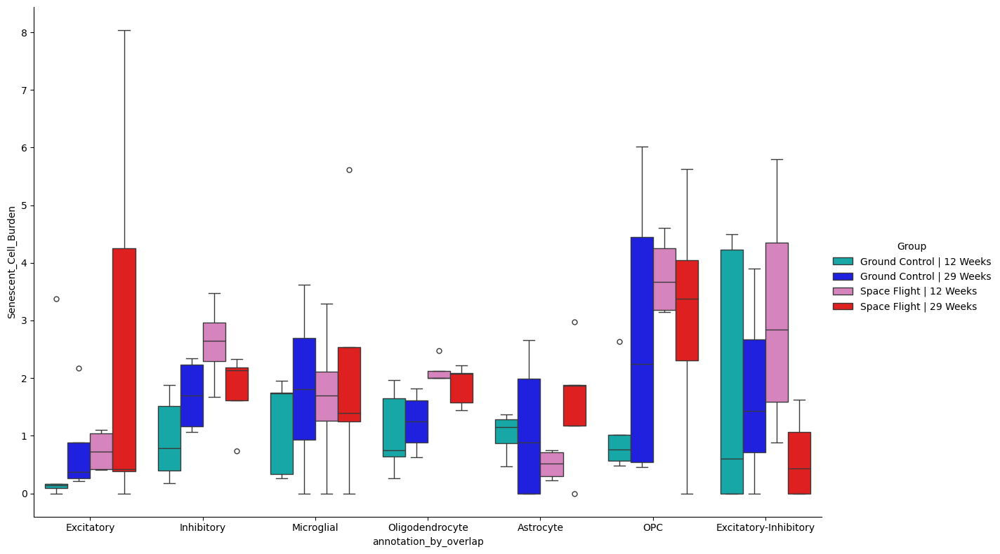

In [12]:
grps = [col_sample, col_celltype, col_age, col_condition, col_batch]
dff = self.rna.obs[grps + ["Senescent_Cell"]].groupby(grps).apply(
    lambda x: x["Senescent_Cell"].mean(), include_groups=False
    ).to_frame("Senescent_Cell_Burden") * 100
# kws_plot = dict(kind="violin", split=False, , common_norm=True)
kws_plot = dict(kind="box", errorbar=("ci", 95))

sns.catplot(y="Senescent_Cell_Burden", x=col_condition, **kws_plot,
            palette=palette[col_condition],
            hue=col_condition, data=dff, height=3, aspect=1.5)
sns.catplot(y="Senescent_Cell_Burden", x=col_condition, **kws_plot,
            col=col_celltype, col_wrap=4,
            palette=palette[col_age],
            hue=col_age, data=dff, height=3, aspect=1.5)
sns.catplot(y="Senescent_Cell_Burden", hue=col_condition, **kws_plot,
            col=col_celltype, col_wrap=4,
            palette=palette[col_condition],
            x=col_age, data=dff, height=3, aspect=1.5)
sns.catplot(y="Senescent_Cell_Burden", x=col_celltype, **kws_plot,
            palette=palette[col_batch],
            hue=col_batch, data=dff, height=8, aspect=1.5)
for x in [col_condition, col_age, [col_condition, col_age]]:
    print("\n\n", round(dff["Senescent_Cell_Burden"].groupby(x).describe()[[
        "min", "25%", "50%", "75%", "max"]], 1))

# Analyze

## Regressions & ANOVAs & MEMs

In [13]:
r_dff = polars.DataFrame(dff.reset_index())  # pymer-compatible aggregated df
r_rna = polars.DataFrame(self.rna.obs.copy())  # pymer-compatible cell-level df
lvls = ["key_control", "key_treatment"]
factors = {col_condition: [keys[col_condition][i] for i in lvls],
           col_age: [keys[col_age][i] for i in lvls]}

### Scores

In [17]:
# # Age + Condition
# model_ca_mlm = lmer(f"senscore ~ {col_condition} + {col_age} +"
#                     f"(1 | {col_sample})", data=r_rna)  # setup model
# model_ca_mlm.set_factors(factors)
# model_ca_mlm.set_transforms({"senscore": "zscore"})
# model_ca_mlm.anova(summary=True).show()

# # Age * Condition
# model_ca_mlm_i = lmer(
#     f"senscore ~ {col_condition} * {col_age} + "
#     f"(1 | {col_sample})", data=r_rna)  # setup model
# model_ca_mlm_i.set_factors(factors)
# model_ca_mlm_i.set_transforms({"senscore": "zscore"})
# model_ca_mlm_i.anova(summary=True).show()

# # Age + Condition + Cell Type
# model_cac_mlm = lmer(
#     f"senscore ~  {col_age} + {col_condition} + {col_celltype} + "
#     f"(1 | {col_sample})", data=r_rna)  # setup model
# model_cac_mlm.set_factors(factors)
# model_cac_mlm.set_transforms({"senscore": "zscore"})
# model_cac_mlm.anova(summary=True).show()

# # Age + Condition * Cell Type
# model_cac_mlm_i = lmer(
#     f"senscore ~  {col_age} + {col_condition} * {col_celltype} + "
#     f"(1 | {col_sample})", data=r_rna)  # setup model
# model_cac_mlm_i.set_factors(factors)
# model_cac_mlm_i.set_transforms({"senscore": "zscore"})
# model_cac_mlm_i.anova(summary=True).show()
# # print(model_cac_mlm_i.report())
# res_em = model_cac_mlm_i.emmeans(col_condition, by=col_celltype)
# res_em = pd.DataFrame(res_em, columns=res_em.columns).set_index(
#     res_em.columns[:2]).map(lambda x: x if isinstance(x, str) or np.isinf(
#         x) else round(x, 2))
# res_em = res_em.drop(["asymp_LCL", "asymp_UCL"], axis=1).join(res_em[[
#     "asymp_LCL", "asymp_UCL"]].apply(
#         lambda x: f"[{x.iloc[0]}, {x.iloc[1]}]", axis=1).to_frame("CI"))
# print(res_em.unstack(col_condition))

# Age * Condition * Cell Type
model_cac_mlm_i3 = lmer(
    f"senscore ~  {col_age} * {col_condition} * {col_celltype} + "
    f"(1 | {col_sample})", data=r_rna)  # setup model
model_cac_mlm_i3.set_factors(factors)
model_cac_mlm_i3.set_transforms({"senscore": "zscore"})
model_cac_mlm_i3.anova(summary=True).show()

# Age * Condition (Condition as Random Effect)
model_ca_mlm_ii = lmer(
    f"senscore ~ {col_condition} * {col_age} + "
    f"(1 | {col_sample}) + (1 + {col_condition} | {col_celltype})",
    data=r_rna)  # setup model
model_ca_mlm_ii.set_factors(factors)
model_ca_mlm_ii.set_transforms({"senscore": "zscore"})
model_ca_mlm_ii.anova(summary=True).show()

# Age * Condition (Age and Condition as Random Effect)
model_ca_mlm_iii = lmer(
    f"senscore ~ {col_condition} * {col_age} + (1 | {col_sample})"
    f" + (1 + {col_condition} + {col_age} | {col_celltype})",
    data=r_rna)  # setup model
model_ca_mlm_iii.set_factors(factors)
model_ca_mlm_iii.set_transforms({"senscore": "zscore"})
model_ca_mlm_iii.anova(summary=True).show()

# Compare
compare(
    # model_ca_mlm, model_ca_mlm_i, model_cac_mlm, model_cac_mlm_i,
    model_cac_mlm_i3, model_ca_mlm_ii, model_ca_mlm_iii).show()

# GLM Version of Results
# model_ca_mlm_i.summary().show()
# model_cac_mlm_i.summary().show()
model_cac_mlm_i3.summary().show()
model_ca_mlm_ii.summary().show()
model_ca_mlm_iii.summary().show()

ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 Chisq 
 p_value 
 
 
 
 
 
 Age_End 
 1.000 
 inf 
 2.781 
 2.781 
 0.09538 
 . 
 
 
 Condition 
 1.000 
 inf 
 11.624 
 11.624 
 <.001 
 *** 
 
 
 annotation_by_overlap 
 6.000 
 inf 
 2,007.061 
 12,042.366 
 
 *** 
 
 
 Age_End:Condition 
 1.000 
 inf 
 0.000 
 0.000 
 0.9975 
 
 
 
 Age_End:annotation_by_overlap 
 6.000 
 inf 
 13.785 
 82.710 
 <.001 
 *** 
 
 
 Condition:annotation_by_overlap 
 6.000 
 inf 
 52.540 
 315.240 
 <.001 
 *** 
 
 
 Age_End:Condition:annotation_by_overlap 
 6.000 
 inf 
 14.504 
 87.024 
 <.001 
 *** 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 Chisq 
 p_value 
 
 
 
 
 
 Condition 
 1.000 
 inf 
 5.989 
 5.989 
 0.0144 
 * 
 
 
 Age_End 
 1.000 
 inf 
 3.628 
 3.628 
 0.05683 
 . 
 
 
 Condition:Age_End 
 1.000 
 inf 
 0.267 
 0.267 
 0.6053 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

R messages: 
Note: D.f. calculations have been disabled because the number of observations exceeds 3000.
To enable adjustments, add the argument 'lmerTest.limit = 103274' (or larger)
[or, globally, 'set emm_options(lmerTest.limit = 103274)' or larger];
but be warned that this may result in large computation time and memory use.

R messages: 
Note: D.f. calculations have been disabled because the number of observations exceeds 3000.
To enable adjustments, add the argument 'lmerTest.limit = 103274' (or larger)
[or, globally, 'set emm_options(lmerTest.limit = 103274)' or larger];
but be warned that this may result in large computation time and memory use.



ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 Chisq 
 p_value 
 
 
 
 
 
 Condition 
 1.000 
 inf 
 6.266 
 6.266 
 0.01231 
 * 
 
 
 Age_End 
 1.000 
 inf 
 2.311 
 2.311 
 0.1284 
 
 
 
 Condition:Age_End 
 1.000 
 inf 
 0.254 
 0.254 
 0.6145 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Analysis of Deviance Table 
 
 
 Model 1: lmer(senscore~Age_End Condition annotation_by_overlap+(1|sample)) 
Model 2: lmer(senscore~Condition Age_End+(1|sample)+(1+Condition|annotation_by_overlap)) 
Model 3: lmer(senscore~Condition Age_End+(1|sample)+(1+Condition+Age_End|annotation_by_overlap)) 
 
 
 
 AIC 
 BIC 
 logLik 
 npar 
 -2*log(L) 
 Chisq 
 Df 
 Pr(>Chisq) 
 
 
 
 
 
 1.00 
 277483.5 
 277769.8 
 −138711.7 
 9.00 
 277.52K 
 
 
 
 
 
 
 2.00 
 277548.2 
 277634.1 
 −138765.1 
 12.00 
 277.45K 
 65.46 
 3.00 
 <.001 
 *** 
 
 
 3.00 
 277488.8 
 277603.3 
 −138732.4 
 30.00 
 277.28K 
 177.96 
 18.00 
 <.001 
 *** 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: lmer(senscore~Age_End*Condition*annotation_by_overlap+(1|sample)) 
 
 
 Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -138711 
AIC: 277483 | BIC: 277769 
Residual error: 0.926 
 
 
 Random Effects: 
 
 Estimate 
 SE 
 CI-low 
 CI-high 
 T-stat 
 DF 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.156 
 
 
 
 
 
 
 
 
 
 Residual-sd 
 Observation 
 0.926 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 −0.075 
 0.070 
 −0.226 
 0.076 
 −1.070 
 14.224 
 0.3025 
 
 
 
 
 Age_End37 Weeks 
 0.230 
 0.106 
 0.004 
 0.456 
 2.178 
 14.129 
 0.04687 
 * 
 
 
 
 ConditionSpace Flight 
 0.121 
 0.106 
 −0.105 
 0.348 
 1.144 
 14.375 
 0.2713 
 
 
 
 
 annotation_by_overlapInhibitory 
 −0.245 
 0.014 
 −0.272 
 −0.218 
 −17.907 
 103,243.694 
 <.001 
 *** 
 
 
 
 annotation_by_overlapMicroglial 
 0.731 
 0.028 
 0.677 
 0.785 
 26.502 
 103,233.445 
 <.001 
 *** 
 
 
 
 annotation_by_overlapOligodendrocyte 
 −0.450 
 0.015 
 −0.480 
 −0.421 
 −29.905 
 103,239.753 
 <.001 
 *** 
 
 
 
 annotation_by_overlapAstrocyte 
 0.490 
 0.019 
 0.453 
 0.527 
 25.775 
 103,235.512 
 <.001 
 *** 
 
 
 
 annotation_by_overlapOPC 
 0.132 
 0.030 
 0.074 
 0.191 
 4.444 
 103,234.599 
 <.001 
 *** 
 
 
 
 annotation_by_overlapExcitatory-Inhibitory 
 −0.633 
 0.030 
 −0.692 
 −0.573 
 −20.904 
 103,237.636 
 <.001 
 *** 
 
 
 
 Age_End37 Weeks:ConditionSpace Flight 
 −0.083 
 0.150 
 −0.403 
 0.237 
 −0.554 
 14.273 
 0.5879 
 
 
 
 
 Age_End37 Weeks:annotation_by_overlapInhibitory 
 −0.019 
 0.020 
 −0.058 
 0.019 
 −0.993 
 103,150.566 
 0.3209 
 
 
 
 
 Age_End37 Weeks:annotation_by_overlapMicroglial 
 −0.078 
 0.041 
 −0.159 
 0.003 
 −1.877 
 103,244.047 
 0.06054 
 . 
 
 
 
 Age_End37 Weeks:annotation_by_overlapOligodendrocyte 
 −0.106 
 0.022 
 −0.149 
 −0.062 
 −4.718 
 103,211.773 
 <.001 
 *** 
 
 
 
 Age_End37 Weeks:annotation_by_overlapAstrocyte 
 −0.141 
 0.029 
 −0.198 
 −0.085 
 −4.900 
 103,245.175 
 <.001 
 *** 
 
 
 
 Age_End37 Weeks:annotation_by_overlapOPC 
 −0.163 
 0.045 
 −0.252 
 −0.075 
 −3.603 
 103,242.886 
 <.001 
 *** 
 
 
 
 Age_End37 Weeks:annotation_by_overlapExcitatory-Inhibitory 
 −0.230 
 0.059 
 −0.346 
 −0.114 
 −3.883 
 103,244.313 
 <.001 
 *** 
 
 
 
 ConditionSpace Flight:annotation_by_overlapInhibitory 
 0.067 
 0.024 
 0.019 
 0.114 
 2.764 
 103,196.150 
 0.005714 
 ** 
 
 
 
 ConditionSpace Flight:annotation_by_overlapMicroglial 
 0.340 
 0.044 
 0.253 
 0.427 
 7.663 
 103,240.892 
 <.001 
 *** 
 
 
 
 ConditionSpace Flight:annotation_by_overlapOligodendrocyte 
 0.120 
 0.025 
 0.070 
 0.170 
 4.748 
 103,243.306 
 <.001 
 *** 
 
 
 
 ConditionSpace Flight:annotation_by_overlapAstrocyte 
 0.016 
 0.035 
 −0.052 
 0.083 
 0.449 
 103,243.711 
 0.6537 
 
 
 
 
 ConditionSpace Flight:annotation_by_overlapOPC 
 0.387 
 0.049 
 0.291 
 0.483 
 7.891 
 103,238.966 
 <.001 
 *** 
 
 
 
 ConditionSpace Flight:annotation_by_overlapExcitatory-Inhibitory 
 0.004 
 0.052 
 −0.098 
 0.106 
 0.077 
 103,245.119 
 0.9386 
 
 
 
 
 Age_End37 Weeks:ConditionSpace Flight:annotation_by_overlapInhibitory 
 −0.068 
 0.033 
 −0.132 
 −0.003 
 −2.064 
 103,173.362 
 0.03905 
 * 
 
 
 
 Age_End37 Weeks:ConditionSpace Flight:annotation_by_overlapMicroglial 
 0.072 
 0.065 
 −0.054 
 0.199 
 1.118 
 103,243.812 
 0.2634 
 
 
 
 
 Age_End37 Weeks:ConditionSpace Flight:annotation_by_overlapOligodendrocyte 
 −0.062 
 0.035 
 −0.131 
 0.008 
 −1.741 
 103,217.073 
 0.08165 
 . 
 
 
 
 Age_End37 Weeks:ConditionSpace Flight:annotation_by_overlapAstrocyte 
 0.355 
 0.049 
 0.260 
 0.451 
 7.317 
 103,245.919 
 <.001 
 *** 
 
 
 
 Age_End37 Weeks:ConditionSpace Flight:annotation_by_overlapOPC 
 0.141 
 0.071 
 0.001 
 0.281 
 1.979 
 103,242.401 
 0.04783 
 * 
 
 
 
 Age_End37 Weeks:ConditionSpace Flight:annotation_by_overlapExcitatory-Inhibitory 
 0.144 
 0.091 
 −0.035 
 0.323 
 1.578 
 103,245.625 
 0.1146 
 
 
 
 
 
 
 Signi

Formula: lmer(senscore~Condition*Age_End+(1|sample)+(1+Condition|annotation_by_overlap)) 
 
 
 Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -138765 
AIC: 277548 | BIC: 277634 
Residual error: 0.927 
 
 
 Random Effects: 
 
 Estimate 
 SE 
 CI-low 
 CI-high 
 T-stat 
 DF 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.156 
 
 
 
 
 
 
 
 
 
 annotation_by_overlap-sd 
 (Intercept) 
 0.494 
 
 
 
 
 
 
 
 
 
 annotation_by_overlap-sd 
 ConditionSpace Flight 
 0.176 
 
 
 
 
 
 
 
 
 
 annotation_by_overlap-cor 
 (Intercept) 
 0.652 
 
 
 
 
 
 
 
 
 
 Residual-sd 
 Observation 
 0.927 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 −0.089 
 0.199 
 −0.552 
 0.374 
 −0.445 
 7.711 
 0.6687 
 
 
 
 
 ConditionSpace Flight 
 0.283 
 0.125 
 0.023 
 0.544 
 2.274 
 19.689 
 0.03435 
 * 
 
 
 
 Age_End37 Weeks 
 0.180 
 0.105 
 −0.045 
 0.406 
 1.714 
 13.852 
 0.1088 
 
 
 
 
 ConditionSpace Flight:Age_End37 Weeks 
 −0.077 
 0.149 
 −0.396 
 0.242 
 −0.517 
 13.910 
 0.6134 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: lmer(senscore~Condition*Age_End+(1|sample)+(1+Condition+Age_End|annotation_by_overlap)) 
 
 
 Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -138732 
AIC: 277488 | BIC: 277603 
Residual error: 0.926 
 
 
 Random Effects: 
 
 Estimate 
 SE 
 CI-low 
 CI-high 
 T-stat 
 DF 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.155 
 
 
 
 
 
 
 
 
 
 annotation_by_overlap-sd 
 (Intercept) 
 0.482 
 
 
 
 
 
 
 
 
 
 annotation_by_overlap-sd 
 ConditionSpace Flight 
 0.172 
 
 
 
 
 
 
 
 
 
 annotation_by_overlap-sd 
 Age_End37 Weeks 
 0.064 
 
 
 
 
 
 
 
 
 
 annotation_by_overlap-cor 
 (Intercept) 
 0.674 
 
 
 
 
 
 
 
 
 
 annotation_by_overlap-cor 
 (Intercept) 
 0.589 
 
 
 
 
 
 
 
 
 
 annotation_by_overlap-cor 
 ConditionSpace Flight 
 −0.200 
 
 
 
 
 
 
 
 
 
 Residual-sd 
 Observation 
 0.926 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 −0.081 
 0.195 
 −0.533 
 0.370 
 −0.418 
 7.774 
 0.6872 
 
 
 
 
 ConditionSpace Flight 
 0.284 
 0.123 
 0.027 
 0.542 
 2.306 
 19.655 
 0.03212 
 * 
 
 
 
 Age_End37 Weeks 
 0.156 
 0.107 
 −0.073 
 0.384 
 1.451 
 15.287 
 0.1671 
 
 
 
 
 ConditionSpace Flight:Age_End37 Weeks 
 −0.074 
 0.148 
 −0.392 
 0.243 
 −0.504 
 13.890 
 0.6224 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

### Binary Snc/Not

Multilevel Logistic Regression

In [14]:
glmmod = {}
# for x in ["1", f"1 + {col_condition}", f"1 + {col_condition} + {col_age}"]:
#     fff = str(f"Senescent_Cell ~ {col_age} * {col_condition}"
#               f" + (1 | {col_sample}) + ({x} | {col_celltype})")
for x in ["1", f"1 + Spaceflight", f"1 + Spaceflight + Aged"]:
    sep = "|" if x == "1" else "||"
    fff = str(f"Senescent_Cell ~ Aged * Spaceflight"
              f" + (1 | {col_sample}) + ({x} {sep} {col_celltype})")
    glmmod[x] = glmer(fff, data=r_rna, family="binomial")
    # glmmod[x].set_factors(factors)
    glmmod[x].fit(exponentiate=True, ncpus=ncpus)  # estimates => odds
    # print(glmmod[x].emmeans(col_condition))
    # print(glmmod[x].emmeans(col_age))
    glmmod[x].summary().show()
    print(glmmod[x].ranef[col_celltype])
compare(*[glmmod[x] for x in glmmod])

# Plot
# grid = sns.FacetGrid(self.rna.obs, col=col_age, hue=col_condition)
# grid.map(sns.countplot, "Senescent_Cell", order=[False, True])
# grid.add_legend()
# grid.set_xlabels("")
# grid.set_xticklabels(["Not SnC", "Snc"])
# sns.despine()
# fig = plt.figure(figsize=(10, 2))
# g_s = fig.add_gridspec(1, 2, width_ratios=[1, 3])
# left, right = fig.add_subplot(g_s[0]), fig.add_subplot(g_s[1])
# left = sns.kdeplot(x="resid", data=glmmod.data, ax=left)
# left.set(xlabel="Residuals", title="Error Distribution")
# right.stem(glmmod.data["cooksd"], basefmt=" ", label="Cook's Distance")
# right.set(xlabel="Row Number", ylabel="Cook's Distance",
#           title="Influential Observations",
#           xticks=range(glmmod.data.height))
# sns.despine()

Formula: glmer(Senescent_Cell~Aged*Spaceflight+(1|sample)+(1|annotation_by_overlap)) 
 
 
 Family: binomial (link: default ) 
Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -8098 
AIC: 16209 | BIC: 16266 
Residual error: 1.0 
 
 
 Random Effects: 
 
 Estimate 
 CI-low 
 CI-high 
 SE 
 Z-stat 
 df 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.576 
 
 
 
 
 
 
 
 
 
 annotation_by_overlap-sd 
 (Intercept) 
 0.258 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.008 
 0.005 
 0.014 
 0.002 
 −18.014 
 inf 
 <.001 
 *** 
 
 
 
 Aged 
 1.930 
 0.984 
 3.785 
 0.663 
 1.913 
 inf 
 0.05575 
 . 
 
 
 
 Spaceflight 
 2.252 
 1.131 
 4.485 
 0.792 
 2.309 
 inf 
 0.02095 
 * 
 
 
 
 Aged:Spaceflight 
 0.648 
 0.266 
 1.579 
 0.294 
 −0.955 
 inf 
 0.3395 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

shape: (7, 2)
┌───────────────────────┬─────────────┐
│ level                 ┆ (Intercept) │
│ ---                   ┆ ---         │
│ str                   ┆ f64         │
╞═══════════════════════╪═════════════╡
│ Excitatory            ┆ 0.818122    │
│ Inhibitory            ┆ 0.990964    │
│ Microglial            ┆ 1.030949    │
│ Oligodendrocyte       ┆ 0.92749     │
│ Astrocyte             ┆ 0.709976    │
│ OPC                   ┆ 1.485906    │
│ Excitatory-Inhibitory ┆ 1.255562    │
└───────────────────────┴─────────────┘


Formula: glmer(Senescent_Cell~Aged*Spaceflight+(1|sample)+(1+Spaceflight||annotation_by_overlap)) 
 
 
 Family: binomial (link: default ) 
Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -8097 
AIC: 16208 | BIC: 16275 
Residual error: 1.0 
 
 
 Random Effects: 
 
 Estimate 
 CI-low 
 CI-high 
 SE 
 Z-stat 
 df 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.578 
 
 
 
 
 
 
 
 
 
 annotation_by_overlap-sd 
 (Intercept) 
 0.199 
 
 
 
 
 
 
 
 
 
 annotation_by_overlap.1-sd 
 Spaceflight 
 0.190 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.008 
 0.005 
 0.014 
 0.002 
 −16.655 
 inf 
 <.001 
 *** 
 
 
 
 Aged 
 1.907 
 0.832 
 4.373 
 0.808 
 1.525 
 inf 
 0.1274 
 
 
 
 
 Spaceflight 
 2.353 
 1.022 
 5.418 
 1.001 
 2.012 
 inf 
 0.04427 
 * 
 
 
 
 Aged:Spaceflight 
 0.667 
 0.216 
 2.059 
 0.384 
 −0.704 
 inf 
 0.4816 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

shape: (7, 3)
┌───────────────────────┬─────────────┬─────────────┐
│ level                 ┆ (Intercept) ┆ Spaceflight │
│ ---                   ┆ ---         ┆ ---         │
│ str                   ┆ f64         ┆ f64         │
╞═══════════════════════╪═════════════╪═════════════╡
│ Excitatory            ┆ 0.904116    ┆ 0.812104    │
│ Inhibitory            ┆ 1.00822     ┆ 0.975283    │
│ Microglial            ┆ 1.033172    ┆ 0.994406    │
│ Oligodendrocyte       ┆ 0.91031     ┆ 1.053992    │
│ Astrocyte             ┆ 0.771405    ┆ 0.873702    │
│ OPC                   ┆ 1.308158    ┆ 1.248044    │
│ Excitatory-Inhibitory ┆ 1.178191    ┆ 1.113457    │
└───────────────────────┴─────────────┴─────────────┘


Formula: glmer(Senescent_Cell~Aged*Spaceflight+(1|sample)+(1+Spaceflight+Aged||annotation_by_overlap)) 
 
 
 Family: binomial (link: default ) 
Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -8092 
AIC: 16201 | BIC: 16277 
Residual error: 1.0 
 
 
 Random Effects: 
 
 Estimate 
 CI-low 
 CI-high 
 SE 
 Z-stat 
 df 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.577 
 
 
 
 
 
 
 
 
 
 annotation_by_overlap-sd 
 (Intercept) 
 0.242 
 
 
 
 
 
 
 
 
 
 annotation_by_overlap.1-sd 
 Spaceflight 
 0.183 
 
 
 
 
 
 
 
 
 
 annotation_by_overlap.2-sd 
 Aged 
 0.209 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.008 
 0.005 
 0.014 
 0.002 
 −17.589 
 inf 
 <.001 
 *** 
 
 
 
 Aged 
 1.901 
 0.871 
 4.151 
 0.757 
 1.613 
 inf 
 0.1067 
 
 
 
 
 Spaceflight 
 2.323 
 1.144 
 4.716 
 0.839 
 2.332 
 inf 
 0.0197 
 * 
 
 
 
 Aged:Spaceflight 
 0.674 
 0.245 
 1.856 
 0.348 
 −0.763 
 inf 
 0.4454 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

shape: (7, 4)
┌───────────────────────┬─────────────┬─────────────┬──────────┐
│ level                 ┆ (Intercept) ┆ Spaceflight ┆ Aged     │
│ ---                   ┆ ---         ┆ ---         ┆ ---      │
│ str                   ┆ f64         ┆ f64         ┆ f64      │
╞═══════════════════════╪═════════════╪═════════════╪══════════╡
│ Excitatory            ┆ 0.771457    ┆ 0.804849    ┆ 1.278735 │
│ Inhibitory            ┆ 1.07736     ┆ 0.994875    ┆ 0.875142 │
│ Microglial            ┆ 0.999886    ┆ 0.989842    ┆ 1.109774 │
│ Oligodendrocyte       ┆ 1.006319    ┆ 1.069577    ┆ 0.803853 │
│ Astrocyte             ┆ 0.746049    ┆ 0.8915      ┆ 1.025683 │
│ OPC                   ┆ 1.31507     ┆ 1.21047     ┆ 1.094022 │
│ Excitatory-Inhibitory ┆ 1.254969    ┆ 1.101261    ┆ 0.900711 │
└───────────────────────┴─────────────┴─────────────┴──────────┘


GT(_tbl_data=shape: (3, 10)
┌──────────────┬──────────────┬──────────────┬──────┬───┬─────┬────────────┬───────┬─────┐
│ AIC          ┆ BIC          ┆ logLik       ┆ npar ┆ … ┆ Df  ┆ Pr(>Chisq) ┆ stars ┆ ids │
│ ---          ┆ ---          ┆ ---          ┆ ---  ┆   ┆ --- ┆ ---        ┆ ---   ┆ --- │
│ f64          ┆ f64          ┆ f64          ┆ i64  ┆   ┆ f64 ┆ str        ┆ str   ┆ i64 │
╞══════════════╪══════════════╪══════════════╪══════╪═══╪═════╪════════════╪═══════╪═════╡
│ 16209.71078  ┆ 16266.981626 ┆ -8098.85539  ┆ 6    ┆ … ┆ 0.0 ┆            ┆       ┆ 1   │
│ 16208.607946 ┆ 16275.423932 ┆ -8097.303973 ┆ 7    ┆ … ┆ 1.0 ┆ 0.0782     ┆ .     ┆ 2   │
│ 16201.189266 ┆ 16277.550394 ┆ -8092.594633 ┆ 8    ┆ … ┆ 1.0 ┆ 0.00215    ┆ **    ┆ 3   │
└──────────────┴──────────────┴──────────────┴──────┴───┴─────┴────────────┴───────┴─────┘, _body=<great_tables._gt_data.Body object at 0x7abb673afe80>, _boxhead=Boxhead([ColInfo(var='ids', type=<ColInfoTypeEnum.stub: 2>, column_label='', column_align='right', column_width=None), ColInfo(var='AIC', type=<ColInfoTypeEnum.default: 1>, column_label='AIC', column_align='right', column_width=None), ColInfo(var='BIC', type=<ColInfoTypeEnum.default: 1>, column_label='BIC', column_align='right', column_width=None), ColInfo(var='logLik', type=<ColInfoTypeEnum.default: 1>, column_label='logLik', column_align='right', column_width=None), ColInfo(var='npar', type=<ColInfoTypeEnum.default: 1>, column_label='npar', column_align='right', column_width=None), ColInfo(var='-2*log(L)', type=<ColInfoTypeEnum.default: 1>, column_label='-2*log(L)', column_align='right', column_width=None), ColInfo(var='Chisq', type=<ColInfoTypeEnum.default: 1>, column_label='Chisq', column_align='right', column_width=None), ColInfo(var='Df', type=<ColInfoTypeEnum.default: 1>, column_label='Df', column_align='right', column_width=None), ColInfo(var='Pr(>Chisq)', type=<ColInfoTypeEnum.default: 1>, column_label='Pr(>Chisq)', column_align='left', column_width=None), ColInfo(var='stars', type=<ColInfoTypeEnum.default: 1>, column_label='', column_align='left', column_width=None)]), _stub=<great_tables._gt_data.Stub object at 0x7abb673a3690>, _spanners=Spanners([]), _heading=Heading(title='Analysis of Deviance Table', subtitle=Md(text='Model 1: glmer(Senescent_Cell~Aged*Spaceflight+(1|sample)+(1|annotation_by_overlap))   \nModel 2: glmer(Senescent_Cell~Aged*Spaceflight+(1|sample)+(1+Spaceflight||annotation_by_overlap))   \nModel 3: glmer(Senescent_Cell~Aged*Spaceflight+(1|sample)+(1+Spaceflight+Aged||annotation_by_overlap))   \n'), preheader=None), _stubhead=None, _source_notes=[Md(text='Signif. codes: *0 *** 0.001 ** 0.01 * 0.05 . 0.1*')], _footnotes=[], _styles=[], _locale=<great_tables._gt_data.Locale object at 0x7ab7b947e210>, _formats=[<great_tables._gt_data.FormatInfo object at 0x7ab7b963c470>, <great_tables._gt_data.FormatInfo object at 0x7abb641656d0>], _substitutions=[<great_tables._gt_data.FormatInfo object at 0x7abb64165bd0>], _options=Options(table_id=OptionsInfo(scss=False, category='table', type='value', value=None), table_caption=OptionsInfo(scss=False, category='table', type='value', value=None), table_width=OptionsInfo(scss=True, category='table', type='px', value='auto'), table_layout=OptionsInfo(scss=True, category='table', type='value', value='fixed'), table_margin_left=OptionsInfo(scss=True, category='table', type='px', value='auto'), table_margin_right=OptionsInfo(scss=True, category='table', type='px', value='auto'), table_background_color=OptionsInfo(scss=True, category='table', type='value', value='#FFFFFF'), table_additional_css=OptionsInfo(scss=False, category='table', type='values', value=[]), table_font_names=OptionsInfo(scss=False, category='table', type='values', value=['-apple-system', 'BlinkMacSystemFont', 'Segoe UI', 'Roboto', 'Oxygen', 'Ubuntu', 'Cantarell', 'Helvetica Neue', 'Fira Sans', 'Droid Sans', 'Arial', 'sans-serif']), table_font_size=OptionsInfo(scss=True, category='table', type='px', va

### Burden (Percent SnC)

ANOVA: Percent SnCs across (a) Condition x Age and (b) Condition x Age x Cell Type

In [15]:
# Age + Condition
model_1 = lm(
    f"Senescent_Cell_Burden ~ {col_condition} + {col_age}", data=r_dff)
model_1.set_factors(factors)
model_1.anova(summary=True).show()
model_1.summary().show()

# Age + Condition +  Cell Type
model_2 = lm(
    f"Senescent_Cell_Burden ~ {col_condition} + {col_age} + {col_celltype}",
    data=r_dff)
model_2.set_factors(factors)
model_2.anova(summary=True).show()
model_2.summary().show()

# Age + Condition * Cell Type
model_3 = lm(
    f"Senescent_Cell_Burden ~ {col_age} + {col_condition} * {col_celltype}",
    data=r_dff)
model_3.set_factors(factors)
model_3.anova(summary=True).show()

# # Age * Condition * Cell Type
# model_4 = lm(
#     f"Senescent_Cell_Burden ~ {col_age} * {col_condition} * {col_celltype}",
#     data=r_dff)
# model_4.set_factors(factors)
# model_4.anova(summary=True).show()
# model_4.summary().show()

# Compare
# compare(model_1, model_2, model_3, model_4).show()
compare(model_1, model_2, model_3).show()
# compare(model_1, model_2).show()

ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 p_value 
 
 
 
 
 
 Condition 
 1 
 121 
 6.324 
 0.01322 
 * 
 
 
 Age_End 
 1 
 121 
 0.487 
 0.4865 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: lm(Senescent_Cell_Burden~Condition+Age_End) 
 
 
 Number of observations: 124 
Confidence intervals: parametric 
--------------------- 
R-squared: 0.0569 
R-squared-adj: 0.0413 
 F(2, 121) = 3.65, p = 0.0289 
Log-likelihood: -224 
AIC: 456 | BIC: 468 
Residual error: 1.497 
 
 
 
 Estimate 
 SE 
 CI-low 
 CI-high 
 T-stat 
 df 
 p 
 
 
 
 
 
 (Intercept) 
 1.250 
 0.224 
 0.807 
 1.693 
 5.587 
 121 
 <.001 
 *** 
 
 
 ConditionSpace Flight 
 0.681 
 0.271 
 0.145 
 1.216 
 2.515 
 121 
 0.01322 
 * 
 
 
 Age_End37 Weeks 
 0.189 
 0.271 
 −0.347 
 0.725 
 0.698 
 121 
 0.4865 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 p_value 
 
 
 
 
 
 Condition 
 1 
 115 
 6.623 
 0.01134 
 * 
 
 
 Age_End 
 1 
 115 
 0.541 
 0.4634 
 
 
 
 annotation_by_overlap 
 6 
 115 
 1.995 
 0.07193 
 . 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: lm(Senescent_Cell_Burden~Condition+Age_End+annotation_by_overlap) 
 
 
 Number of observations: 124 
Confidence intervals: parametric 
--------------------- 
R-squared: 0.1458 
R-squared-adj: 0.0864 
 F(8, 115) = 2.454, p = 0.0172 
Log-likelihood: -218 
AIC: 456 | BIC: 484 
Residual error: 1.461 
 
 
 
 Estimate 
 SE 
 CI-low 
 CI-high 
 T-stat 
 df 
 p 
 
 
 
 
 
 (Intercept) 
 0.837 
 0.387 
 0.071 
 1.603 
 2.164 
 115 
 0.03253 
 * 
 
 
 ConditionSpace Flight 
 0.680 
 0.264 
 0.157 
 1.203 
 2.574 
 115 
 0.01134 
 * 
 
 
 Age_End37 Weeks 
 0.195 
 0.264 
 −0.329 
 0.718 
 0.736 
 115 
 0.4634 
 
 
 
 annotation_by_overlapInhibitory 
 0.447 
 0.487 
 −0.518 
 1.412 
 0.918 
 115 
 0.3606 
 
 
 
 annotation_by_overlapMicroglial 
 0.435 
 0.487 
 −0.530 
 1.400 
 0.894 
 115 
 0.3733 
 
 
 
 annotation_by_overlapOligodendrocyte 
 0.288 
 0.487 
 −0.677 
 1.253 
 0.592 
 115 
 0.5553 
 
 
 
 annotation_by_overlapAstrocyte 
 −0.193 
 0.487 
 −1.158 
 0.772 
 −0.396 
 115 
 0.6928 
 
 
 
 annotation_by_overlapOPC 
 1.329 
 0.487 
 0.365 
 2.294 
 2.729 
 115 
 0.007348 
 ** 
 
 
 annotation_by_overlapExcitatory-Inhibitory 
 0.583 
 0.502 
 −0.412 
 1.578 
 1.160 
 115 
 0.2484 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 p_value 
 
 
 
 
 
 Age_End 
 1 
 109 
 0.537 
 0.4652 
 
 
 
 Condition 
 1 
 109 
 6.274 
 0.01373 
 * 
 
 
 annotation_by_overlap 
 6 
 109 
 1.955 
 0.07829 
 . 
 
 
 Condition:annotation_by_overlap 
 6 
 109 
 0.618 
 0.7154 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Analysis of Deviance Table 
 
 
 Model 1: lm(Senescent_Cell_Burden~Condition+Age_End) 
Model 2: lm(Senescent_Cell_Burden~Condition+Age_End+annotation_by_overlap) 
Model 3: lm(Senescent_Cell_Burden~Age_End+Condition*annotation_by_overlap) 
 
 
 
 AIC 
 BIC 
 logLik 
 Res_Df 
 RSS 
 Df 
 Sum of Sq 
 F 
 Pr(>F) 
 
 
 
 
 
 1.00 
 456.9 
 468.2 
 −224.5 
 121.00 
 271.18 
 
 
 
 
 
 
 
 2.00 
 456.6 
 484.8 
 −218.3 
 115.00 
 245.61 
 6.00 
 25.57 
 1.96 
 0.0783 
 . 
 
 
 3.00 
 464.5 
 509.6 
 −216.2 
 109.00 
 237.53 
 6.00 
 8.08 
 0.62 
 0.715 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

### SnC (Binary) by Cell Type

#### With Cell Type REs

In [27]:
fff = str(f"Senescent_Cell ~ Aged + Spaceflight * {col_celltype} + "
          f"(1 | sample) +  (1 + Spaceflight + Aged || {col_celltype})")
glmmod_ct = glmer(fff, data=r_rna, family="binomial")
glmmod_ct.fit(exponentiate=True, ncpus=ncpus)  # estimates => odds
glmmod_ct.summary().show()

R messages: 
boundary (singular) fit: see help('isSingular')

R messages: 
boundary (singular) fit: see help('isSingular')

R messages: 
boundary (singular) fit: see help('isSingular')



Formula: glmer(Senescent_Cell~Aged+Spaceflight*annotation_by_overlap+(1|sample)+(1+Spaceflight+Aged||annotation_by_overlap)) 
 
 
 Family: binomial (link: default ) 
Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -8079 
AIC: 16197 | BIC: 16378 
Residual error: 1.0 
 
 
 Random Effects: 
 
 Estimate 
 CI-low 
 CI-high 
 SE 
 Z-stat 
 df 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.578 
 
 
 
 
 
 
 
 
 
 annotation_by_overlap-sd 
 (Intercept) 
 0.000 
 
 
 
 
 
 
 
 
 
 annotation_by_overlap.1-sd 
 Spaceflight 
 0.000 
 
 
 
 
 
 
 
 
 
 annotation_by_overlap.2-sd 
 Aged 
 0.205 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.007 
 0.004 
 0.011 
 0.002 
 −21.812 
 inf 
 <.001 
 *** 
 
 
 
 Aged 
 1.551 
 0.910 
 2.645 
 0.422 
 1.613 
 inf 
 0.1068 
 
 
 
 
 Spaceflight 
 1.460 
 0.843 
 2.528 
 0.409 
 1.350 
 inf 
 0.177 
 
 
 
 
 annotation_by_overlapInhibitory 
 1.421 
 1.118 
 1.806 
 0.174 
 2.868 
 inf 
 0.004129 
 ** 
 
 
 
 annotation_by_overlapMicroglial 
 1.322 
 0.883 
 1.977 
 0.272 
 1.357 
 inf 
 0.1748 
 
 
 
 
 annotation_by_overlapOligodendrocyte 
 1.294 
 0.977 
 1.715 
 0.186 
 1.796 
 inf 
 0.07245 
 . 
 
 
 
 annotation_by_overlapAstrocyte 
 0.917 
 0.656 
 1.281 
 0.156 
 −0.507 
 inf 
 0.6122 
 
 
 
 
 annotation_by_overlapOPC 
 1.723 
 1.135 
 2.617 
 0.367 
 2.553 
 inf 
 0.01068 
 * 
 
 
 
 annotation_by_overlapExcitatory-Inhibitory 
 1.754 
 1.077 
 2.854 
 0.436 
 2.260 
 inf 
 0.02385 
 * 
 
 
 
 Spaceflight:annotation_by_overlapInhibitory 
 1.289 
 0.989 
 1.680 
 0.174 
 1.880 
 inf 
 0.06014 
 . 
 
 
 
 Spaceflight:annotation_by_overlapMicroglial 
 1.267 
 0.770 
 2.083 
 0.322 
 0.932 
 inf 
 0.3515 
 
 
 
 
 Spaceflight:annotation_by_overlapOligodendrocyte 
 1.441 
 1.066 
 1.949 
 0.222 
 2.373 
 inf 
 0.01765 
 * 
 
 
 
 Spaceflight:annotation_by_overlapAstrocyte 
 1.084 
 0.693 
 1.696 
 0.247 
 0.355 
 inf 
 0.7228 
 
 
 
 
 Spaceflight:annotation_by_overlapOPC 
 1.863 
 1.161 
 2.988 
 0.449 
 2.580 
 inf 
 0.009885 
 ** 
 
 
 
 Spaceflight:annotation_by_overlapExcitatory-Inhibitory 
 1.566 
 0.865 
 2.834 
 0.474 
 1.482 
 inf 
 0.1385 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

#### Without Cell Type REs

In [251]:
fff = str(f"Senescent_Cell ~ Aged + Spaceflight * {col_celltype} + "
          "(1 | sample)")
glmmod_ct2 = glmer(fff, data=r_rna, family="binomial")
glmmod_ct2.fit(exponentiate=True, ncpus=ncpus)  # estimates => odds
glmmod_ct2.summary().show()

Formula: glmer(Senescent_Cell~Aged+Spaceflight*annotation_by_overlap+(1|sample)) 
 
 
 Family: binomial (link: default ) 
Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -8083 
AIC: 16199 | BIC: 16352 
Residual error: 1.0 
 
 
 Random Effects: 
 
 Estimate 
 CI-low 
 CI-high 
 SE 
 Z-stat 
 df 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.581 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.008 
 0.005 
 0.013 
 0.002 
 −19.803 
 inf 
 <.001 
 *** 
 
 
 
 Aged 
 1.563 
 0.896 
 2.727 
 0.444 
 1.572 
 inf 
 0.116 
 
 
 
 
 Spaceflight 
 1.491 
 0.846 
 2.625 
 0.431 
 1.382 
 inf 
 0.167 
 
 
 
 
 annotation_by_overlapInhibitory 
 1.105 
 0.925 
 1.321 
 0.100 
 1.097 
 inf 
 0.2725 
 
 
 
 
 annotation_by_overlapMicroglial 
 1.165 
 0.807 
 1.683 
 0.219 
 0.816 
 inf 
 0.4143 
 
 
 
 
 annotation_by_overlapOligodendrocyte 
 0.963 
 0.777 
 1.192 
 0.105 
 −0.349 
 inf 
 0.7275 
 
 
 
 
 annotation_by_overlapAstrocyte 
 0.799 
 0.596 
 1.072 
 0.120 
 −1.498 
 inf 
 0.1342 
 
 
 
 
 annotation_by_overlapOPC 
 1.459 
 1.014 
 2.098 
 0.271 
 2.037 
 inf 
 0.04167 
 * 
 
 
 
 annotation_by_overlapExcitatory-Inhibitory 
 1.371 
 0.852 
 2.207 
 0.333 
 1.299 
 inf 
 0.1941 
 
 
 
 
 Spaceflight:annotation_by_overlapInhibitory 
 1.245 
 0.954 
 1.625 
 0.169 
 1.613 
 inf 
 0.1068 
 
 
 
 
 Spaceflight:annotation_by_overlapMicroglial 
 1.235 
 0.731 
 2.085 
 0.330 
 0.788 
 inf 
 0.4305 
 
 
 
 
 Spaceflight:annotation_by_overlapOligodendrocyte 
 1.417 
 1.046 
 1.918 
 0.219 
 2.250 
 inf 
 0.02445 
 * 
 
 
 
 Spaceflight:annotation_by_overlapAstrocyte 
 1.069 
 0.671 
 1.702 
 0.254 
 0.280 
 inf 
 0.7794 
 
 
 
 
 Spaceflight:annotation_by_overlapOPC 
 1.822 
 1.121 
 2.962 
 0.452 
 2.422 
 inf 
 0.01544 
 * 
 
 
 
 Spaceflight:annotation_by_overlapExcitatory-Inhibitory 
 1.562 
 0.804 
 3.036 
 0.530 
 1.317 
 inf 
 0.188 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

### Just Age as Predictor

In [38]:
model_cac_mlm_i3_a = lmer(
    f"senscore ~  {col_age} * {col_celltype} + (1 | {col_sample})",
    data=r_rna)  # setup model
model_cac_mlm_i3_a.set_factors(factors)
model_cac_mlm_i3_a.set_transforms({"senscore": "zscore"})
model_cac_mlm_i3_a.fit()
model_cac_mlm_i3_a.summary().show()

fff = str(f"Senescent_Cell ~ Aged * {col_celltype} + "
          "(1 | sample)")
glmmod_ct2a = glmer(fff, data=r_rna, family="binomial")
glmmod_ct2a.fit(exponentiate=True, ncpus=ncpus)  # estimates => odds
glmmod_ct2a.summary().show()

Formula: lmer(senscore~Age_End*annotation_by_overlap+(1|sample)) 
 
 
 Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -138881 
AIC: 277795 | BIC: 277947 
Residual error: 0.928 
 
 
 Random Effects: 
 
 Estimate 
 SE 
 CI-low 
 CI-high 
 T-stat 
 DF 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.166 
 
 
 
 
 
 
 
 
 
 Residual-sd 
 Observation 
 0.928 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 −0.014 
 0.056 
 −0.132 
 0.104 
 −0.244 
 16.336 
 0.81 
 
 
 
 
 Age_End37 Weeks 
 0.199 
 0.079 
 0.032 
 0.365 
 2.519 
 16.267 
 0.0226 
 * 
 
 
 
 annotation_by_overlapInhibitory 
 −0.223 
 0.011 
 −0.245 
 −0.201 
 −19.724 
 103,257.788 
 <.001 
 *** 
 
 
 
 annotation_by_overlapMicroglial 
 0.861 
 0.022 
 0.818 
 0.903 
 39.821 
 103,249.264 
 
 *** 
 
 
 
 annotation_by_overlapOligodendrocyte 
 −0.409 
 0.012 
 −0.432 
 −0.385 
 −33.734 
 103,258.553 
 <.001 
 *** 
 
 
 
 annotation_by_overlapAstrocyte 
 0.498 
 0.016 
 0.467 
 0.529 
 31.269 
 103,253.186 
 <.001 
 *** 
 
 
 
 annotation_by_overlapOPC 
 0.274 
 0.024 
 0.228 
 0.321 
 11.560 
 103,248.370 
 <.001 
 *** 
 
 
 
 annotation_by_overlapExcitatory-Inhibitory 
 −0.631 
 0.025 
 −0.680 
 −0.583 
 −25.543 
 103,253.754 
 <.001 
 *** 
 
 
 
 Age_End37 Weeks:annotation_by_overlapInhibitory 
 −0.040 
 0.016 
 −0.070 
 −0.009 
 −2.525 
 103,223.181 
 0.01158 
 * 
 
 
 
 Age_End37 Weeks:annotation_by_overlapMicroglial 
 −0.033 
 0.032 
 −0.095 
 0.030 
 −1.027 
 103,255.054 
 0.3042 
 
 
 
 
 Age_End37 Weeks:annotation_by_overlapOligodendrocyte 
 −0.126 
 0.017 
 −0.160 
 −0.092 
 −7.286 
 103,249.497 
 <.001 
 *** 
 
 
 
 Age_End37 Weeks:annotation_by_overlapAstrocyte 
 −0.000 
 0.023 
 −0.045 
 0.045 
 −0.003 
 103,259.812 
 0.9978 
 
 
 
 
 Age_End37 Weeks:annotation_by_overlapOPC 
 −0.077 
 0.035 
 −0.145 
 −0.008 
 −2.194 
 103,253.684 
 0.02826 
 * 
 
 
 
 Age_End37 Weeks:annotation_by_overlapExcitatory-Inhibitory 
 −0.172 
 0.045 
 −0.260 
 −0.085 
 −3.847 
 103,257.305 
 <.001 
 *** 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: glmer(Senescent_Cell~Aged*annotation_by_overlap+(1|sample)) 
 
 
 Family: binomial (link: default ) 
Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -8078 
AIC: 16187 | BIC: 16331 
Residual error: 1.0 
 
 
 Random Effects: 
 
 Estimate 
 CI-low 
 CI-high 
 SE 
 Z-stat 
 df 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.644 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.008 
 0.005 
 0.012 
 0.002 
 −21.425 
 inf 
 <.001 
 *** 
 
 
 
 Aged 
 2.315 
 1.255 
 4.272 
 0.724 
 2.687 
 inf 
 0.007214 
 ** 
 
 
 
 annotation_by_overlapInhibitory 
 1.687 
 1.353 
 2.103 
 0.190 
 4.653 
 inf 
 <.001 
 *** 
 
 
 
 annotation_by_overlapMicroglial 
 1.410 
 0.929 
 2.142 
 0.301 
 1.612 
 inf 
 0.1069 
 
 
 
 
 annotation_by_overlapOligodendrocyte 
 1.678 
 1.320 
 2.132 
 0.205 
 4.228 
 inf 
 <.001 
 *** 
 
 
 
 annotation_by_overlapAstrocyte 
 0.951 
 0.662 
 1.367 
 0.176 
 −0.270 
 inf 
 0.7869 
 
 
 
 
 annotation_by_overlapOPC 
 2.452 
 1.680 
 3.579 
 0.473 
 4.650 
 inf 
 <.001 
 *** 
 
 
 
 annotation_by_overlapExcitatory-Inhibitory 
 2.595 
 1.782 
 3.780 
 0.498 
 4.972 
 inf 
 <.001 
 *** 
 
 
 
 Aged:annotation_by_overlapInhibitory 
 0.610 
 0.463 
 0.804 
 0.086 
 −3.511 
 inf 
 <.001 
 *** 
 
 
 
 Aged:annotation_by_overlapMicroglial 
 0.930 
 0.539 
 1.604 
 0.259 
 −0.262 
 inf 
 0.7934 
 
 
 
 
 Aged:annotation_by_overlapOligodendrocyte 
 0.532 
 0.388 
 0.729 
 0.086 
 −3.922 
 inf 
 <.001 
 *** 
 
 
 
 Aged:annotation_by_overlapAstrocyte 
 0.852 
 0.532 
 1.364 
 0.205 
 −0.666 
 inf 
 0.5053 
 
 
 
 
 Aged:annotation_by_overlapOPC 
 0.755 
 0.459 
 1.241 
 0.191 
 −1.109 
 inf 
 0.2675 
 
 
 
 
 Aged:annotation_by_overlapExcitatory-Inhibitory 
 0.403 
 0.207 
 0.784 
 0.137 
 −2.675 
 inf 
 0.007467 
 ** 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

### Three-Way Interaction

In [15]:
# Score
# Binary
fff = str(f"senscore ~ {col_celltype} * Aged * Spaceflight"
          f" + (1 | {col_sample})")
model_allix_score = lmer(fff, data=r_rna)
model_allix_score.fit(ncpus=ncpus)  # estimates => odds
model_allix_score.anova(summary=True).show()
model_allix_score.summary().show()

# Binary
fff = str(f"Senescent_Cell ~  {col_celltype} * Aged * Spaceflight"
          f" + (1 | {col_sample})")
model_allix = glmer(fff, data=r_rna, family="binomial")
model_allix.fit(exponentiate=True, ncpus=ncpus)  # estimates => odds
model_allix.anova(summary=True).show()
model_allix.summary().show()
res_allix_fixed = pd.DataFrame(model_allix.result_fit[[
    "term", "estimate", "p_value"]], columns=[
        "Term", "OR", "P"]).set_index("Term")
res_allix_fixed.loc[:, "Log-Odds"] = np.log(res_allix_fixed.OR.astype(float))
res_allix_fixed.loc[:, "Significance"] = res_allix_fixed.P.apply(
    lambda x: "***" if x < 0.001 else "**" if x < 0.01 else "*" if (
        x < 0.05) else "")
res_allix_fixed

R messages: 
Note: D.f. calculations have been disabled because the number of observations exceeds 3000.
To enable adjustments, add the argument 'lmerTest.limit = 103274' (or larger)
[or, globally, 'set emm_options(lmerTest.limit = 103274)' or larger];
but be warned that this may result in large computation time and memory use.

R messages: 
Note: D.f. calculations have been disabled because the number of observations exceeds 3000.
To enable adjustments, add the argument 'lmerTest.limit = 103274' (or larger)
[or, globally, 'set emm_options(lmerTest.limit = 103274)' or larger];
but be warned that this may result in large computation time and memory use.



ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 Chisq 
 p_value 
 
 
 
 
 
 annotation_by_overlap 
 6.000 
 inf 
 2,007.061 
 12,042.366 
 
 *** 
 
 
 Aged 
 1.000 
 inf 
 2.781 
 2.781 
 0.09538 
 . 
 
 
 Spaceflight 
 1.000 
 inf 
 11.624 
 11.624 
 <.001 
 *** 
 
 
 annotation_by_overlap:Aged 
 6.000 
 inf 
 13.785 
 82.710 
 <.001 
 *** 
 
 
 annotation_by_overlap:Spaceflight 
 6.000 
 inf 
 52.540 
 315.240 
 <.001 
 *** 
 
 
 Aged:Spaceflight 
 1.000 
 inf 
 0.000 
 0.000 
 0.9975 
 
 
 
 annotation_by_overlap:Aged:Spaceflight 
 6.000 
 inf 
 14.504 
 87.024 
 <.001 
 *** 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: lmer(senscore~annotation_by_overlap*Aged*Spaceflight+(1|sample)) 
 
 
 Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: 138206 
AIC: -276352 | BIC: -276066 
Residual error: 0.063 
 
 
 Random Effects: 
 
 Estimate 
 SE 
 CI-low 
 CI-high 
 T-stat 
 DF 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.011 
 
 
 
 
 
 
 
 
 
 Residual-sd 
 Observation 
 0.063 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 −0.027 
 0.005 
 −0.037 
 −0.016 
 −5.532 
 14.224 
 <.001 
 *** 
 
 
 
 annotation_by_overlapInhibitory 
 −0.017 
 0.001 
 −0.019 
 −0.015 
 −17.907 
 103,243.694 
 <.001 
 *** 
 
 
 
 annotation_by_overlapMicroglial 
 0.050 
 0.002 
 0.046 
 0.054 
 26.502 
 103,233.445 
 <.001 
 *** 
 
 
 
 annotation_by_overlapOligodendrocyte 
 −0.031 
 0.001 
 −0.033 
 −0.029 
 −29.905 
 103,239.753 
 <.001 
 *** 
 
 
 
 annotation_by_overlapAstrocyte 
 0.034 
 0.001 
 0.031 
 0.036 
 25.775 
 103,235.512 
 <.001 
 *** 
 
 
 
 annotation_by_overlapOPC 
 0.009 
 0.002 
 0.005 
 0.013 
 4.444 
 103,234.599 
 <.001 
 *** 
 
 
 
 annotation_by_overlapExcitatory-Inhibitory 
 −0.043 
 0.002 
 −0.047 
 −0.039 
 −20.904 
 103,237.636 
 <.001 
 *** 
 
 
 
 Aged 
 0.016 
 0.007 
 0.000 
 0.031 
 2.178 
 14.129 
 0.04687 
 * 
 
 
 
 Spaceflight 
 0.008 
 0.007 
 −0.007 
 0.024 
 1.144 
 14.375 
 0.2713 
 
 
 
 
 annotation_by_overlapInhibitory:Aged 
 −0.001 
 0.001 
 −0.004 
 0.001 
 −0.993 
 103,150.561 
 0.3209 
 
 
 
 
 annotation_by_overlapMicroglial:Aged 
 −0.005 
 0.003 
 −0.011 
 0.000 
 −1.877 
 103,244.047 
 0.06054 
 . 
 
 
 
 annotation_by_overlapOligodendrocyte:Aged 
 −0.007 
 0.002 
 −0.010 
 −0.004 
 −4.718 
 103,211.772 
 <.001 
 *** 
 
 
 
 annotation_by_overlapAstrocyte:Aged 
 −0.010 
 0.002 
 −0.014 
 −0.006 
 −4.900 
 103,245.175 
 <.001 
 *** 
 
 
 
 annotation_by_overlapOPC:Aged 
 −0.011 
 0.003 
 −0.017 
 −0.005 
 −3.603 
 103,242.886 
 <.001 
 *** 
 
 
 
 annotation_by_overlapExcitatory-Inhibitory:Aged 
 −0.016 
 0.004 
 −0.024 
 −0.008 
 −3.883 
 103,244.313 
 <.001 
 *** 
 
 
 
 annotation_by_overlapInhibitory:Spaceflight 
 0.005 
 0.002 
 0.001 
 0.008 
 2.764 
 103,196.150 
 0.005714 
 ** 
 
 
 
 annotation_by_overlapMicroglial:Spaceflight 
 0.023 
 0.003 
 0.017 
 0.029 
 7.663 
 103,240.892 
 <.001 
 *** 
 
 
 
 annotation_by_overlapOligodendrocyte:Spaceflight 
 0.008 
 0.002 
 0.005 
 0.012 
 4.748 
 103,243.306 
 <.001 
 *** 
 
 
 
 annotation_by_overlapAstrocyte:Spaceflight 
 0.001 
 0.002 
 −0.004 
 0.006 
 0.449 
 103,243.711 
 0.6537 
 
 
 
 
 annotation_by_overlapOPC:Spaceflight 
 0.026 
 0.003 
 0.020 
 0.033 
 7.891 
 103,238.966 
 <.001 
 *** 
 
 
 
 annotation_by_overlapExcitatory-Inhibitory:Spaceflight 
 0.000 
 0.004 
 −0.007 
 0.007 
 0.077 
 103,245.119 
 0.9386 
 
 
 
 
 Aged:Spaceflight 
 −0.006 
 0.010 
 −0.028 
 0.016 
 −0.554 
 14.273 
 0.5879 
 
 
 
 
 annotation_by_overlapInhibitory:Aged:Spaceflight 
 −0.005 
 0.002 
 −0.009 
 −0.000 
 −2.064 
 103,173.360 
 0.03905 
 * 
 
 
 
 annotation_by_overlapMicroglial:Aged:Spaceflight 
 0.005 
 0.004 
 −0.004 
 0.014 
 1.118 
 103,243.812 
 0.2634 
 
 
 
 
 annotation_by_overlapOligodendrocyte:Aged:Spaceflight 
 −0.004 
 0.002 
 −0.009 
 0.001 
 −1.741 
 103,217.072 
 0.08165 
 . 
 
 
 
 annotation_by_overlapAstrocyte:Aged:Spaceflight 
 0.024 
 0.003 
 0.018 
 0.031 
 7.317 
 103,245.919 
 <.001 
 *** 
 
 
 
 annotation_by_overlapOPC:Aged:Spaceflight 
 0.010 
 0.005 
 0.000 
 0.019 
 1.979 
 103,242.401 
 0.04783 
 * 
 
 
 
 annotation_by_overlapExcitatory-Inhibitory:Aged:Spaceflight 
 0.010 
 0.006 
 −0.002 
 0.022 
 1.578 
 103,245.625 
 0.1146 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

R messages: 
Convergence status
: [1] FALSE
attr(,"gradient")
[1] 0.001041441

R messages: 
Convergence status
: [1] FALSE
attr(,"gradient")
[1] 0.001041441



ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 Chisq 
 p_value 
 
 
 
 
 
 annotation_by_overlap 
 6.000 
 inf 
 9.367 
 56.202 
 <.001 
 *** 
 
 
 Aged 
 1.000 
 inf 
 2.623 
 2.623 
 0.1053 
 
 
 
 Spaceflight 
 1.000 
 inf 
 4.065 
 4.065 
 0.04378 
 * 
 
 
 annotation_by_overlap:Aged 
 6.000 
 inf 
 5.508 
 33.048 
 <.001 
 *** 
 
 
 annotation_by_overlap:Spaceflight 
 6.000 
 inf 
 3.346 
 20.076 
 0.002681 
 ** 
 
 
 Aged:Spaceflight 
 1.000 
 inf 
 0.330 
 0.330 
 0.5654 
 
 
 
 annotation_by_overlap:Aged:Spaceflight 
 6.000 
 inf 
 7.459 
 44.754 
 <.001 
 *** 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: glmer(Senescent_Cell~annotation_by_overlap*Aged*Spaceflight+(1|sample)) 
 
 
 Family: binomial (link: default ) 
Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -8046 
AIC: 16151 | BIC: 16428 
Residual error: 1.0 
 
 
 Random Effects: 
 
 Estimate 
 CI-low 
 CI-high 
 SE 
 Z-stat 
 df 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.566 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.007 
 0.004 
 0.012 
 0.002 
 −18.077 
 inf 
 <.001 
 *** 
 
 
 
 annotation_by_overlapInhibitory 
 0.990 
 0.745 
 1.315 
 0.143 
 −0.072 
 inf 
 0.9423 
 
 
 
 
 annotation_by_overlapMicroglial 
 1.057 
 0.593 
 1.883 
 0.312 
 0.187 
 inf 
 0.8517 
 
 
 
 
 annotation_by_overlapOligodendrocyte 
 1.184 
 0.864 
 1.622 
 0.190 
 1.051 
 inf 
 0.2932 
 
 
 
 
 annotation_by_overlapAstrocyte 
 0.979 
 0.659 
 1.453 
 0.197 
 −0.107 
 inf 
 0.9151 
 
 
 
 
 annotation_by_overlapOPC 
 1.185 
 0.619 
 2.271 
 0.393 
 0.513 
 inf 
 0.6081 
 
 
 
 
 annotation_by_overlapExcitatory-Inhibitory 
 1.487 
 0.816 
 2.709 
 0.455 
 1.296 
 inf 
 0.1948 
 
 
 
 
 Aged 
 1.937 
 0.873 
 4.295 
 0.787 
 1.627 
 inf 
 0.1037 
 
 
 
 
 Spaceflight 
 0.912 
 0.384 
 2.163 
 0.402 
 −0.210 
 inf 
 0.8338 
 
 
 
 
 annotation_by_overlapInhibitory:Aged 
 1.227 
 0.852 
 1.768 
 0.228 
 1.101 
 inf 
 0.2709 
 
 
 
 
 annotation_by_overlapMicroglial:Aged 
 1.207 
 0.563 
 2.589 
 0.470 
 0.484 
 inf 
 0.6284 
 
 
 
 
 annotation_by_overlapOligodendrocyte:Aged 
 0.674 
 0.437 
 1.041 
 0.149 
 −1.780 
 inf 
 0.07506 
 . 
 
 
 
 annotation_by_overlapAstrocyte:Aged 
 0.645 
 0.354 
 1.177 
 0.198 
 −1.429 
 inf 
 0.153 
 
 
 
 
 annotation_by_overlapOPC:Aged 
 1.426 
 0.623 
 3.260 
 0.602 
 0.840 
 inf 
 0.4008 
 
 
 
 
 annotation_by_overlapExcitatory-Inhibitory:Aged 
 0.842 
 0.342 
 2.073 
 0.387 
 −0.374 
 inf 
 0.7082 
 
 
 
 
 annotation_by_overlapInhibitory:Spaceflight 
 3.990 
 2.388 
 6.667 
 1.045 
 5.282 
 inf 
 <.001 
 *** 
 
 
 
 annotation_by_overlapMicroglial:Spaceflight 
 2.383 
 0.973 
 5.838 
 1.089 
 1.900 
 inf 
 0.05746 
 . 
 
 
 
 annotation_by_overlapOligodendrocyte:Spaceflight 
 2.660 
 1.539 
 4.596 
 0.742 
 3.505 
 inf 
 <.001 
 *** 
 
 
 
 annotation_by_overlapAstrocyte:Spaceflight 
 0.705 
 0.258 
 1.925 
 0.361 
 −0.681 
 inf 
 0.4958 
 
 
 
 
 annotation_by_overlapOPC:Spaceflight 
 4.920 
 2.078 
 11.647 
 2.163 
 3.623 
 inf 
 <.001 
 *** 
 
 
 
 annotation_by_overlapExcitatory-Inhibitory:Spaceflight 
 3.770 
 1.576 
 9.017 
 1.677 
 2.983 
 inf 
 0.002858 
 ** 
 
 
 
 Aged:Spaceflight 
 1.634 
 0.502 
 5.321 
 0.984 
 0.816 
 inf 
 0.4146 
 
 
 
 
 annotation_by_overlapInhibitory:Aged:Spaceflight 
 0.174 
 0.093 
 0.323 
 0.055 
 −5.524 
 inf 
 <.001 
 *** 
 
 
 
 annotation_by_overlapMicroglial:Aged:Spaceflight 
 0.446 
 0.142 
 1.407 
 0.261 
 −1.377 
 inf 
 0.1685 
 
 
 
 
 annotation_by_overlapOligodendrocyte:Aged:Spaceflight 
 0.467 
 0.234 
 0.932 
 0.165 
 −2.160 
 inf 
 0.03075 
 * 
 
 
 
 annotation_by_overlapAstrocyte:Aged:Spaceflight 
 2.310 
 0.706 
 7.558 
 1.397 
 1.384 
 inf 
 0.1663 
 
 
 
 
 annotation_by_overlapOPC:Aged:Spaceflight 
 0.245 
 0.082 
 0.735 
 0.137 
 −2.508 
 inf 
 0.01213 
 * 
 
 
 
 annotation_by_overlapExcitatory-Inhibitory:Aged:Spaceflight 
 0.155 
 0.029 
 0.818 
 0.132 
 −2.196 
 inf 
 0.02811 
 * 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

,OR,P,Log-Odds,Significance
Term,,,,
(Intercept),0.007257,0.0,-4.925800,***
annotation_by_overlapInhibitory,0.989572,0.942323,-0.010483,
annotation_by_overlapMicroglial,1.056651,0.851745,0.055105,
annotation_by_overlapOligodendrocyte,1.1839,0.293218,0.168814,
annotation_by_overlapAstrocyte,0.97873,0.915072,-0.021499,
annotation_by_overlapOPC,1.185386,0.608123,0.170068,
annotation_by_overlapExcitatory-Inhibitory,1.486958,0.194837,0.396733,
Aged,1.936852,0.103733,0.661064,
Spaceflight,0.911654,0.833786,-0.092494,


## Perturbation Distance

Output()



Overall Distance




Output()

Output()

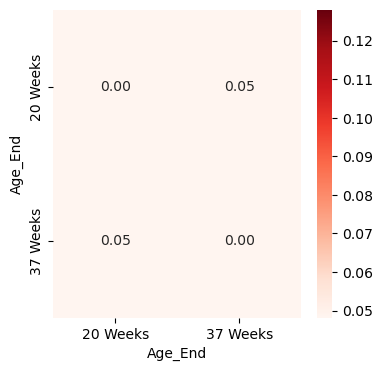

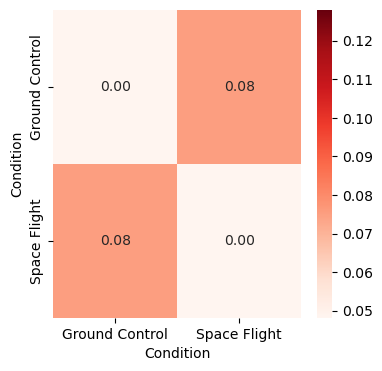

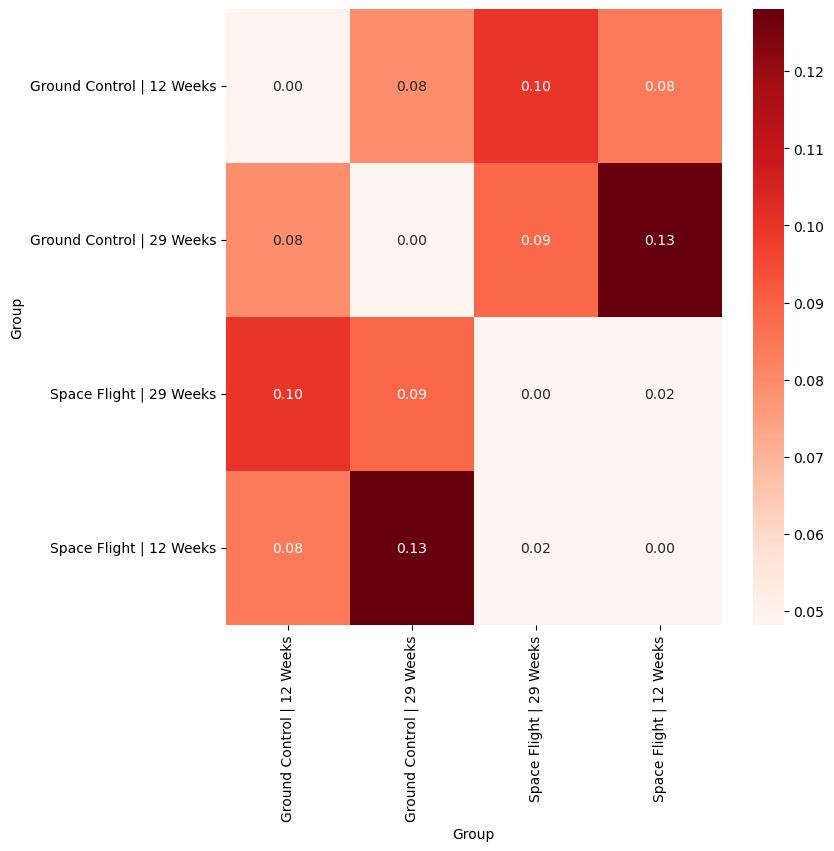



Just Senescence Genes




Output()

Output()

Output()

Output()

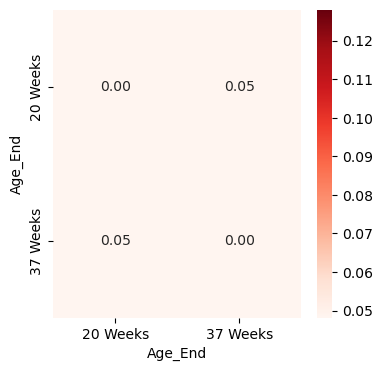

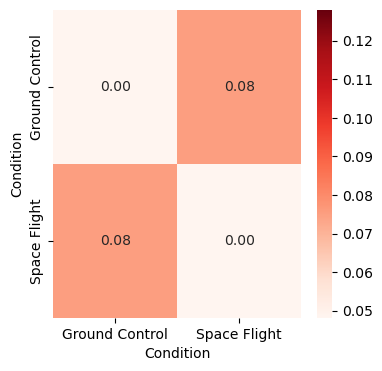

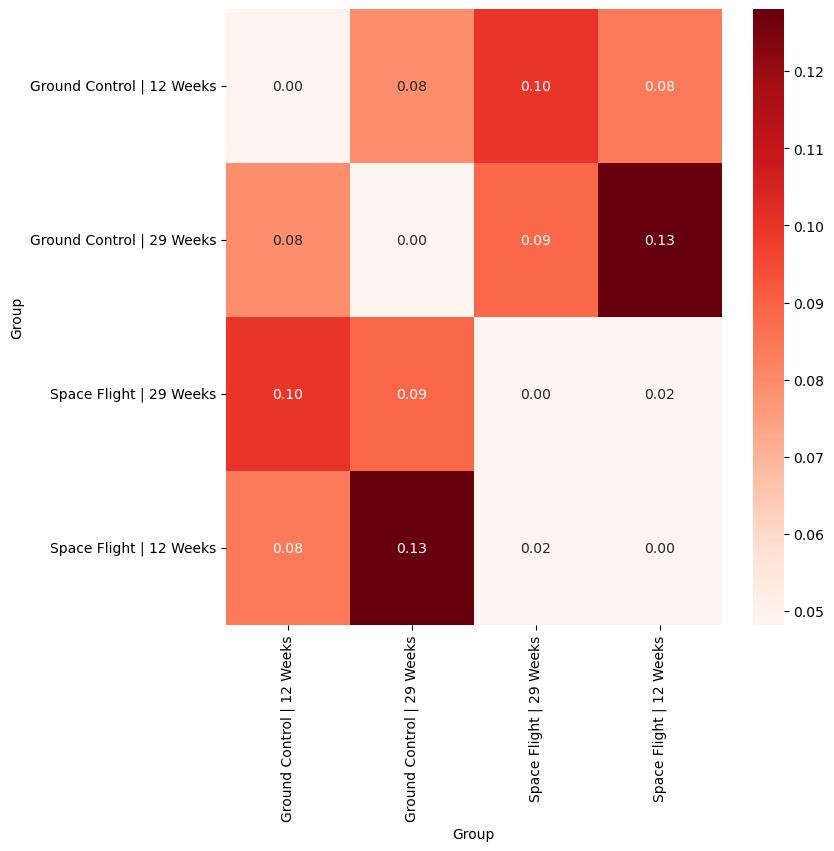

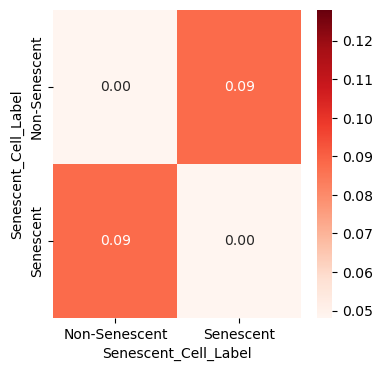

In [16]:
print(f"\n\n{'=' * 80}\nOverall Distance\n{'=' * 80}\n\n")
df_distance, figs_distance = scflow.ax.analyze_perturbation_distance(
    self.rna, col_condition=[col_age, col_condition, col_batch])

print(f"\n\n{'=' * 80}\nJust Senescence Genes\n{'=' * 80}\n\n")
df_distance_snc, figs_distance_snc = scflow.ax.analyze_perturbation_distance(
    self.rna[:, genes], col_condition=[
        col_age, col_condition, col_batch])

## Composition Analysis

### Cell Type

In [ ]:
print(f"\n\n{'=' * 80}\nOverall Sample\n{'=' * 80}\n\n")
out_ctc = scflow.ax.analyze_composition(
    self.rna, col_celltype, col_batch, col_sample=col_sample,
    palette=palette[col_batch],
    formula=None, key_modality="coda", reference_cell_type="automatic",
    absence_threshold=0.1, est_fdr=0.1, level_order=[keys[
        col_batch]["key_control"]] + keys[col_batch]["key_treatment"])
plt.show()

print(f"\n\n{'=' * 80}\nAged Subset\n{'=' * 80}\n\n")
out_ctc_sf = scflow.ax.analyze_composition(
    self.rna[self.rna.obs[col_age] != keys[col_age]["key_control"]],
    col_celltype, col_condition, col_sample=col_sample,
    formula=None, key_modality="coda", reference_cell_type="automatic",
    absence_threshold=0.1, est_fdr=0.1, level_order=[keys[col_condition][
        "key_control"]] + [keys[col_condition]["key_treatment"]])

### Senescent Cells



By Cell Type


• Zero counts encountered in data! Added a pseudocount of 0.5.


/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  

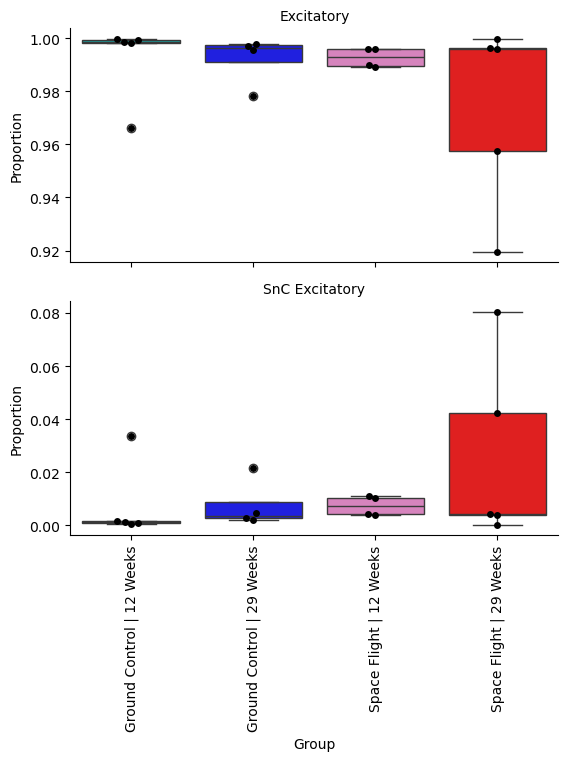

warmup:   8%| | 906/11000 [00:27<19:52,  8.46it/s, 1 steps of size 1.59e-16. ac

In [ ]:
# print(f"\n\n{'=' * 80}\nOverall Sample\n{'=' * 80}\n\n")
# out_ctc = scflow.ax.analyze_composition(
#     self.rna, "Senescent_Cell_Label", col_batch, col_sample=col_sample,
#     formula=None, key_modality="coda", reference_cell_type="Non-Senescent",
#     palette=palette[col_batch],
#     absence_threshold=0.1, est_fdr=0.1, seed=1618, level_order=[keys[
#         col_batch]["key_control"]] + keys[col_batch]["key_treatment"])
# plt.show()

# print(f"\n\n{'=' * 80}\nAged Subset\n{'=' * 80}\n\n")
# out_ctc_old = scflow.ax.analyze_composition(
#     self.rna[self.rna.obs[col_age] == keys[col_age]["key_treatment"]],
#     "Senescent_Cell_Label", col_condition, col_sample=col_sample,
#     palette=palette[col_batch],
#     formula=None, key_modality="coda", reference_cell_type="Non-Senescent",
#     absence_threshold=0.1, est_fdr=0.1, level_order=[keys[
#         col_condition]["key_control"]] + [
#             keys[col_condition]["key_treatment"]])

print(f"\n\n{'=' * 80}\nBy Cell Type\n{'=' * 80}\n\n")
out_ctc_ct = {}
for x in self.rna.obs[col_celltype].unique():
    out_ctc_ct[x] = scflow.ax.analyze_composition(
        self.rna[self.rna.obs[col_celltype] == x],
        "Senescent_Cell_Label_by_Type", col_batch, col_sample=col_sample,
        formula=None, key_modality="coda",
        palette=palette[col_batch], seed=1618,
        reference_cell_type=x, absence_threshold=0.1, est_fdr=0.1,
        level_order=[keys[col_batch]["key_control"]] + keys[
            col_batch]["key_treatment"])
    if overwrite is True or os.path.exists(
            f"outputs/scxcoda_results_{x}.pkl") is False:
        with open(f"outputs/sccoda_results_{x}.pkl", "wb") as f:
            pickle.dump(out_ctc_ct[x][0], f)
        out_ctc_ct[x][1].write_h5mu(f"outputs/sccoda_data_{x}.pkl")
    plt.show()

# print(f"\n\n{'=' * 80}\nBy Cell Type (Aged Subset)\n{'=' * 80}\n\n")
# ref_cell = self.rna.obs[col_celltype].value_counts().index.values[0]
# out_ctc = scflow.ax.analyze_composition(
#     self.rna[self.rna.obs[col_age] == keys[col_age]["key_treatment"]],
#     "Senescent_Cell_Label_by_Type", col_condition,
#     palette=palette[col_batch],
#     col_sample=col_sample, formula=None, absence_threshold=0.1, est_fdr=0.1,
#     level_order=[keys[col_condition]["key_control"]] + [
#         keys[col_condition]["key_treatment"]])

### SnCs (Ignore Age)

In [ ]:
print(f"\n\n{'=' * 80}\nBy Cell Type\n{'=' * 80}\n\n")
out_ctc_ct_ageag = {}
for x in self.rna.obs[col_celltype].unique():
    out_ctc_ct_ageag[x] = scflow.ax.analyze_composition(
        self.rna[self.rna.obs[col_celltype] == x],
        "Senescent_Cell_Label_by_Type", col_condition, col_sample=col_sample,
        palette=palette[col_condition],
        reference_cell_type=x, absence_threshold=0.1, est_fdr=0.1,
        level_order=[keys[col_batch]["key_control"]] + keys[
            col_batch]["key_treatment"])
    plt.show()

## Differential Gene Expression

Mainly using `edgeR`

### Age

**In older spaceflight mice compared to younger spaceflight mice**
* 9630013a20Rik (CNS myelination and neural tissue regeneration) is downregulated.
* mt-Td is upregulated.



Overall Sample


• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model


Ground Control Subset


• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model


Space Flight Subset


• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model


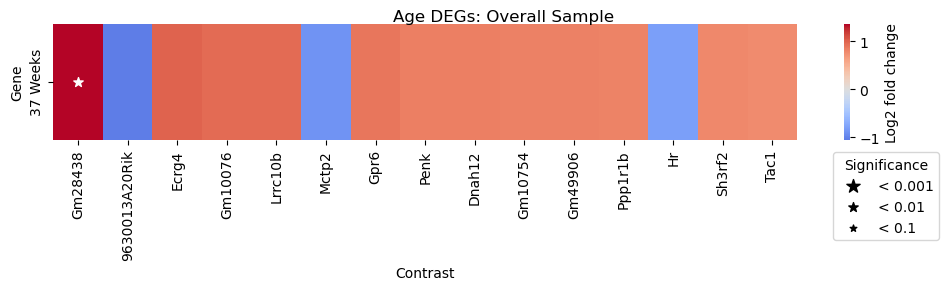

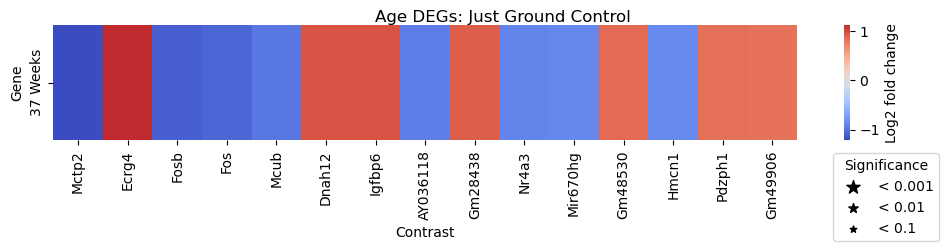

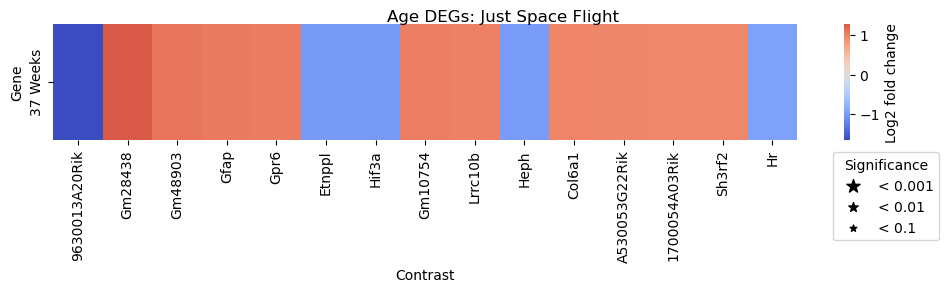

In [29]:
%matplotlib inline

# Overall
print(f"\n\n{'=' * 80}\nOverall Sample\n{'=' * 80}\n\n")
out_edgr_age = scflow.ax.run_deg_edgr(
    self.rna, col_age, col_covariate=None, formula=None,
    **keys[col_age], log2fc_thresh=0, n_top_vars=25,
    col_celltype=col_celltype, col_sample=col_sample,
    fig_title="Age DEGs: Overall Sample\n\n")

# Ground Control Subset
print(f"\n\n{'=' * 80}\nGround Control Subset\n{'=' * 80}\n\n")
out_edgr_age_gc = scflow.ax.run_deg_edgr(
    self.rna[self.rna.obs[col_condition] == keys[
        col_condition]["key_control"]],
    col_age, col_covariate=None, formula=None,
    **keys[col_age], log2fc_thresh=0, n_top_vars=25,
    col_celltype=col_celltype, col_sample=col_sample,
    fig_title="Age DEGs: Just Ground Control\n\n")

# Space Flight Subset
print(f"\n\n{'=' * 80}\nSpace Flight Subset\n{'=' * 80}\n\n")
out_edgr_age_sf = scflow.ax.run_deg_edgr(
    self.rna[self.rna.obs[col_condition] == keys[
        col_condition]["key_treatment"]],
    col_age, col_covariate=None, formula=None, **keys[col_age],
    log2fc_thresh=0, n_top_vars=25, col_celltype=col_celltype,
    col_sample=col_sample, fig_title="Age DEGs: Just Space Flight\n\n")

### Condition

```
out_edgr_con_o[0][(out_edgr_con_o[0].adj_p_value < 0.01) & (
    out_edgr_con_o[0].abs_log_fc > 0.5)].sort_values(
        "abs_log_fc", ascending=False)
```

Among the older mice, *Mir6236* was differentially highly expressed in aged spaceflight mice compared to ground control mice (LFC=1.95, adjusted p=2.61e-13 in the overall sample; LFC=2.11, adjusted p=0.000015 in the aged subset). Suppression of this gene has been linked to neuronal morphogenesis (https://pubs.acs.org/doi/abs/10.1021/acsabm.0c01389) and therefore may represent a candidate intervention target. 

*Il31ra*, which has been linked to neuroinflammation (https://advanced.onlinelibrary.wiley.com/doi/pdfdirect/10.1002/advs.202409086), was also more highly expressed in spaceflight mice compared to ground control mice (LFC=1.52, adjusted p<0.001 in the overall sample; LFC=1.53, adjusted p<0.001 in the aged subset).

*UBA52*, also more highly expressed in spaceflight mice (LFC=1.43, adjusted p<0.001 in the overall sample; LFC=1.45, adjusted p<0.001 in the aged subset), may serve a neuroprotective role: It has been shown underexpressed in PD (https://www.mdpi.com/2073-4409/11/23/3770) and plays a role in neuroautophagy (https://www.tandfonline.com/doi/pdf/10.1080/15548627.2024.2395727). Likewise, *Pomp*, a gene associated with oxidative stress resistance and protein clearance [CITATION] was also more highly expressed in spaceflight mice. In contrast to past observations of downregulation of *Uqcr11* in Alheimer's (https://www.benthamdirect.com/content/journals/car/10.2174/1567205014666170505095921), that gene was differentially highly expressed in spaceflight mice (LFC=1.23 aged subset; LFC=1.44 overall; p<0.001); however, *Cmss1*, which has been associated with Alzheimer's in APOE4 mice (https://pmc.ncbi.nlm.nih.gov/articles/PMC8064208/), was also more highly expressed in spaceflight mice.

Genes involved in oxidative phosphorylation and the electron transport chain, including *Atp5e*, *Ndufa12*, and *Uqcr11* were also more highly expressed in spaceflight mice. *Uqcr11* has shown an anti-apoptotic and oxidative stress alleviation role in mice (https://www.mdpi.com/2073-4425/16/5/526).

*Tpt1* and *Rn7sk* were also upregulated in spaceflight mice. *Tpt1*, which is associated with cancer progression, anti-apoptosis, and cell stress response, has been shown to have a potentially bi-directional relationship with cell cycle control gene and canonical senescence marker *TP53* (https://www.tandfonline.com/doi/pdf/10.4161/cc.25404). *Rn7sk* is associated with cellular senescence (https://onlinelibrary.wiley.com/doi/abs/10.1002/jcp.28119) and Alzheimer's (https://www.nature.com/articles/s41598-024-82490-9.pdf).

---

*Pvalb* overall sample (LFC=1.61, p=1.25e-11)

*Trim17*

*Cck*

*Pam16*

---

*Mitochondrial/electron transport chain genes whose upregulation has been linked to Parkinson's disease (https://pmc.ncbi.nlm.nih.gov/articles/PMC10259399/pdf/AMS-19-3-131629.pdf) and/or adaptive responses to neurodegeneration in Alheimer's mouse models (https://journals.sagepub.com/doi/abs/10.1177/13872877251314847), including *mt-Atp6*, *mt-Co1*, *mt-Cytb* *mt-Nd2*, and *mt-Nd5*, *mt-Nd6...pregulation of *mt-Rnr1*, which also showed higher expression in spaceflight aged mice, has been seen in response to ionizing radiation, possibly reflecting increased mitochonrial biogenesis as an adaptive stress response (https://pmc.ncbi.nlm.nih.gov/articles/PMC5555881)** 



Overall Sample


• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
     variable    log_fc    logCPM           F       p_value   adj_p_value      contrast  abs_log_fc significance
44    Mir6236  1.949094  8.159038   84.435148  9.711715e-16  2.610725e-13  Space Flight    1.949094      < 0.001
164   Gm48099  1.780488  2.819978   53.266077  1.135266e-11  8.323221e-10  Space Flight    1.780488      < 0.001
130   Gm10076  1.757596  3.404199   59.692926  1.379155e-12  1.273560e-10  Space Flight    1.757596      < 0.001
227   Gm28438  1.678793  5.879479   45.438617  4.617519e-10  2.442226e-08  Space Flight    1.678793      < 0.001
166     Pvalb  1.605108  3.555032   53.957324  1.248318e-11  9.042458e-10  Space Flight    1.605108      < 0.001
6       Atp5e  1.539489  5.428601  117.228802  6.211831e-20  1.073493e-16  Space Flight    1.539489      < 0.001
281   Gm15501  1.537294  1.927398   38.802

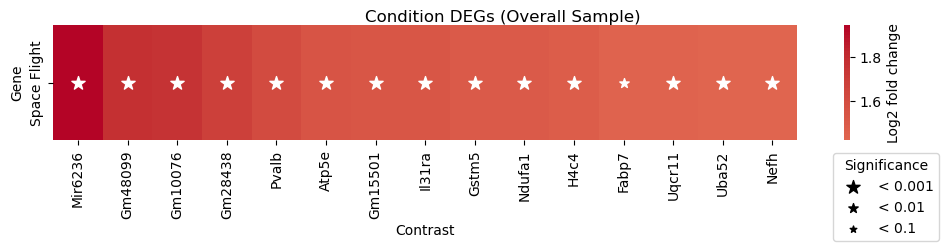



Aged Subset


• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model


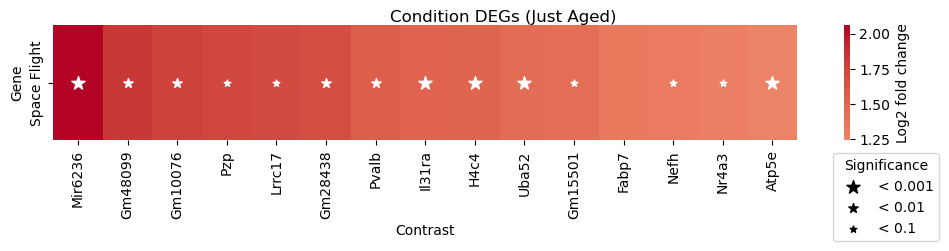

... storing 'Senescent_Cell_Label_senmayo' as categorical
... storing 'Senescent_Cell_Label_by_Type_senmayo' as categorical
... storing 'Senescent_Cell_Label' as categorical
... storing 'Senescent_Cell_Label_by_Type' as categorical


   variable    log_fc    logCPM          F       p_value  adj_p_value      contrast  abs_log_fc significance
0   Mir6236  2.063029  8.363280  46.492220  4.055211e-09     0.000049  Space Flight    2.063029      < 0.001
10   Il31ra  1.530428  4.129139  29.232213  7.627201e-07     0.000783  Space Flight    1.530428      < 0.001
1      H4c4  1.511849  3.253100  34.712152  8.279252e-08     0.000274  Space Flight    1.511849      < 0.001
4     Uba52  1.450167  4.645899  32.934334  2.208072e-07     0.000534  Space Flight    1.450167      < 0.001
3     Atp5e  1.242101  5.648002  36.015202  9.050973e-08     0.000274  Space Flight    1.242101      < 0.001
5    Uqcr11  1.237704  5.779053  32.530978  2.989400e-07     0.000603  Space Flight    1.237704      < 0.001
7      Tpt1  1.129632  7.072873  31.454011  4.715708e-07     0.000713  Space Flight    1.129632      < 0.001
9     Cox6c  1.107987  6.893087  30.186732  7.277902e-07     0.000783  Space Flight    1.107987      < 0.001
2     Cmss1  1.0523

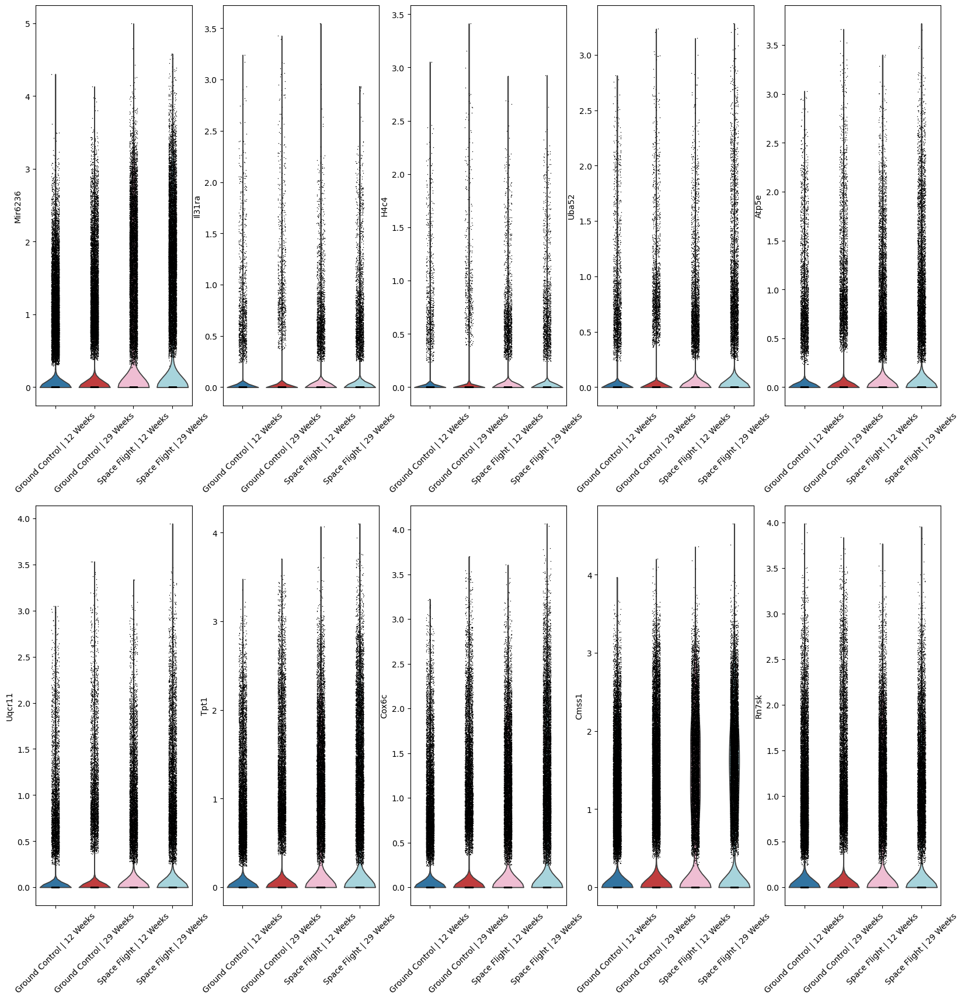

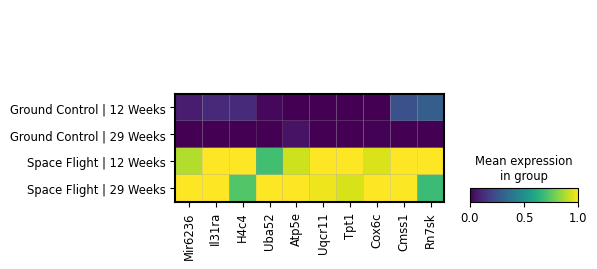

,log_fc_Aged_Subset,adj_p_value_Aged_Subset,log_fc_Overall_Sample,adj_p_value_Overall_Sample
variable,,,,
Mir6236,2.063029,0.000049,1.949094,2.610725e-13
Il31ra,1.530428,0.000783,1.524226,3.514933e-10
H4c4,1.511849,0.000274,1.491993,8.354753e-11
Uba52,1.450167,0.000534,1.428775,1.289738e-14
Atp5e,1.242101,0.000274,1.539489,1.073493e-16
Uqcr11,1.237704,0.000603,1.439361,2.813212e-16
Tpt1,1.129632,0.000713,1.380907,1.058347e-14
Cox6c,1.107987,0.000783,1.282000,1.687364e-15
Cmss1,1.052344,0.000274,0.992381,3.212392e-11


In [31]:
%matplotlib inline

# Overall
print(f"\n\n{'=' * 80}\nOverall Sample\n{'=' * 80}\n\n")
out_edgr_con = scflow.ax.run_deg_edgr(
    self.rna, col_condition, col_covariate=None, formula=None,
    **keys[col_condition], log2fc_thresh=0, n_top_vars=25,
    col_celltype=col_celltype, col_sample=col_sample,
    fig_title=f"{col_condition} DEGs (Overall Sample)\n\n")
out_edgr_con_df = out_edgr_con[0][out_edgr_con[
    0].adj_p_value < 0.001].sort_values("abs_log_fc", ascending=False)
goe = out_edgr_con_df.variable[:10].to_list()
print(out_edgr_con_df.iloc[:min(100, out_edgr_con_df.shape[0])], "\n\n", goe)
plt.show()

# Just Old
print(f"\n\n{'=' * 80}\nAged Subset\n{'=' * 80}\n\n")
out_edgr_con_o = scflow.ax.run_deg_edgr(
    self.rna[self.rna.obs[col_age] == keys[col_age]["key_treatment"]],
    col_condition, col_covariate=None, formula=None,
    **keys[col_condition], log2fc_thresh=0, n_top_vars=25,
    col_celltype=col_celltype, col_sample=col_sample,
    fig_title=f"{col_condition} DEGs (Just Aged)\n\n")
plt.show()
out_edgr_con_o_df = out_edgr_con_o[0][out_edgr_con_o[
    0].adj_p_value < 0.001].sort_values("abs_log_fc", ascending=False)
goes = out_edgr_con_o_df.variable[:10].to_list()
print(out_edgr_con_o_df, "\n\n", goes)
_ = self.plot(
    kind=["violin", "matrix"], col_celltype=col_batch, layer="log1p",
    violin=dict(col_wrap=5, hspace=0.25, rotation=45, figsize=(20, 20)),
    matrix=dict(standard_scale="var"), genes=goes)
out_edgr_old_sf_v_gc = out_edgr_con_o_df[0][(
    out_edgr_con_o_df[0].abs_log_fc > 1) & (
        out_edgr_con_o_df[0].adj_p_value < 0.001)].sort_values(
            "adj_p_value", ascending=True)
out_edgr_old_sf_v_gc = out_edgr_old_sf_v_gc.groupby("contrast").apply(
    lambda x: x.sort_values("adj_p_value", ascending=True).iloc[
        :20]).set_index("variable", append=True).reset_index(
            1, drop=True).rename_axis([col_condition, "variable"])
out_edgr_con_compare = out_edgr_con_o_df.set_index("variable")[[
    "log_fc", "adj_p_value"]].join(out_edgr_con_df.set_index("variable")[[
        "log_fc", "adj_p_value"]], how="inner", lsuffix="_Aged_Subset",
                                   rsuffix="_Overall_Sample")
out_edgr_con_compare

### Age x Condition

Spaceflight effect (main analysis), can visualize at different ages

*Chchd2* (related to oxidative phosphorylation, cell migration, apoptosis inhibition, COX regulation, stress adaptation, Parkinson's, Lewy Body diseases, and cancer) was more highly expressed in spaceflight mice (and demonstrated a bigger young versus old difference in spaceflight mice).
Spaceflight mice also showed higher expression of several ribosomal proteins (*Rps16*, *Rpl31*, *Rpl17*, *Rpl9*, *Rpl15*, *Rps15a*, *Rpl19*, *Rps7*, *Rps23*, *Rpl37*, *Rps3a1*, *Rpl29*, *Rps15*, *Rps14*).

*Ndufa4* was also more highly expressed (implicated in cancer and mitochondrial dysfunction, part of the cytochrome c oxidase complex which drives oxidative phosphorylation, adaptation to hypoxia via downregulation of oxygen consumption and suppression of mitochondrial ROS production https://www.cell.com/cell-metabolism/fulltext/S1550-4131(11)00394-9?mobileUi=0) in spaceflight mice, as were other genes involved in ATP production/the electron transport chain and oxidative phosophorylation, including *Cox7a2*, *Uqcr11*, *Ndufa12*, *Ndufa4*, *Ndufc1*, *Atp5o-1*, *Atp5e*, and *Uqcrh* (which additionally has been implicated in tumor suppression https://aacrjournals.org/cancerres/article/80/16_Supplement/4795/643367).




Group (Single Factor)


• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
['Ndufs8', 'Taco1', 'Uqcrb', 'Atp5e', 'Spcs1', 'Ubqln2', 'Snrpd2', 'Stk35', 'Psenen', 'Ndufa4', 'Mif', 'Tmsb10', 'AY036118', 'Atp6v0c', 'Chchd10', 'Cox7c', 'Ndufa13', 'Hsp90ab1', 'Ndufb11', 'Ddost', 'Ubb', 'Sco2', 'Bet1l', 'Atp5o-1', 'Ndufb10']


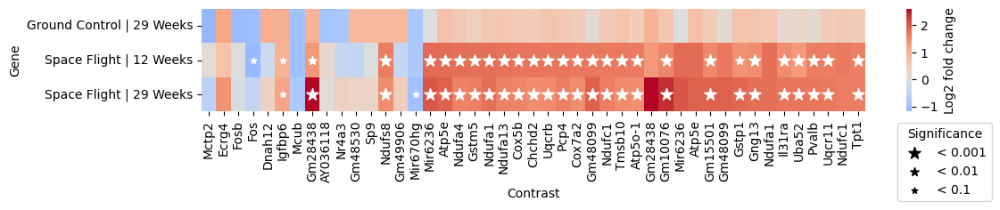



Age * Condition (2-Factor Contrast)


• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Performing pseudobulk for paired samples


/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  

None


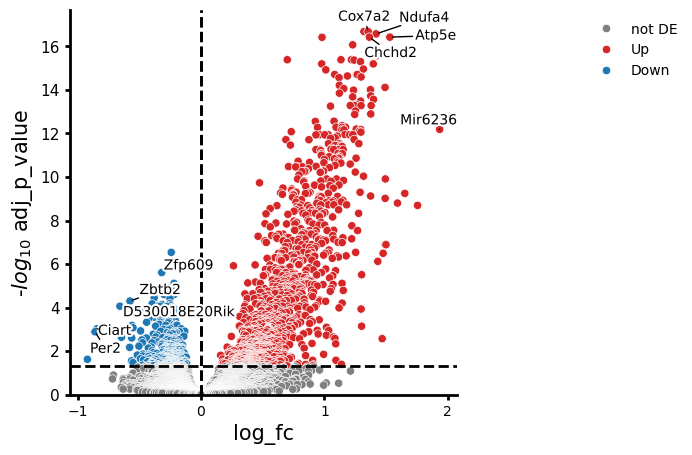

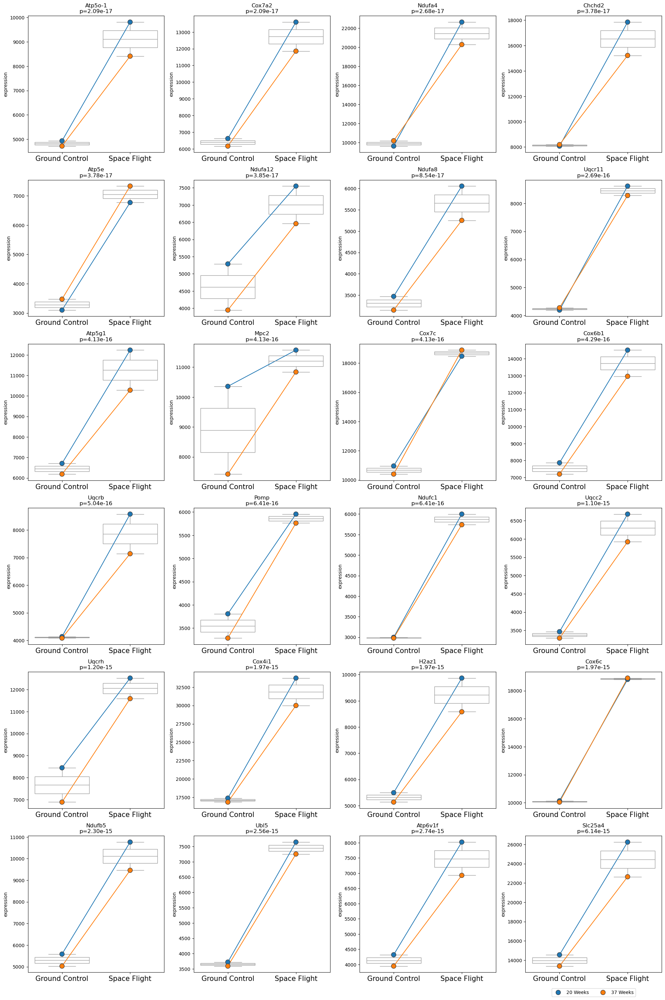

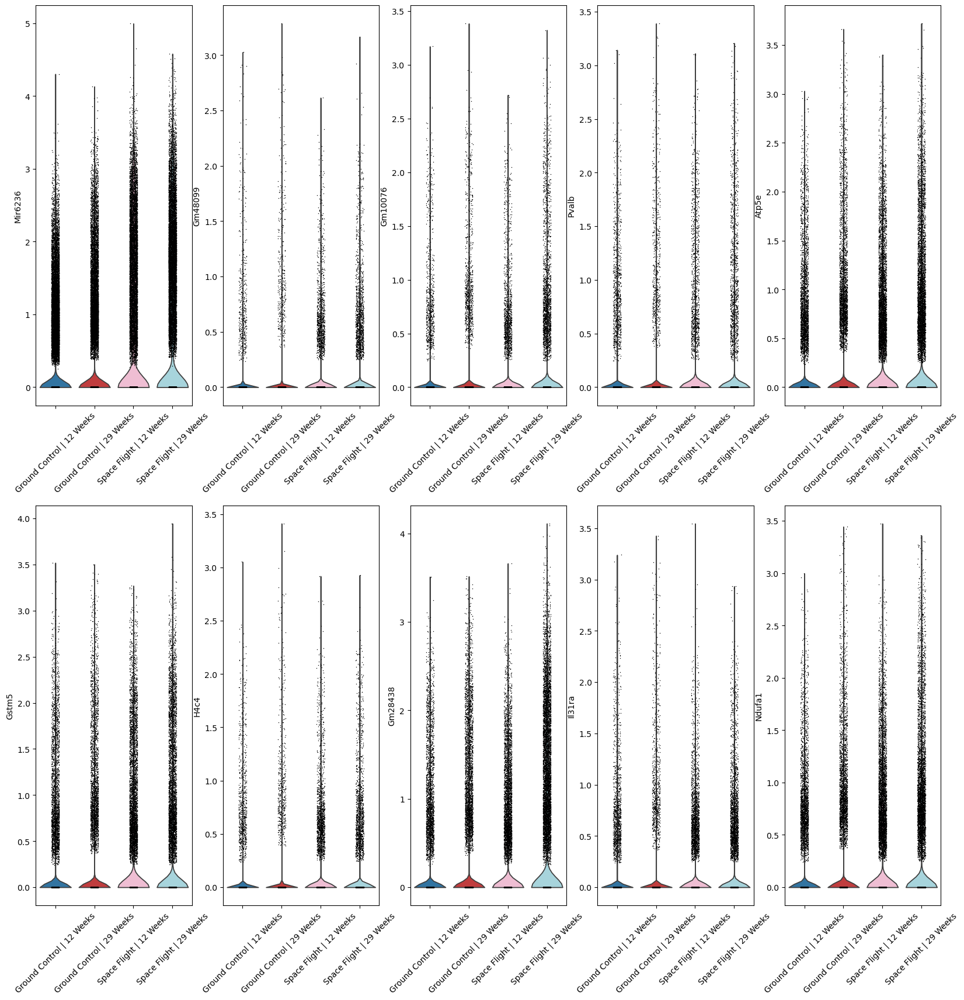

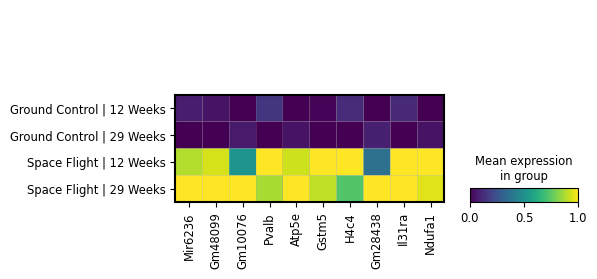

In [61]:
# With Single Label for Age x Condition
print(f"\n\n{'=' * 80}\nGroup (Single Factor)\n{'=' * 80}\n\n")
out_edgr_groups = scflow.ax.run_deg_edgr(
    self.rna, col_batch, col_covariate=None, formula=None,
    **keys[col_batch], col_sample=col_sample,
    log2fc_thresh=0, n_top_vars=25, col_celltype=col_celltype)
print(list(out_edgr_groups[0].variable[:25]))
plt.show()
# _ = self.plot(kind="violin", col_celltype=col_batch,
#               genes=list(out_edgr_groups[0].variable[:25]), layer="scaled",
#               violin=dict(col_wrap=4, hspace=1, rotation=45))
out_edgr_batches = out_edgr_groups[0][(out_edgr_groups[0].abs_log_fc > 1) & (
    out_edgr_groups[0].adj_p_value < 0.001)].sort_values(
        "adj_p_value", ascending=True)
out_edgr_batches_top = out_edgr_batches.groupby("contrast").apply(
    lambda x: x.sort_values("adj_p_value", ascending=True).iloc[
        :20]).set_index("variable", append=True).reset_index(
            1, drop=True).rename_axis([col_condition, "variable"])

# With Contrasts (Age & Condition = Separate Factors)
print(f"\n\n{'=' * 80}\nAge * Condition (2-Factor Contrast)\n{'=' * 80}\n\n")
out_edgr_contrasts = scflow.ax.run_deg_edgr(
    self.rna, col_condition, col_covariate=col_age, formula=None,
    **keys[col_condition], log2fc_thresh=0, n_top_vars=24,
    col_celltype=col_celltype, col_sample=col_sample)
_ = self.plot(
    kind=["violin", "matrix"], col_celltype=col_batch,
    genes=out_edgr_contrasts[0][out_edgr_contrasts[
        0].adj_p_value < 0.001].sort_values(
            "abs_log_fc", ascending=False).variable[:10], layer="log1p",
    violin=dict(col_wrap=5, hspace=0.25, rotation=45, figsize=(20, 20)),
    matrix=dict(standard_scale="var"))

### Condition x Age

Vulnerability of mice who were older at launch to spaceflight stress

• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Performing pseudobulk for paired samples


/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  

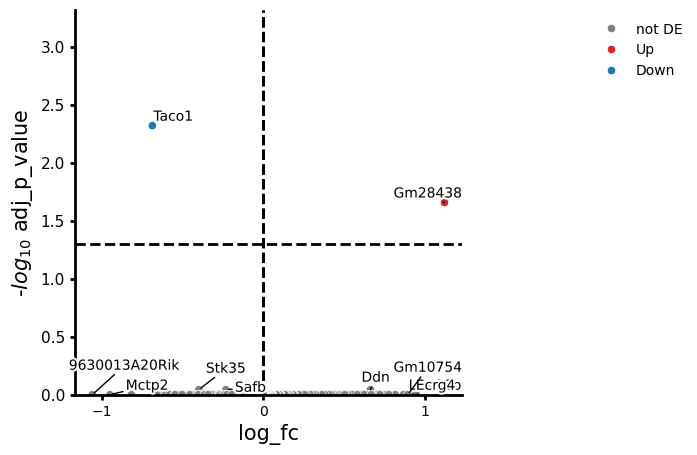

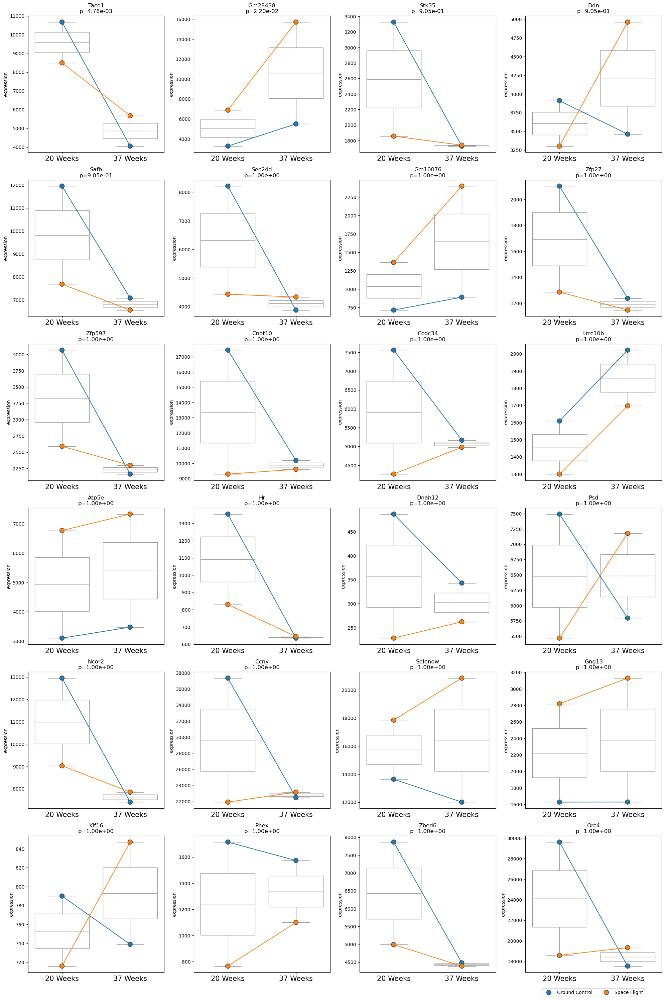

In [36]:
# With Contrasts (Age & Condition = Separate Factors)
out_edgr_contrasts_age = scflow.ax.run_deg_edgr(
    self.rna, col_age, col_covariate=col_condition, formula=None,
    **keys[col_age], log2fc_thresh=0, n_top_vars=24,
    col_celltype=col_celltype, col_sample=col_sample)

### Senescence Gene Contrasts Results

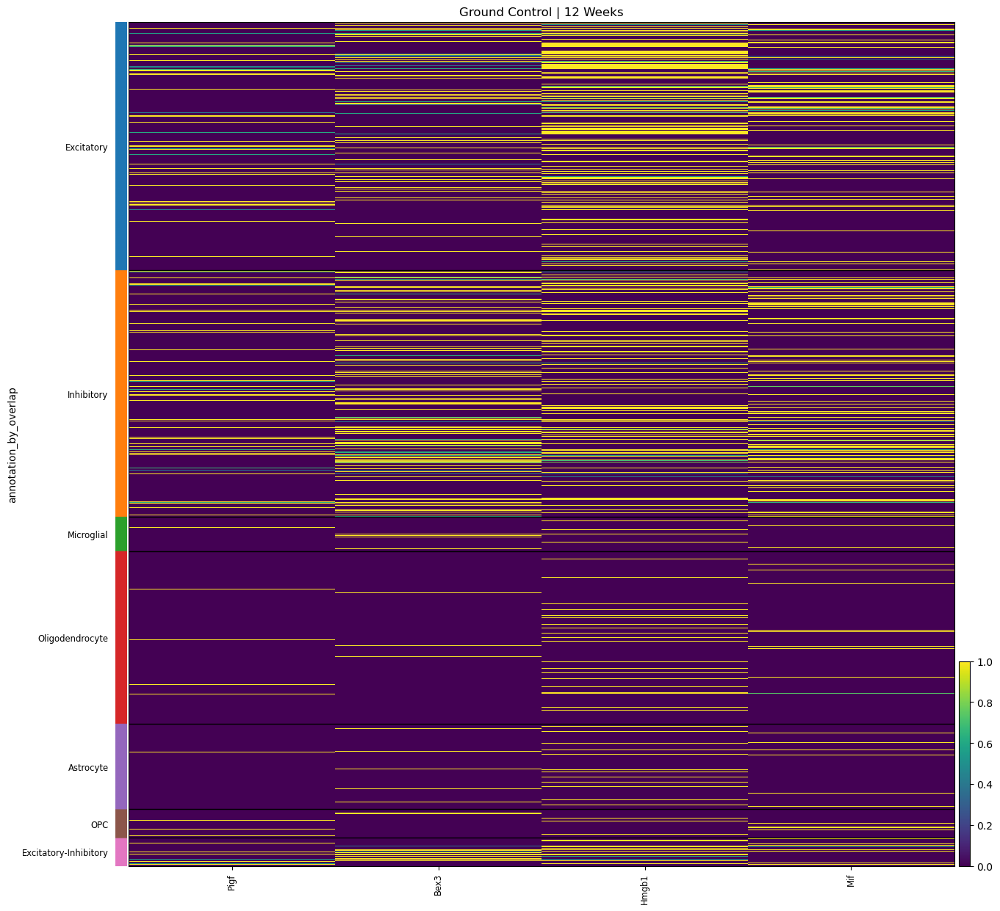

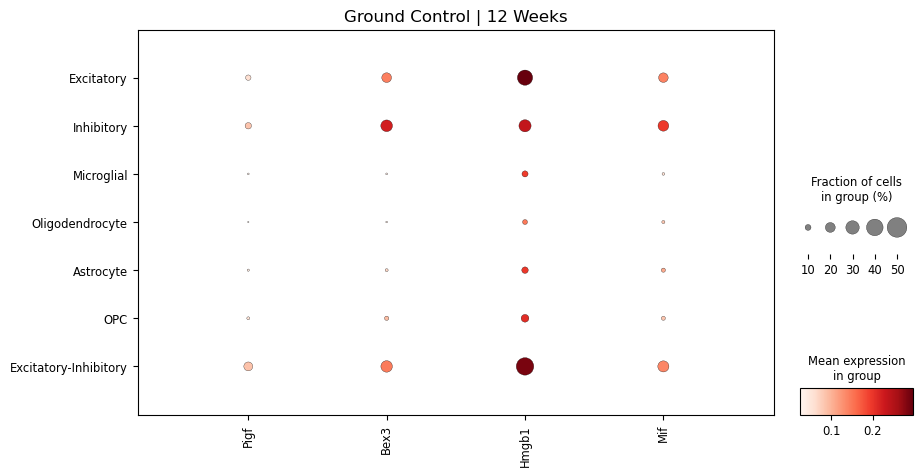

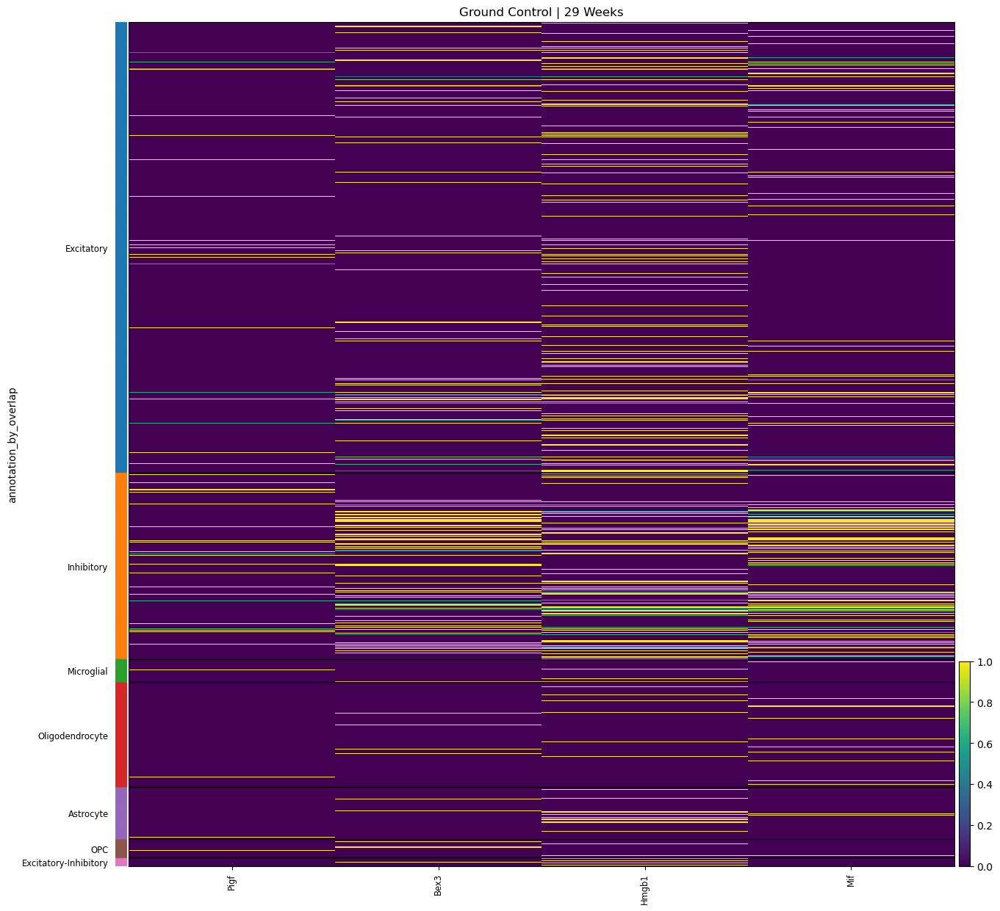

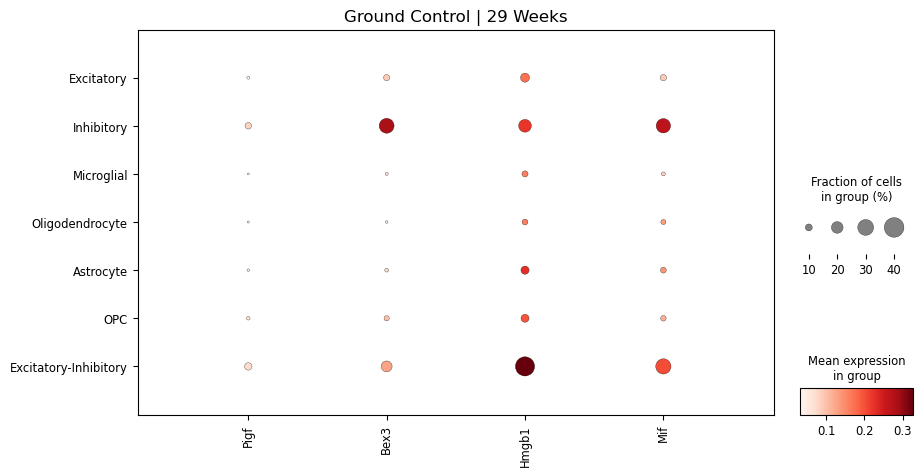

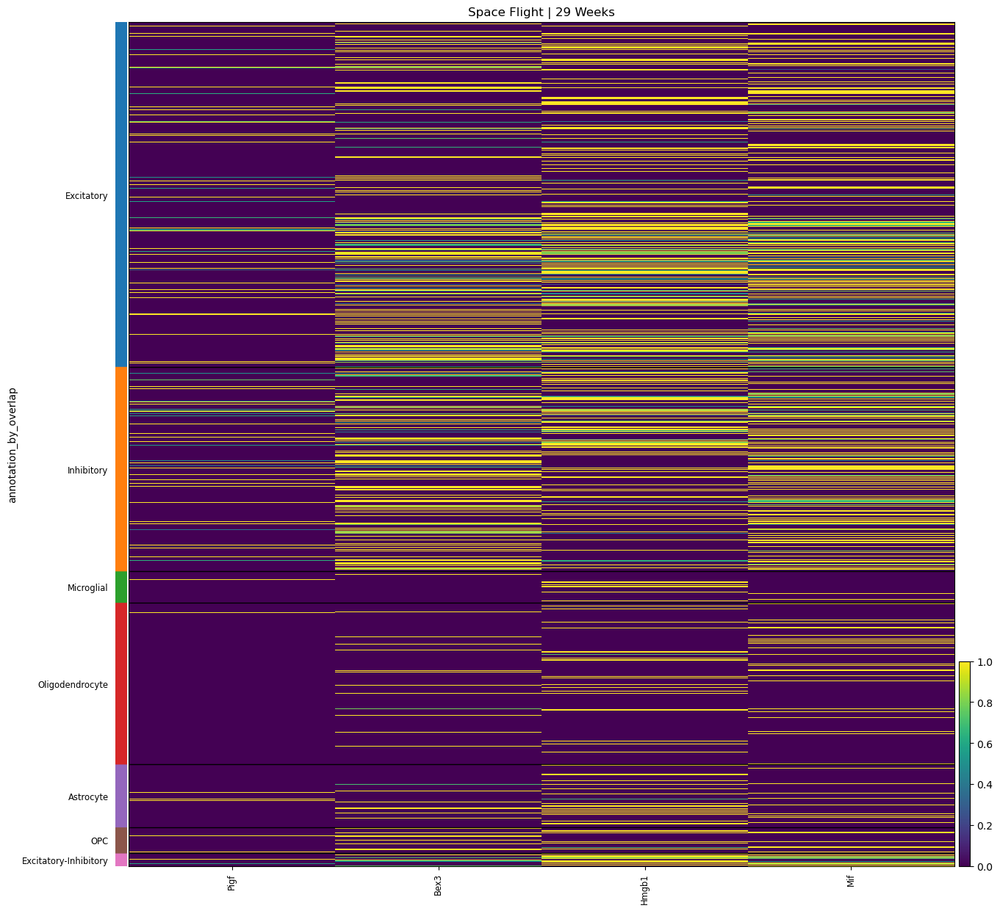

...

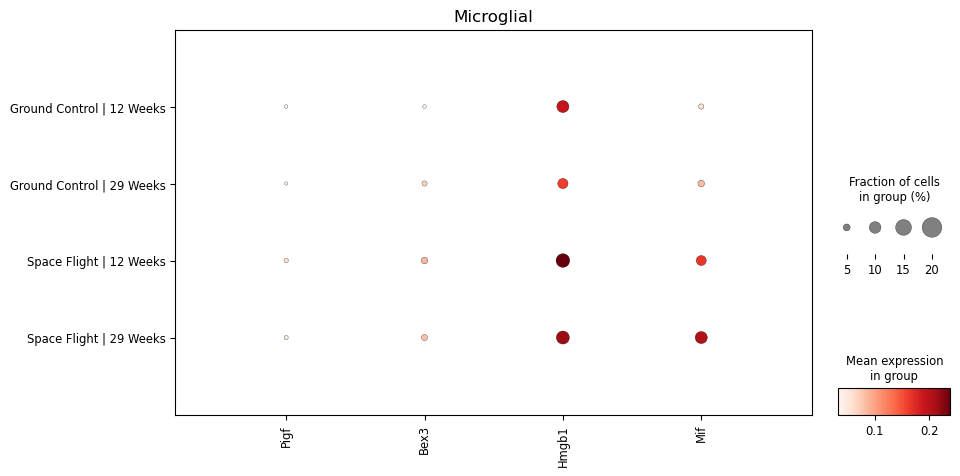

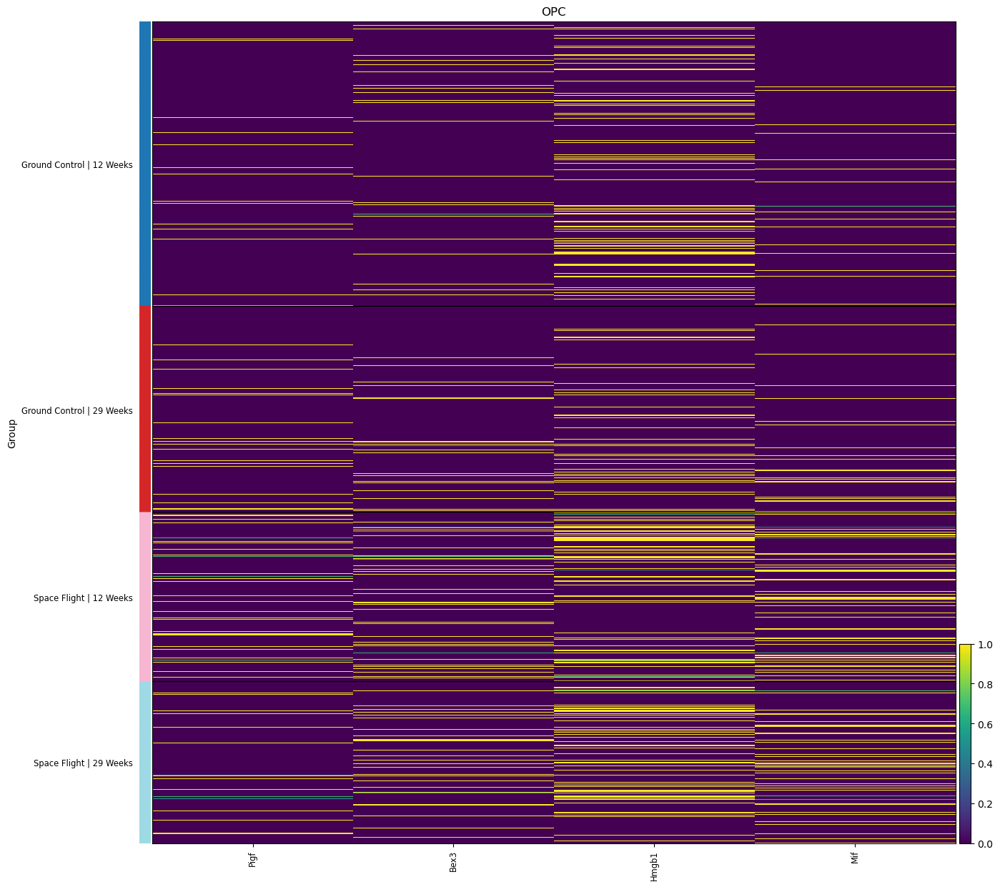

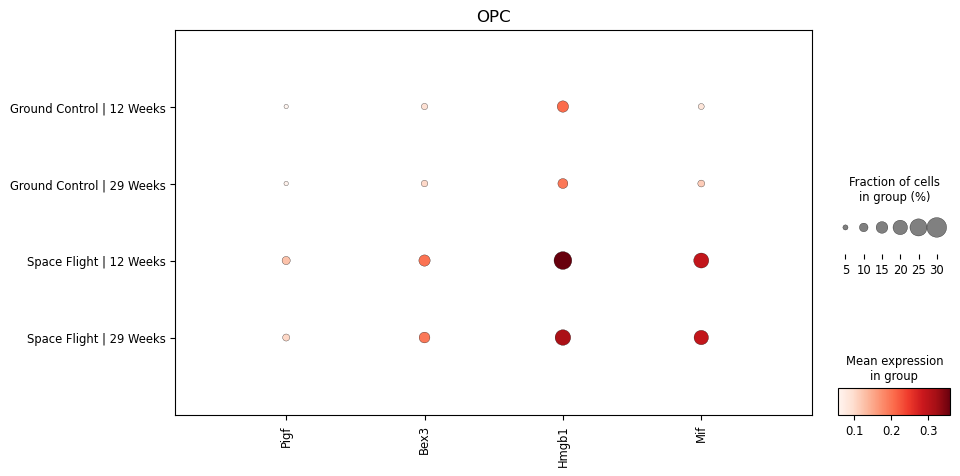

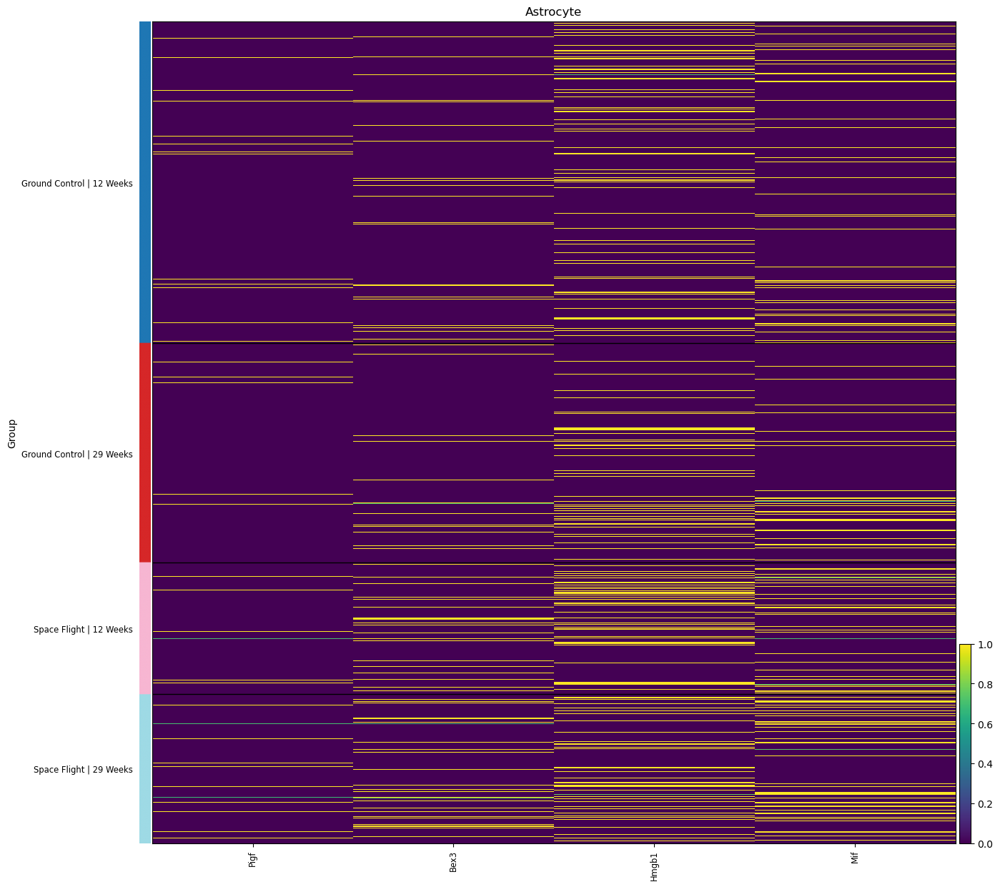

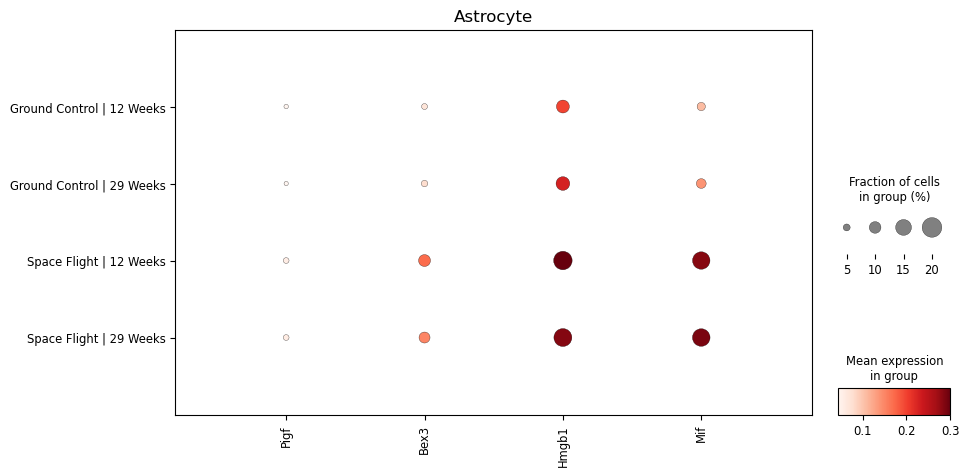


Significant Senescence Gene Contrasts

['Pigf', 'Bex3', 'Hmgb1', 'Mif']


,log_fc,logCPM,F,p_value,adj_p_value,contrast,abs_log_fc
variable,,,,,,,
Pigf,0.351961,3.954538,13.143226,4.024638e-04,5.212639e-03,None,0.351961
Bex3,0.953014,5.195395,42.328285,1.485855e-09,7.042051e-08,None,0.953014
Hmgb1,0.400718,6.081534,16.838421,7.199312e-05,1.145922e-03,None,0.400718
Mif,1.143501,5.730556,82.364941,1.637643e-15,4.402347e-13,None,1.143501


In [37]:
# Genes
sen_genes_in_contrasts = list(set(genes).intersection(
    out_edgr_contrasts[0].variable.unique()))  # senescence genes in contrasts
out_edgr_snc = out_edgr_contrasts[0].set_index(
    "variable").loc[sen_genes_in_contrasts]  # contrast results for snc genes
res_snc_contrast = out_edgr_snc[out_edgr_snc.adj_p_value < 0.01]  # p < 0.01
sig_contrast_genes = list(res_snc_contrast.index.values)  # significant genes

# Plots By Groups; Axis by Cell Types
kws = dict(dot=dict(figsize=(10, 5)), heat=dict(figsize=(15, 15)))
_ = self.plot(kind=["heat", "dot"], genes=sig_contrast_genes,
              standard_scale="obs", col_celltype=col_celltype,
              by_group=col_batch, **kws)

# Plots By Cell Types; Axis by Groups
# kws = dict(dot=dict(figsize=(10, 5)), heat=dict(figsize=(15, 15)),
#            violin=dict(figsize=(30, 20), col_wrap=4, xlabel=None,
#                        rotation=45, hspace=1, top=0.95))
kws = dict(dot=dict(figsize=(10, 5)), heat=dict(figsize=(15, 15)))
_ = self.plot(kind=["heat", "dot"], genes=sig_contrast_genes,
              standard_scale="obs", col_celltype=col_batch,
              by_group=col_celltype, **kws)

# Results
print(f"\n{'=' * 80}\nSignificant Senescence Gene Contrasts\n{'=' * 80}\n")
print(sig_contrast_genes)
res_snc_contrast

### SnC DEGs

#### SnCs vs. Not

*Slc23a2*

##### Overall

• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Performing pseudobulk for paired samples


/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  

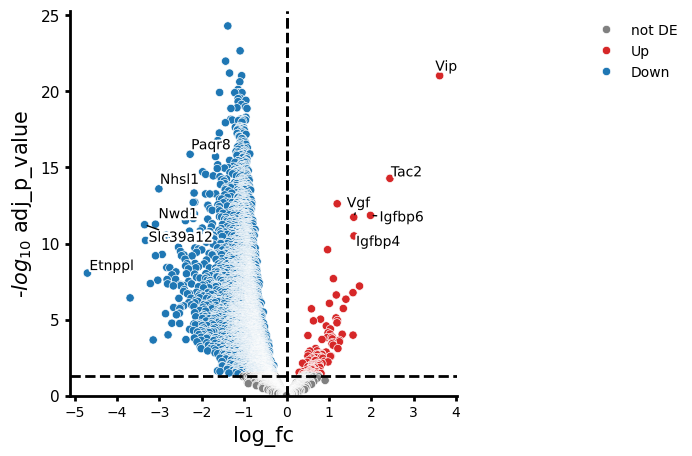

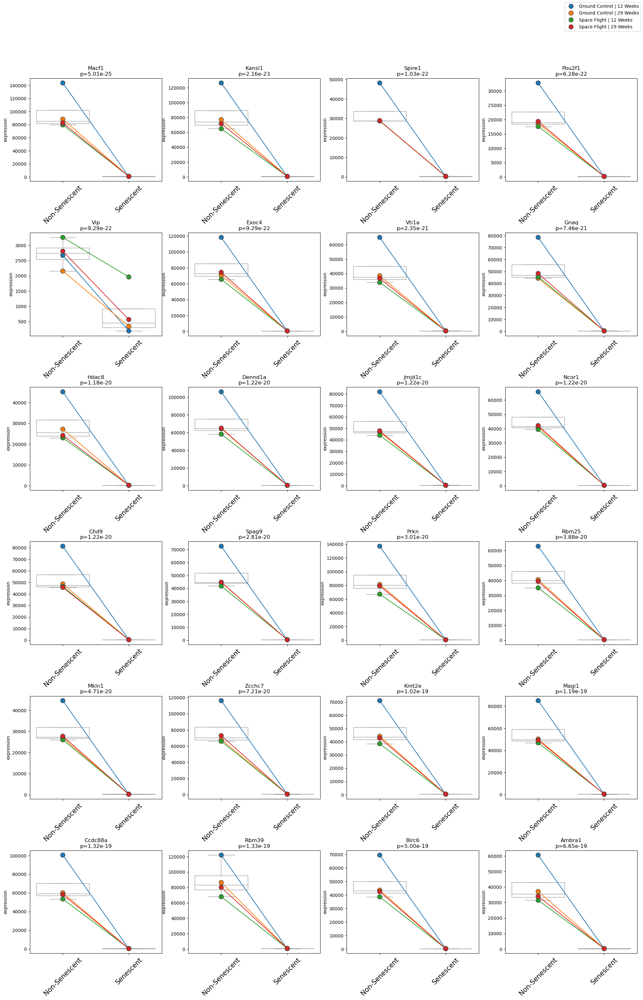

In [32]:
out_edgr_contrasts_snc = scflow.ax.run_deg_edgr(
    self.rna, "Senescent_Cell_Label",
    col_covariate=col_batch, formula=None,
    key_treatment="Senescent", key_control="Non-Senescent",
    log2fc_thresh=0, n_top_vars=24, xlabel_rotation=45,
    hspace=0.5, wspace=0.2, top=0.92, legend_loc="upper right",
    col_celltype=col_celltype, col_sample=col_sample)

##### Rank Genes Groups

In [225]:
res_rank_genes, p_threshold = {}, 1e-10
for x in self.rna.obs[col_batch].unique():
    res_rank_genes[x] = {}
    for c in self.rna.obs[self.rna.obs[col_batch] == x][col_celltype].unique():
        s_iter = (self.rna.obs[col_batch] == x) & (self.rna.obs[
            "Senescent_Cell_Label_by_Type"].isin([c, f"SnC {c}"]))
        tmp = sc.tl.rank_genes_groups(
            self.rna[s_iter], "Senescent_Cell_Label_by_Type", rankby_abs=True,
            layer="log1p", groups=[c, f"SnC {c}"], reference=c, copy=True)
        res_rank_genes[x][c] = sc.get.rank_genes_groups_df(
            tmp, f"SnC {c}", pval_cutoff=p_threshold)
    tmp = sc.tl.rank_genes_groups(
            self.rna[self.rna.obs[col_batch] == x],
            "Senescent_Cell_Label", rankby_abs=True,
            layer="log1p", reference="Non-Senescent", copy=True)
    res_rank_genes[x]["Overall"] = sc.get.rank_genes_groups_df(
            tmp, f"Senescent", pval_cutoff=p_threshold)
    res_rank_genes[x] = pd.concat(res_rank_genes[x], names=[col_celltype])
res_rank_genes = pd.concat(res_rank_genes, names=[col_batch])
res_rank_genes = res_rank_genes.assign(
    logfoldchanges_abs=res_rank_genes.logfoldchanges.abs())
res_rank_genes_top = res_rank_genes.reset_index().groupby([
    col_batch, col_celltype]).apply(
        lambda x: x.sort_values("logfoldchanges_abs").iloc[:20],
        include_groups=False).reset_index(2, drop=True).set_index(
            "names", append=True).rename_axis([
                col_batch, col_celltype, "variable"])
res_rank_genes_top

... storing 'scCODA_sample_id' as categorical
... storing 'scCODA_sample_id' as categorical
... storing 'scCODA_sample_id' as categorical
... storing 'scCODA_sample_id' as categorical
... storing 'scCODA_sample_id' as categorical
... storing 'scCODA_sample_id' as categorical
... storing 'scCODA_sample_id' as categorical
... storing 'scCODA_sample_id' as categorical
... storing 'scCODA_sample_id' as categorical
... storing 'scCODA_sample_id' as categorical
... storing 'scCODA_sample_id' as categorical
... storing 'scCODA_sample_id' as categorical
... storing 'scCODA_sample_id' as categorical
... storing 'scCODA_sample_id' as categorical
... storing 'scCODA_sample_id' as categorical
... storing 'scCODA_sample_id' as categorical
... storing 'scCODA_sample_id' as categorical
... storing 'scCODA_sample_id' as categorical
... storing 'scCODA_sample_id' as categorical
... storing 'scCODA_sample_id' as categorical
... storing 'scCODA_sample_id' as categorical
... storing 'scCODA_sample_id' as 

level_2     scores  logfoldchanges         pvals     pvals_adj  logfoldchanges_abs
Group                     annotation_by_overlap variable                                                                                    
Ground Control | 12 Weeks Astrocyte             Paqr8         582 -11.625196       -3.957662  2.459272e-13  1.731654e-12            3.957662
                                                Brinp3        765 -10.685084       -3.974858  1.843256e-12  1.225158e-11            3.974858
                                                Nrxn2         744 -10.750609       -4.002379  2.766084e-13  1.937540e-12            4.002379
                                                Fgf14         563 -11.757295       -4.031304  2.039633e-13  1.445581e-12            4.031304
                                                Grm3          834 -10.358327       -4.042312  6.421581e-12  4.112328e-11            4.042312
...                                                           ...        ...             ...           ...           ...                 ...
Space Flight | 29 Weeks   Overall               Ccser1        184  -7.551204       -0.874172  2.517150e-13  1.645944e-11            0.874172
                                                Prickle1      215  -7.282249       -0.879054  1.517610e-12  8.499319e-11            0.879054
                                                Kcnq1ot1      176  -7.600009       -0.881908  1.812542e-13  1.224934e-11            0.881908
                                                Kalrn         197  -7.432727       -0.883547  5.562165e-13  3.398258e-11            0.883547
                                                Dst           113  -8.208591       -0.890387  2.550492e-15  2.659767e-13            0.890387

[640 rows x 6 columns]

##### By Condition (Just Aged)



Spaceflight (Aged)


• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model


KeyError: 'Space Flight'

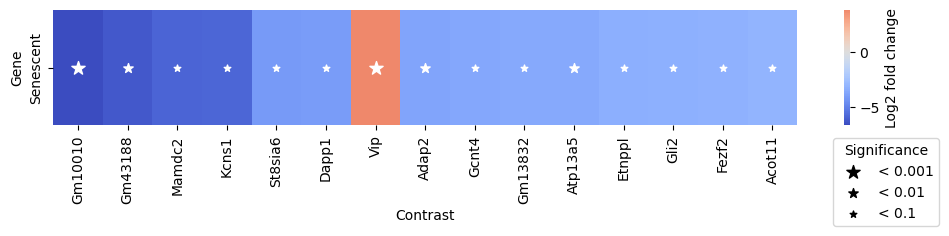

In [143]:
# Ager Subset
subset_old = self.rna.obs[col_age] == keys[col_age]["key_treatment"]

# Old Ground Control SnCs
print(f"\n\n{'=' * 80}\nGround Control (Aged)\n{'=' * 80}\n\n")
subset_gc = self.rna.obs[col_condition] == keys[
    col_condition]["key_control"]
out_edgr_contrasts_snc_gc = scflow.ax.run_deg_edgr(
    self.rna[subset_gc & subset_old], "Senescent_Cell_Label",
    key_treatment="Senescent", top=0.92,
    key_control="Non-Senescent", log2fc_thresh=0, n_top_vars=24,
    xlabel_rotation=45, hspace=0.5, wspace=0.2, legend_loc="upper right",
    col_celltype=col_celltype, col_sample=col_sample)
if len(self.rna[subset_gc & subset_old].obs[col_batch].unique()) > 1:
    raise ValueError("Check subsetting")
key_1 = self.rna[subset_gc & subset_old].obs[col_batch].unique()[0]

# Old Spaceflight SnCs
print(f"\n\n{'=' * 80}\nSpaceflight (Aged)\n{'=' * 80}\n\n")
subset_sf = self.rna.obs[col_condition] == keys[
    col_condition]["key_treatment"]
out_edgr_contrasts_snc_sf = scflow.ax.run_deg_edgr(
    self.rna[subset_sf & subset_old], "Senescent_Cell_Label",
    key_treatment="Senescent", key_control="Non-Senescent",
    log2fc_thresh=0, n_top_vars=24, xlabel_rotation=45,
    hspace=0.5, wspace=0.2, top=0.92, legend_loc="upper right",
    col_celltype=col_celltype, col_sample=col_sample)
if len(self.rna[subset_sf & subset_old].obs[col_batch].unique()) > 1:
    raise ValueError("Check subsetting")
key_2 = self.rna[subset_sf & subset_old].obs[col_batch].unique()[0]

# Compare
res_snc_gc = out_edgr_contrasts_snc_gc[0][out_edgr_contrasts_snc_gc[
    0].adj_p_value < 0.001].sort_values("adj_p_value").set_index("variable")
res_snc_sf = out_edgr_contrasts_snc_sf[0][out_edgr_contrasts_snc_sf[
    0].adj_p_value < 0.001].sort_values("adj_p_value").set_index("variable")
res_snc_grps = pd.concat([
    res_snc_gc, res_snc_sf], keys=[key_1, key_2], names=[col_condition])
res_snc_grps = res_snc_grps[res_snc_grps.abs_log_fc >= 1]
# top_tx_g_snc = res_snc_grps.loc[keys[col_condition][
#     "key_treatment"]].sort_values("abs_log_fc", ascending=False).index
# print(res_snc_grps.unstack(0).replace(np.nan, "")[[
#     "log_fc", "adj_p_value"]].loc[top_tx_g_snc])
# just_sf = res_snc_grps.loc[keys[col_condition][
#     "key_treatment"]].index.difference(res_snc_grps.loc[keys[
#         col_condition]["key_control"]].index)
# just_gc = res_snc_grps.loc[keys[col_condition][
#     "key_control"]].index.difference(res_snc_grps.loc[keys[
#         col_condition]["key_treatment"]].index)
# print(res_snc_grps.loc[:, just_gc, :].sort_values(
#     "abs_log_fc", ascending=False)[["log_fc", "adj_p_value"]], "\n\n")
# res_snc_grps.loc[:, just_sf, :].sort_values(
#     "abs_log_fc", ascending=False)[["log_fc", "adj_p_value"]]
res_snc_grps.unstack(0).replace(np.nan, "")[["log_fc", "adj_p_value"]]

#### SnC as Covariate



Age = 20 Weeks


• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Performing pseudobulk for paired samples


/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  

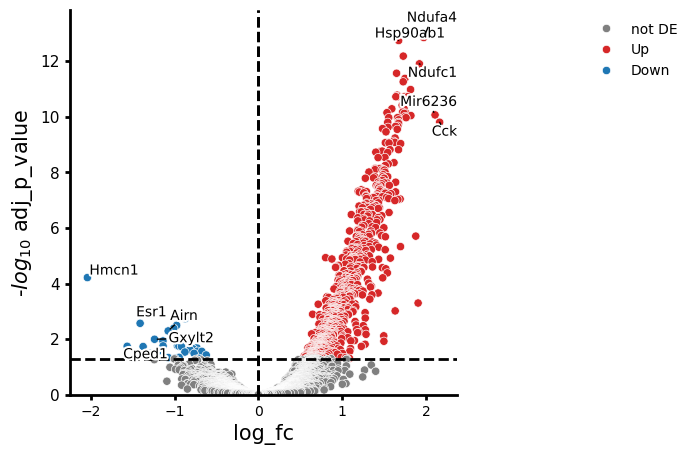

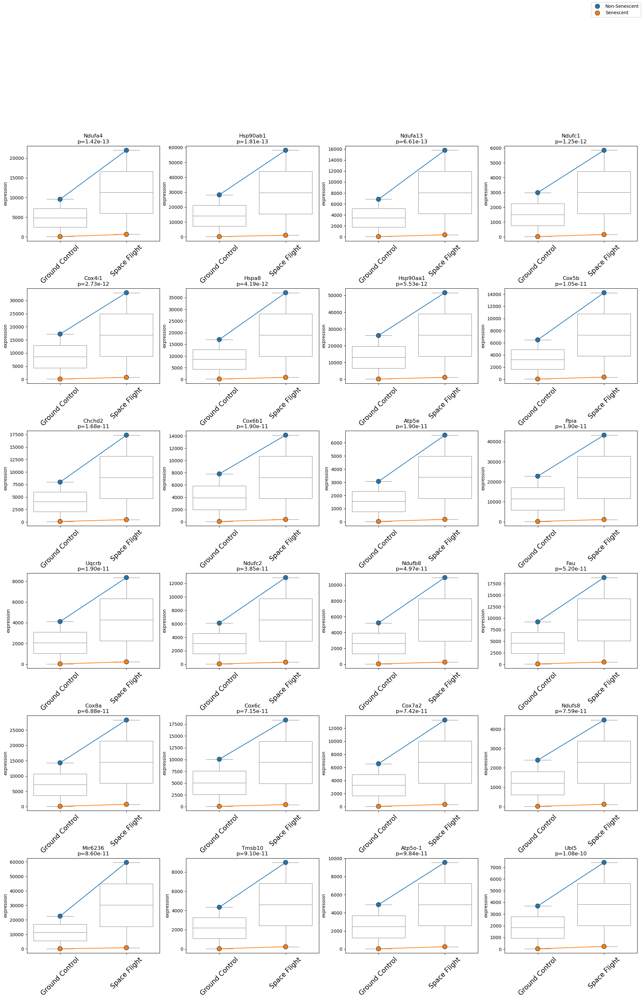



Age = 37 Weeks


• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Performing pseudobulk for paired samples


/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  

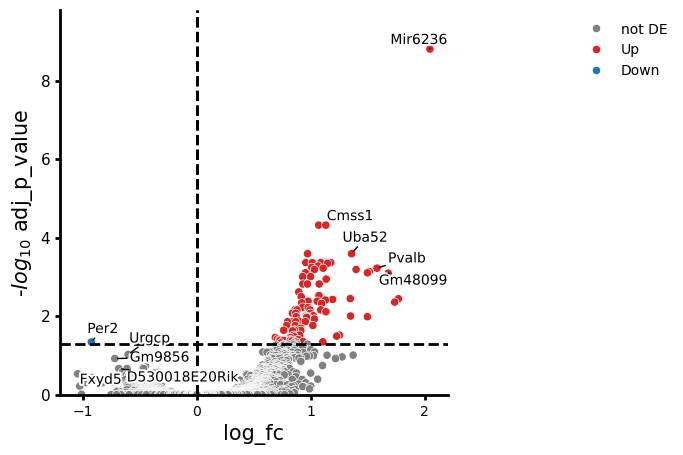

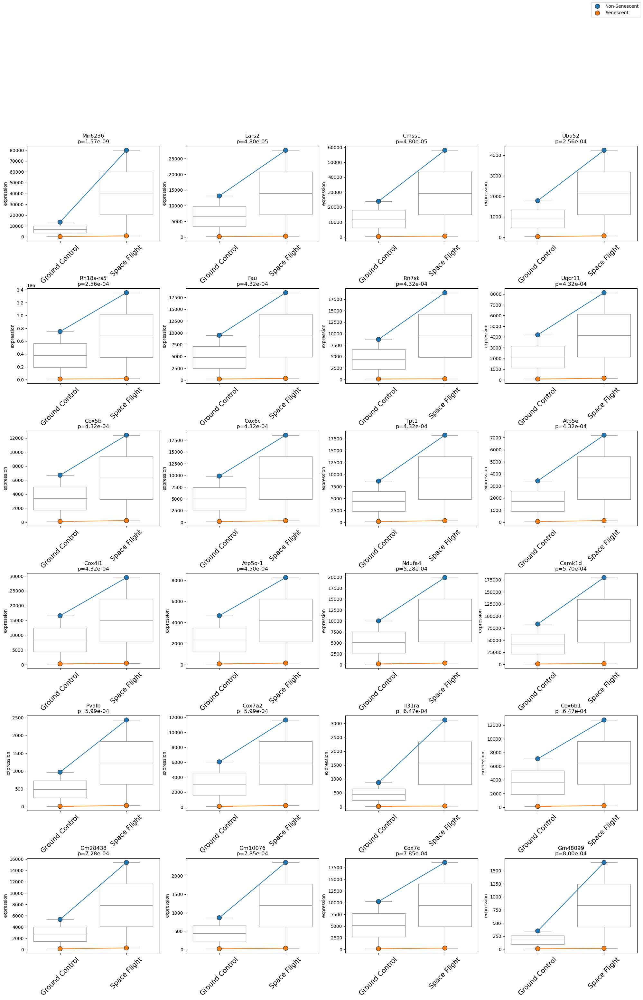

In [33]:
out_edgr_contrasts_snc_cov = {}
for a in self.rna.obs[col_age].unique():
    print(f"\n\n{'=' * 80}\nAge = {a}\n{'=' * 80}\n\n")
    out_edgr_contrasts_snc_cov[a] = scflow.ax.run_deg_edgr(
        self.rna[self.rna.obs[col_age] == a], col_condition,
        col_covariate="Senescent_Cell_Label",
        **keys[col_condition], log2fc_thresh=0, n_top_vars=24,
        xlabel_rotation=45, hspace=0.5, wspace=0.2, top=0.85,
        legend_loc="upper right", col_celltype=col_celltype,
        col_sample=col_sample)
    plt.show()

#### Just SnCs

##### All Groups SnCs

• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
['Ndufs8', 'Taco1', 'Uqcrb', 'Atp5e', 'Spcs1', 'Ubqln2', 'Snrpd2', 'Stk35', 'Psenen', 'Ndufa4', 'Mif', 'Tmsb10', 'AY036118', 'Atp6v0c', 'Chchd10', 'Cox7c', 'Ndufa13', 'Hsp90ab1', 'Ndufb11', 'Ddost', 'Ubb', 'Sco2', 'Bet1l', 'Atp5o-1', 'Ndufb10']


/tmp/ipykernel_939743/4169309774.py:10: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  out_edgr_batches_top = out_edgr_batches.groupby("contrast").apply(


TypeError: show() got an unexpected keyword argument 'dpi'

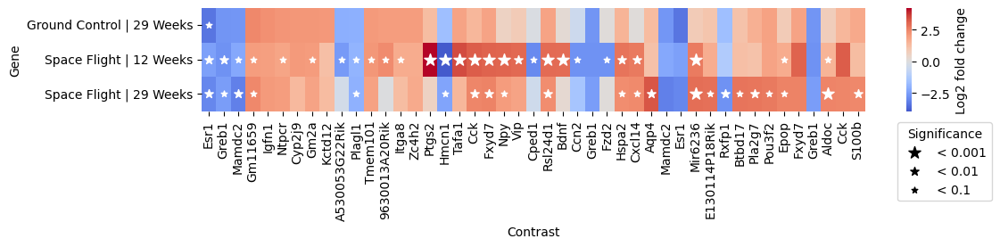

In [ ]:
out_edgr_groups_snc = scflow.ax.run_deg_edgr(
    self.rna[(self.rna.obs["Senescent_Cell_Label"] == "Senescent")],
    col_batch, **keys[col_batch], col_sample=col_sample,
    log2fc_thresh=0, n_top_vars=25, col_celltype=col_celltype)
print(list(out_edgr_groups[0].variable[:25]))
out_edgr_batches_snc = out_edgr_groups[0][(
    out_edgr_groups[0].abs_log_fc > 1) & (
        out_edgr_groups[0].adj_p_value < 0.001)].sort_values(
            "adj_p_value", ascending=True)
out_edgr_batches_top = out_edgr_batches.groupby("contrast").apply(
    lambda x: x.sort_values("adj_p_value", ascending=True).iloc[
        :20]).set_index("variable", append=True).reset_index(
            1, drop=True).rename_axis([col_condition, "variable"])
plt.show()

##### SF vs. Aged GC

• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
['Ndufs8', 'Taco1', 'Uqcrb', 'Atp5e', 'Spcs1', 'Ubqln2', 'Snrpd2', 'Stk35', 'Psenen', 'Ndufa4', 'Mif', 'Tmsb10', 'AY036118', 'Atp6v0c', 'Chchd10', 'Cox7c', 'Ndufa13', 'Hsp90ab1', 'Ndufb11', 'Ddost', 'Ubb', 'Sco2', 'Bet1l', 'Atp5o-1', 'Ndufb10']


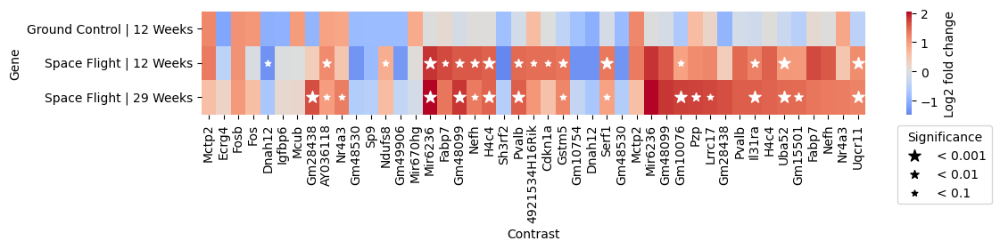

In [98]:
# subs_old = self.rna.obs[col_age] == keys[col_age]["key_treatment"]
# subs_sf = self.rna.obs[col_condition] == keys[
#     col_condition]["key_treatment"]
# subs_noynggc_snc = (self.rna.obs[
#     "Senescent_Cell_Label"] == "Senescent") & (
#     subs_old | subs_sf)
# # ktx = keys[col_batch]["key_treatment"][1:]
# ktx = [keys[col_batch]["key_control"]] + keys[
#     col_batch]["key_treatment"][1:]
# out_edgr_groups_snc = scflow.ax.run_deg_edgr(
#     # self.rna[subs_noynggc_snc],
#     self.rna,
#     col_batch, col_sample=col_sample,
#     key_control=keys[col_batch]["key_treatment"][0],
#     key_treatment=ktx,
#     log2fc_thresh=0, n_top_vars=25, col_celltype=col_celltype)
# print(list(out_edgr_groups[0].variable[:25]))
# out_edgr_batches_snc = out_edgr_groups[0][(
#     out_edgr_groups[0].abs_log_fc > 1) & (
#         out_edgr_groups[0].adj_p_value < 0.001)].sort_values(
#             "adj_p_value", ascending=True)
# out_edgr_batches_top = out_edgr_batches.groupby("contrast").apply(
#     lambda x: x.sort_values("adj_p_value", ascending=True).iloc[
#         :20], include_groups=False).set_index(
#             "variable", append=True).reset_index(
#                 1, drop=True).rename_axis([col_condition, "variable"])
# plt.show()

##### Just Aged SnCs

• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model


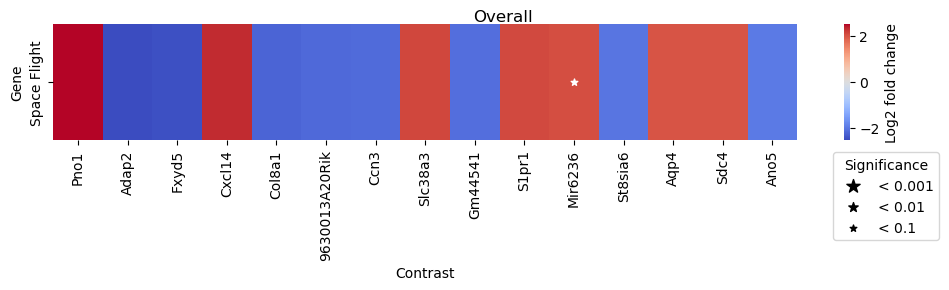

Excitatory
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model


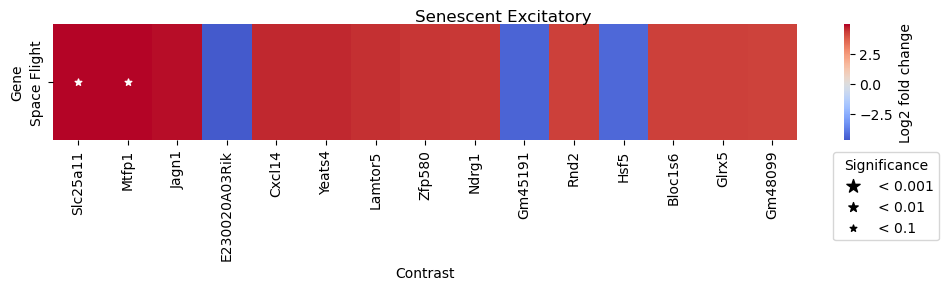

Excitatory-Inhibitory
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model


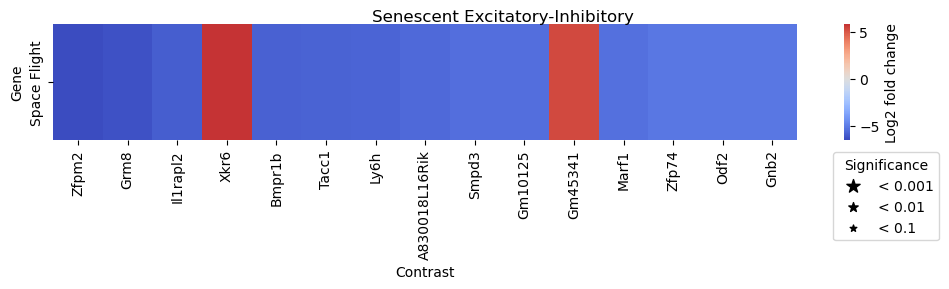

Oligodendrocyte
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model


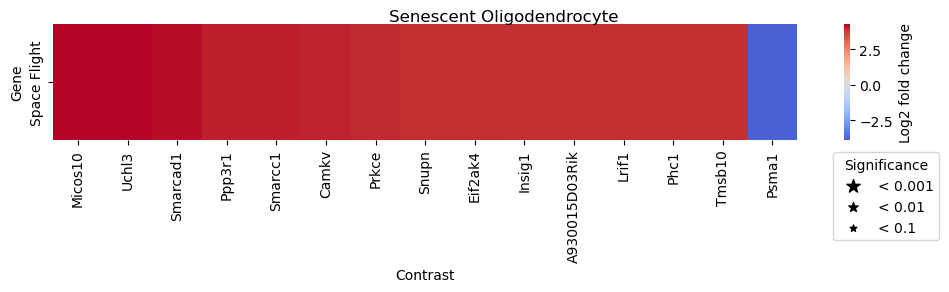

Inhibitory
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model


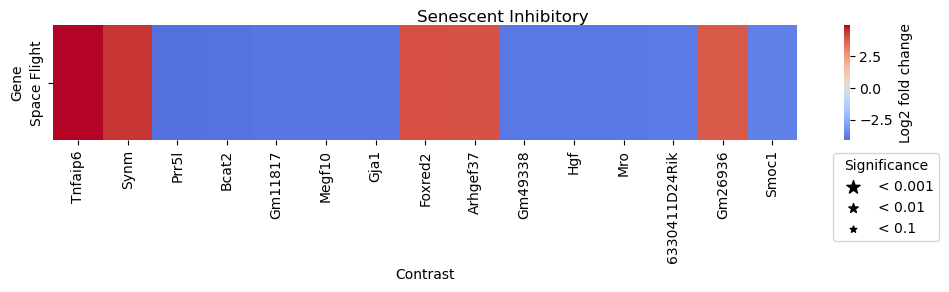

Microglial
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model


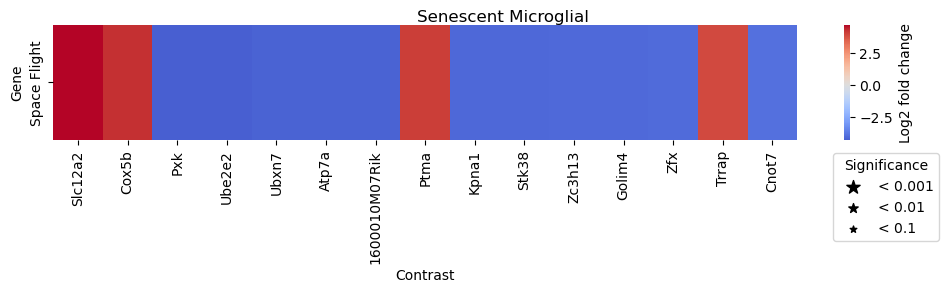

OPC
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model


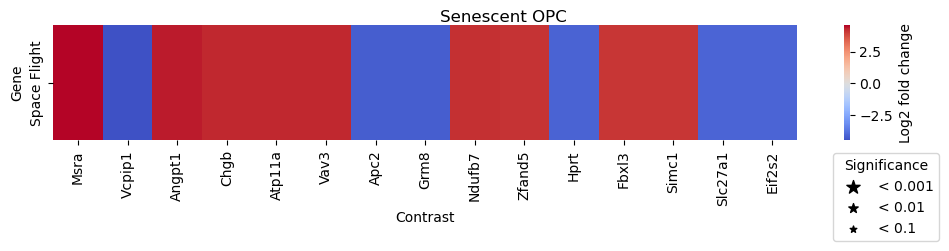

Astrocyte
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model


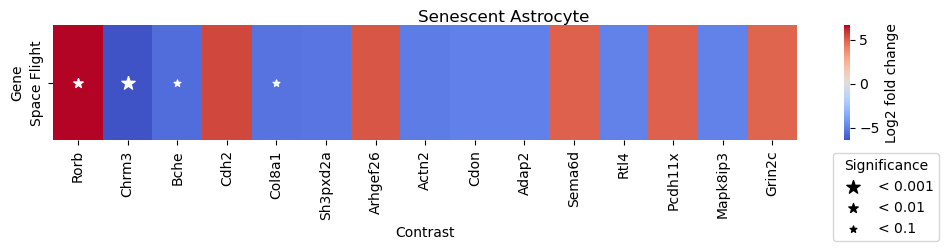

log_fc    logCPM          F       p_value  adj_p_value      contrast  abs_log_fc significance
annotation_by_overlap variable                                                                                                 
Excitatory            Mir6236   2.785393  8.852131  24.576078  7.684583e-07     0.009296  Space Flight    2.785393       < 0.01
Astrocyte             Slc4a10  -4.664966  9.805859  32.261728  1.393764e-08     0.000169  Space Flight    4.664966      < 0.001
                      Ccn3     -4.767686  9.181761  28.629274  9.003095e-08     0.000409  Space Flight    4.767686      < 0.001
                      Chrm3    -6.454060  8.549329  28.399240  1.013490e-07     0.000409  Space Flight    6.454060      < 0.001
                      Rorb      6.667245  9.297352  22.394432  2.257624e-06     0.006828  Space Flight    6.667245       < 0.01
                      Rspo3    -3.907725  8.962092  21.132434  4.350717e-06     0.010526  Space Flight    3.907725        < 0.1
                      Fxyd5    -4.017004  8.674347  19.493648  1.022373e-05     0.020613  Space Flight    4.017004        < 0.1
                      Bche     -5.609772  8.050771  18.246627  1.962775e-05     0.033920  Space Flight    5.609772        < 0.1
                      Tmeff2   -3.229761  9.214059  17.357692  3.128428e-05     0.047306  Space Flight    3.229761        < 0.1

In [28]:
out_edgr_contrasts_sncto, snc_degs_by_condition_age_ct = {}, {}
thresh_p_c, thresh_lfcabs_c = 0.05, 0.5  # thresholds
subs_old = self.rna.obs[col_age] == keys[col_age]["key_treatment"]
subs_sf = self.rna.obs[col_condition] == keys[col_condition]["key_treatment"]
# subs_ac = (self.rna.obs["Senescent_Cell_Label"] == "Senescent") & (
#     subs_old | subs_sf)
subs_ac = (self.rna.obs["Senescent_Cell_Label"] == "Senescent") & (subs_old)
out_edgr_contrasts_sncto["Overall"] = scflow.ax.run_deg_edgr(
        self.rna[subs_ac], col_condition,
        # col_covariate=col_age,
        **keys[col_condition],
        log2fc_thresh=0, n_top_vars=24,
        legend_loc="upper center", fig_title=f"Overall",
        wspace=0.25, bottom=0.3, hspace=1 if len(x) > 10 else 0.4, top=0.95,
        kws_xticks=dict(fontsize=10, rotation=45 if len(x) > 10 else None),
        col_celltype=col_celltype, col_sample=col_sample)
plt.show()
tmp = out_edgr_contrasts_sncto["Overall"][0]
tmp = tmp[(tmp.adj_p_value < thresh_p_c) & (
    tmp.abs_log_fc >= thresh_lfcabs_c)]  # filter by p & lfc
snc_degs_by_condition_age_ct["Overall"] = list(
    tmp.sort_values("adj_p_value", ascending=True).variable)
for x in self.rna.obs[col_celltype].unique():
    print(x)
    out_edgr_contrasts_sncto[x] = scflow.ax.run_deg_edgr(
        self.rna[(subs_ac) & (self.rna.obs[col_celltype] == x)],
        col_condition,
        # col_covariate=col_age,
        **keys[col_condition],
        log2fc_thresh=0, n_top_vars=24,
        legend_loc="upper center", fig_title=f"Senescent {x}",
        wspace=0.25, bottom=0.3, hspace=1 if len(x) > 10 else 0.4, top=0.95,
        kws_xticks=dict(fontsize=10, rotation=45 if len(x) > 10 else None),
        col_celltype=col_celltype, col_sample=col_sample)
    plt.show()
    tmp = out_edgr_contrasts_sncto[x][0]
    tmp = tmp[(tmp.adj_p_value < thresh_p_c) & (
        tmp.abs_log_fc >= thresh_lfcabs_c)]  # filter by p & lfc
    snc_degs_by_condition_age_ct[x] = list(tmp.sort_values(
            "adj_p_value", ascending=True).variable)
    del tmp
out_edgr_contrasts_snc_all_top = pd.concat([out_edgr_contrasts_sncto[x][
    0].set_index("variable").loc[snc_degs_by_condition_age_ct[
        x]] for x in out_edgr_contrasts_sncto], keys=out_edgr_contrasts_sncto,
                                           names=[col_celltype])
out_edgr_contrasts_snc_all = pd.concat([
    out_edgr_contrasts_sncto[x][0].set_index("variable")
    for x in out_edgr_contrasts_sncto], keys=out_edgr_contrasts_sncto,
                                       names=[col_celltype])
out_edgr_contrasts_snc_all_top

#### Pathway Analysis: SnC DEGs

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/gseapy/plot.py:754: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda _x: _x.sort_values(by=self.colname).tail(self.n_terms))


Term Short  Adjusted P-value  Combined Score                    Gene_set                         Genes    Odds Ratio Old Adjusted P-value Old P-value Overlap   P-value  \
annotation_by_overlap Direction                                                                                                                                                                                                                                                                         
Astrocyte             down      97                                                                          GTEx Ovary 20-29 vs 30-39 Up          0.000781      577.981962  GTEx_Aging_Signatures_2021               BCHE;RSPO3;CCN3     59.957490                    0           0   3/250  0.000065   
                                98                                                                          GTEx Ovary 20-29 vs 40-49 Up          0.000781      577.981962  GTEx_Aging_Signatures_2021               BCHE;RSPO3;CCN3     59.957490                    0           0   3/250  0.000065   
                                99                                                                        GTEx Brain 20-29 vs 50-59 Down          0.000781      577.981962  GTEx_Aging_Signatures_2021           CHRM3;SLC4A10;RSPO3     59.957490                    0           0   3/250  0.000065   
                                110                                    regulation of ion transmembrane transporter activity (GO:0032412)          0.007965     2042.516553  GO_Biological_Process_2021                   CHRM3;FXYD5    215.740541                    0           0    2/39  0.000077   
                                103                                     Genes Changed In Brain Vs Spinal Cord Derived OPCs From P7 Mice           0.016494      305.164580          HDSigDB_Mouse_2021  CHRM3;BCHE;TMEFF2;CCN3;FXYD5     30.557209                    0           0  5/1517  0.000046   
                                102                                                               Striatum RNA M44 Module (Floralwhite)           0.016494      797.520726          HDSigDB_Mouse_2021              CHRM3;RSPO3;CCN3     76.943005                    0           0   3/196  0.000032   
                                111                                             regulation of integrin biosynthetic process (GO:0045113)          0.019272     5287.722500  GO_Biological_Process_2021                        TMEFF2    832.875000                    0           0     1/5  0.001749   
                                112                             regulation of vascular associated smooth muscle contraction (GO:0003056)          0.019272     5287.722500  GO_Biological_Process_2021                         CHRM3    832.875000                    0           0     1/5  0.001749   
                                120                       regulation of Wnt signaling pathway, planar cell polarity pathway (GO:2000095)          0.019272     2398.853181  GO_Biological_Process_2021                         RSPO3    416.354167                    0           0     1/9  0.003146   
                                119  adenylate cyclase-inhibiting G protein-coupled acetylcholine receptor signaling pathway (GO:0007...          0.019272     2797.660500  GO_Biological_Process_2021                         CHRM3    475.857143                    0           0     1/8  0.002797   
                      up        43                                                            retinal cone cell development (GO:0046549)          0.002625   162186.518632  GO_Biological_Process_2021                          RORB  19994.000000                    0           0     1/6  0.000300   
                                42                                                            amacrine cell differentiation (GO:0035881)          0.002625   165840.178437  GO_Biological_Process_2021                          RORB  19995.000000                    0  

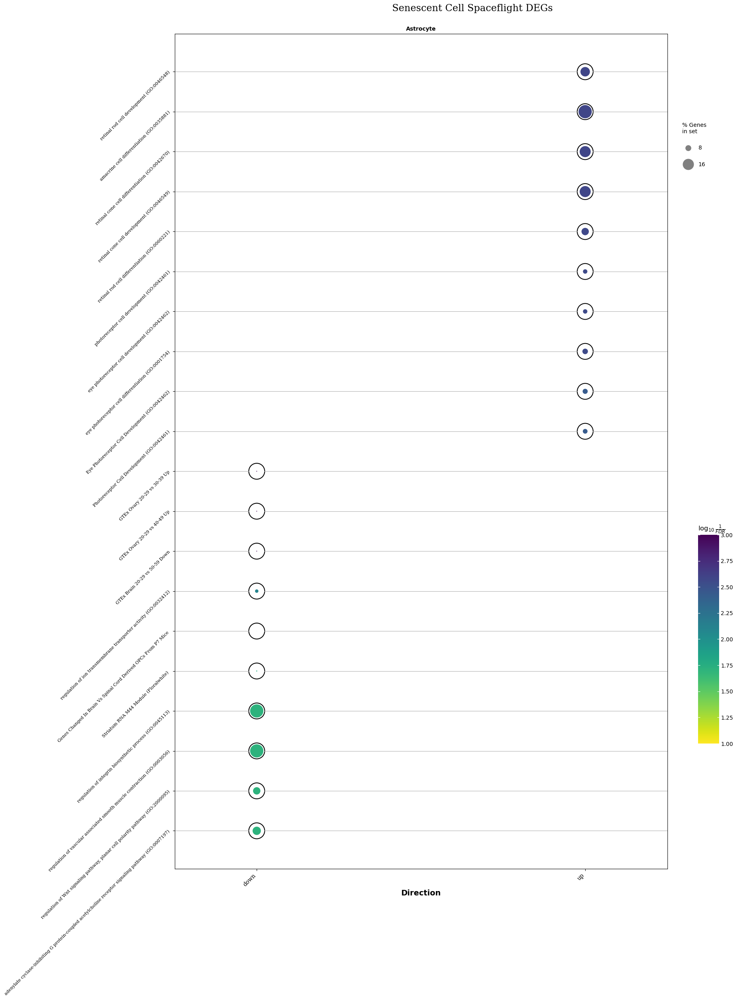

In [102]:
# Pathway Enrichment Analysis
names = gp.get_library_name()
# [i for i in names if "brain" in i.lower() or "mouse" in i.lower()]
pathways_snc, res_pathways_snc = {}, {}
thresh_p_path = 0.05
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021", f"HDSigDB_{species}_2021",
              # "DGIdb_Drug_Targets_2024",
              "MSigDB_Hallmark_2020",
              "MSigDB_Oncogenic_Signatures", "OMIM_Disease",
              # "Reactome_Pathways_2024", "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
# if species.lower() == "mouse":
#     other_sets += ["PerturbAtlas_MouseGenePerturbationSigs"]
for x in out_edgr_contrasts_snc_all_top.reset_index()[col_celltype].unique():
    pathways_snc[x], res_pathways_snc[x] = {}, {}
    for i in ["up", "down"]:
        degs_tmp = out_edgr_contrasts_snc_all_top.loc[x]
        if i == "up":
            degs_tmp = list(degs_tmp[degs_tmp.log_fc > 0].index.values)
        else:
            degs_tmp = list(degs_tmp[degs_tmp.log_fc < 0].index.values)
        if len(degs_tmp) > 0:
            g_s = [f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
                f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
            g_s = [g for g in g_s if g in names]
            pathways_snc[x][i] = gp.enrichr(
                gene_list=degs_tmp, gene_sets=g_s,
                organism=species, cutoff=0.5)
            # fig = gp.barplot(pathways_snc[x][i].res2d, title=f"{x} ({i})",
            #                  color="r" if i == "up" else "b")
            res_pathways_snc[x][i] = pathways_snc[x][i].results[pathways_snc[
                x][i].results["Adjusted P-value"] < thresh_p_path]
    res_pathways_snc[x] = pd.concat(res_pathways_snc[x], names=["Direction"])
res_pathways_snc = pd.concat(res_pathways_snc, names=[col_celltype])
res_pathways_snc.loc[:, "Term Short"] = res_pathways_snc.Term.apply(
    lambda x: re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
        ".*.XLSX", "", re.sub(".*Supplementary Table [0-9]+[-]?", "", re.sub(
            ".*.xlsx.", "", re.sub(".*Supplementary Data ..", "", re.sub(
                "PMID([0-9])+", "", re.sub(
                    "([0-9]+) years v ([0-9]+) years", "\\1 v \\2 yrs.",
                    re.sub("aging:([0-9]+)", "aging", re.sub(
                        "([0-9]+) months v ([0-9]+) mo(nths)?",
                        "\\1 v \\2 mo.", re.sub("SRP[0-9]+ ", "", re.sub(
                            "GSE[0-9]+ ", "", x)))))))))))))
cts_i = res_pathways_snc.reset_index()[col_celltype].unique()
res_pathways_snc_top = res_pathways_snc.reset_index().groupby([
    col_celltype, "Direction"]).apply(lambda x: x.sort_values(
        "Adjusted P-value", ascending=True).head(10), include_groups=False)
# res_pathways_snc_top = res_pathways_snc_top[res_pathways_snc_top[
#     "Gene_set"] != "PheWeb_2019"]

# Plot/Display
fig, axes = plt.subplots(*scflow.pl.square_grid(cts_i), figsize=(
    20, 25), gridspec_kw=dict(wspace=1.5, top=0.95), squeeze=False)
for i, x in enumerate(cts_i):
    gp.dotplot(
        res_pathways_snc_top.loc[x].reset_index(),
        column="Adjusted P-value",
        # column="Overlap",
        x="Direction", y="Term Short",
        ax=axes.flatten()[i], size=20, top_term=100,
        title=x, xticklabels_rot=45, yticklabels_rot=45,
        show_ring=True, marker="o", cutoff=0.5)
    axes.flatten()[i].tick_params(axis="y", labelsize=8,
                                  labelfontfamily="serif")
    axes.flatten()[i].tick_params(axis="x", labelsize=10,
                                  labelfontfamily="serif")
    axes.flatten()[i].title.set_fontsize(10)
if len(axes.flatten()) > len(cts_i):
    for a in axes.flatten()[len(cts_i):]:
        a.set_visible(False)
fig.suptitle("Senescent Cell Spaceflight DEGs", fontsize="xx-large",
             fontproperties=dict(family="serif"))
# for x in cts_i:
#     a_x = gp.dotplot(
#         res_pathways_snc_top.loc[x].reset_index(),
#         column="Adjusted P-value",
#         x="Direction", y="Term Short",
#         size=10, top_term=5, figsize=(3, 8),
#         title=x, xticklabels_rot=45, yticklabels_rot=45,
#         show_ring=True, marker="o", cutoff=0.1)
#     a_x.tick_params(axis="y", labelsize=6)
#     a_x.tick_params(axis="x", labelsize=10)
# res_pathways_snc_top.loc["Overall"].reset_index(1)[[
#     "Gene_set", "Term Short", "Adjusted P-value", "Genes"]].reset_index(
#         ).groupby(["Direction", "Gene_set", "Term Short"]).apply(
#             lambda x: x.apply(lambda y: y.Genes.split(";"), axis=1),
#             include_groups=False).reset_index(-1, drop=True).to_frame(
#                 "Gene")
res_pathways_snc_top[["Term Short"] + list(
    res_pathways_snc_top.columns.difference(["Term", "Term Short"]))]

#### Run ToppGene on SnC DEGs

In [50]:
# res_deg_4, res_deg_old_sf_v_gc = [i[0] for i in [
#         out_edgr_contrasts, out_edgr_con]]
# res_deg_4, res_deg_old_sf_v_gc = [i[(i.adj_p_value < 0.05) & (
#     i.abs_log_fc >= 1)].sort_values(
#         "abs_log_fc", ascending=False)
#     for i in [res_deg_4, res_deg_old_sf_v_gc]]
mks_ctrsts_snc = dict(out_edgr_contrasts_snc_all_top.reset_index(
    1).variable.groupby(col_celltype).apply(lambda x: list(x)))  # SnC DEGs
results_toppgene_degs = scflow.pp.annotate_by_toppgene(
    mks_ctrsts_snc, species=species, min_genes=1,
    categories=["Pathway", "PubMed"])
results_toppgene_degs = results_toppgene_degs.join(pd.Series(
    mks_ctrsts_snc).to_frame("DEGs").rename_axis("Gene Set"))
results_toppgene_degs = results_toppgene_degs.groupby("Gene Set").apply(
    lambda x: x.sort_values("PValue", ascending=True), include_groups=False)
pthwys = dict(results_toppgene_degs.groupby("Gene Set").apply(
    lambda x: [i.capitalize() for i in x.Name.unique()]))
print("\n\n".join([f"{k}: {pthwys[k]}" for k in pthwys]))
results_toppgene_degs[["Name", "Symbols", "GenesInTerm", "GenesInQuery",
                       "GenesInTermInQuery", "PValue"]].reset_index(
                           2, drop=True)

Astrocyte: ['Reactome_muscarinic_acetylcholine_receptors', 'Reactome_runx1_regulates_transcription_of_genes_involved_in_wnt_signaling', 'Reactome_bicarbonate_transporters', 'Reactome_acetylcholine_regulates_insulin_secretion', 'Reactome_neurotransmitter_clearance', 'Wp_irinotecan_pathway', 'Wp_nephrogenesis', 'Reactome_synthesis_secretion_and_deacylation_of_ghrelin', 'Kegg_medicus_reference_wnt_signaling_modulation_lgr_rspo', 'Kegg_medicus_reference_machr_ca2_apoptotic_pathway', 'Reactome_regulation_of_fzd_by_ubiquitination', 'Kegg_medicus_variant_mutation_caused_aberrant_abeta_to_machr_ca2_apoptotic_pathway']


Name    Symbols GenesInTerm GenesInQuery GenesInTermInQuery    PValue
Gene Set  Gene Set  ID                                                                                                                                                          
Astrocyte Astrocyte M27300                                          REACTOME_MUSCARINIC_ACETYLCHOLINE_RECEPTORS    [CHRM3]           5            7                  1  0.002481
                    MM15006                                         REACTOME_MUSCARINIC_ACETYLCHOLINE_RECEPTORS    [CHRM3]           5            7                  1  0.002481
                    M27801            REACTOME_RUNX1_REGULATES_TRANSCRIPTION_OF_GENES_INVOLVED_IN_WNT_SIGNALING    [RSPO3]           6            7                  1  0.002976
                    M27335                                                    REACTOME_BICARBONATE_TRANSPORTERS  [SLC4A10]          10            7                  1  0.004956
                    M1825                                    REACTOME_ACETYLCHOLINE_REGULATES_INSULIN_SECRETION    [CHRM3]          10            7                  1  0.004956
                    MM15073                                                   REACTOME_BICARBONATE_TRANSPORTERS  [SLC4A10]          10            7                  1  0.004956
                    M26914                                                  REACTOME_NEUROTRANSMITTER_CLEARANCE     [BCHE]          11            7                  1  0.005451
                    M39611                                                                WP_IRINOTECAN_PATHWAY     [BCHE]          12            7                  1  0.005945
                    M40045                                                                     WP_NEPHROGENESIS    [RSPO3]          18            7                  1  0.008906
                    M813                                REACTOME_SYNTHESIS_SECRETION_AND_DEACYLATION_OF_GHRELIN     [BCHE]          19            7                  1  0.009399
                    M47833                             KEGG_MEDICUS_REFERENCE_WNT_SIGNALING_MODULATION_LGR_RSPO    [RSPO3]          19            7                  1  0.009399
                    M47688                                   KEGG_MEDICUS_REFERENCE_MACHR_CA2_APOPTOTIC_PATHWAY    [CHRM3]          20            7                  1  0.009891
                    MM15155                                        REACTOME_REGULATION_OF_FZD_BY_UBIQUITINATION    [RSPO3]          20            7                  1  0.009891
                    MM15070                             REACTOME_SYNTHESIS_SECRETION_AND_DEACYLATION_OF_GHRELIN     [BCHE]          20            7                  1  0.009891
                    M47689   KEGG_MEDICUS_VARIANT_MUTATION_CAUSED_ABERRANT_ABETA_TO_MACHR_CA2_APOPTOTIC_PATHWAY    [CHRM3]          21            7                  1  0.010383
                    M27401                                         REACTOME_REGULATION_OF_FZD_BY_UBIQUITINATION    [RSPO3]          21            7                  1  0.010383

### More Specific Contrasts (`pyDESeq2`)

#### Group

In [ ]:
pdata =  scflow.tl.create_pseudobulk(
    self.rna, [col_sample, col_condition, col_age],
    col_celltype, layer="counts", mode="sum")
design = f"~{col_condition} + {col_age} + {col_condition} * {col_age}"
# edgr = pt.tl.EdgeR(pdata, design=design)
pds2 = pt.tl.PyDESeq2(adata=pdata, design=design)
pds2.fit()
key_control, key_treatment = [keys[col_condition][k] for k in [
    "key_control", "key_treatment"]]
key_control_cov, key_treatment_cov = [keys[col_age][k] for k in [
    "key_control", "key_treatment"]]
sf_old = {col_condition: key_treatment, col_age: key_treatment_cov}
sf_yng = {col_condition: key_treatment, col_age: key_control_cov}
gc_old = {col_condition: key_control, col_age: key_treatment_cov}
gc_yng = {col_condition: key_control, col_age: key_control_cov}

# Spaceflight-Specific Age DEGs
spaceflight_specfic_age_degs = (pds2.cond(**sf_old) - pds2.cond(**sf_yng)) - (
    pds2.cond(**gc_old) - pds2.cond(**gc_yng))
interaction_res_df = pds2.test_contrasts(spaceflight_specfic_age_degs)
pds2.plot_volcano(interaction_res_df, log2fc_thresh=0)

# Age-Specific Spaceflight DEGs
age_specfic_sf_degs = (pds2.cond(**sf_old) - pds2.cond(**gc_old)) - (
    pds2.cond(**sf_yng) - pds2.cond(**gc_yng))
interaction_res_df2 = pds2.test_contrasts(age_specfic_sf_degs)
pds2.plot_volcano(interaction_res_df2, log2fc_thresh=0)

# Old vs. Young Spaceflight
age_sf_ix = pds2.cond(**sf_old) - pds2.cond(**sf_yng)
interaction_res_df3 = pds2.test_contrasts(age_sf_ix)
pds2.plot_volcano(interaction_res_df3, log2fc_thresh=0)

# Old vs. Young GC
age_gc_ix = pds2.cond(**gc_old) - pds2.cond(**gc_yng)
interaction_res_df4 = pds2.test_contrasts(age_gc_ix)
pds2.plot_volcano(interaction_res_df4, log2fc_thresh=0)

# SF vs. GC Old
cond_old_ix = pds2.cond(**sf_old) - pds2.cond(**gc_old)
interaction_res_df5 = pds2.test_contrasts(cond_old_ix)
pds2.plot_volcano(interaction_res_df5, log2fc_thresh=0)

# SF vs. GC Young
cond_yng_ix = pds2.cond(**sf_yng) - pds2.cond(**gc_yng)
interaction_res_df6 = pds2.test_contrasts(cond_yng_ix)
pds2.plot_volcano(interaction_res_df6, log2fc_thresh=0)

# Compare
thresh_lfc, thresh_p = 1, 0.001
sf_deg_res_df_old = interaction_res_df5[(
    interaction_res_df5.adj_p_value < thresh_p) & (
        interaction_res_df5.log_fc.abs() >= thresh_lfc)].set_index("variable")
sf_deg_res_df_yng = interaction_res_df6[(
    interaction_res_df6.adj_p_value < thresh_p) & (
        interaction_res_df6.log_fc.abs() >= thresh_lfc)].set_index("variable")
sf_deg_res = pd.concat([sf_deg_res_df_old, sf_deg_res_df_yng],
                       keys=["Old", "Young"], names=["Age Group"])
sf_deg_res.loc[:, "log_fc_abs"] = sf_deg_res.log_fc.abs()
sf_deg_res = sf_deg_res.sort_values("log_fc_abs", ascending=False)[[
    "log_fc", "adj_p_value"]].unstack(0)
print("SF DEGs in Both Young & Old: ", sf_deg_res.dropna().index.values)
print("\n\nSF DEGs in Just Young", list(sf_deg_res_df_yng.index.difference(
    sf_deg_res_df_old.index)), "\n\n")
print("SF DEGs in Just Old", list(sf_deg_res_df_old.index.difference(
    sf_deg_res_df_yng.index)), "\n\n")
sf_deg_res.replace(np.nan, "")

# Marker Set Overlap
print("Both: ", marker_gene_sets.apply(
    lambda i: set(sf_deg_res.dropna().index).intersection(set(i))).apply(
        lambda x: x if len(x) > 0 else np.nan).dropna(), "\n\n")
print("Young: ", marker_gene_sets.apply(
    lambda i: sf_deg_res_df_yng.index.difference(
        sf_deg_res_df_old.index).intersection(set(i))).apply(
        lambda x: x if len(x) > 0 else np.nan).dropna(), "\n\n")
print("Old: ", marker_gene_sets.apply(
    lambda i: sf_deg_res_df_old.index.difference(
        sf_deg_res_df_yng.index).intersection(set(i))).apply(
        lambda x: x if len(x) > 0 else np.nan).dropna(), "\n\n")

#### SnCs

##### Old

Fitting size factors...
... done in 0.02 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.70 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 0.64 seconds.

Fitting LFCs...
... done in 0.64 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 37 outlier genes.

Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting LFCs...
... done in 0.02 seconds.

Running Wald tests...
... done in 0.42 seconds.



Log2 fold change & Wald test p-value, contrast vector: [0. 0. 1. 0.]
                      baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Xkr4                179.212479       -0.011190  0.508024 -0.022026  0.982427  0.995695
Gm37180               2.730003        0.081640  0.653310  0.124964  0.900552  0.966170
Gm37363               1.127911        0.481627  0.816977  0.589523  0.555511  0.794140
Gm1992                2.308152        0.845376  0.665170  1.270916  0.203759  0.486743
Gm38148               1.674510        0.250140  0.745442  0.335559  0.737203  0.892765
...                        ...             ...       ...       ...       ...       ...
Hccs                  2.337087        0.156308  0.384872  0.406130  0.684647  0.867528
Gm15246               2.716744        0.006002  0.398421  0.015064  0.987981  0.996809
Mid1                  8.839969       -0.285549  0.538941 -0.529833  0.596228  0.816407
Gm47283              15.537917       -0.055943  0.273288 -0.2

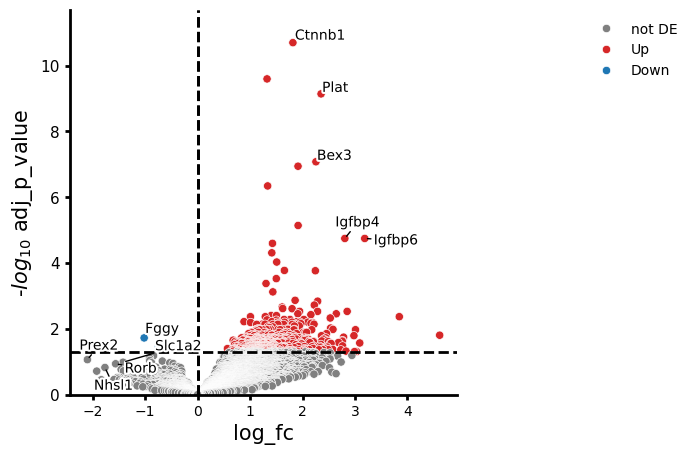

Running Wald tests...
... done in 0.43 seconds.



Log2 fold change & Wald test p-value, contrast vector: [0. 0. 0. 1.]
                      baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Xkr4                179.212479       -0.463716  0.683672 -0.678272  0.497599  0.999947
Gm37180               2.730003        0.186882  0.877935  0.212865  0.831432  0.999947
Gm37363               1.127911        0.301098  1.085249  0.277446  0.781438  0.999947
Gm1992                2.308152       -0.713486  0.912579 -0.781835  0.434312  0.999947
Gm38148               1.674510        0.330969  0.991846  0.333691  0.738613  0.999947
...                        ...             ...       ...       ...       ...       ...
Hccs                  2.337087       -0.044311  0.545358 -0.081251  0.935242  0.999947
Gm15246               2.716744       -0.136966  0.579655 -0.236290  0.813208  0.999947
Mid1                  8.839969        0.059856  0.729548  0.082046  0.934610  0.999947
Gm47283              15.537917        0.289462  0.369284  0.7

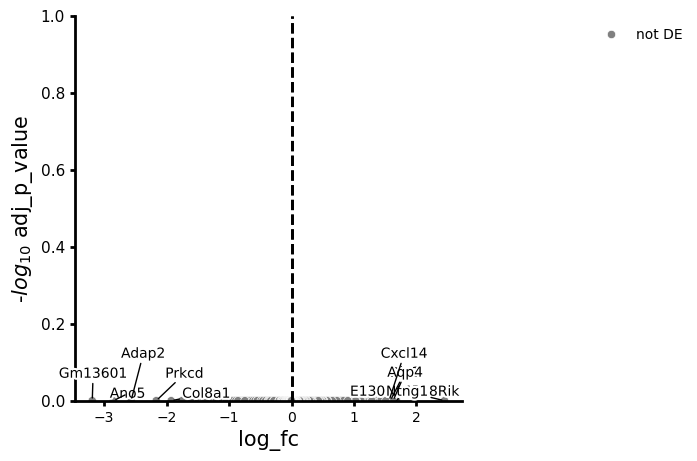

In [147]:
# Setup
design = (f"~{col_condition} + Senescent_Cell_Label + "
          f"{col_condition} * Senescent_Cell_Label")
pdata2 =  scflow.tl.create_pseudobulk(
    self.rna[self.rna.obs[col_age] == keys[col_age]["key_treatment"]], [
        col_sample, col_condition, "Senescent_Cell_Label"],
    "Senescent_Cell_Label_by_Type", layer="counts", mode="sum")
pds2_snc_old = pt.tl.PyDESeq2(adata=pdata2, design=design)
pds2_snc_old.fit()
key_control, key_treatment = [keys[col_condition][k] for k in [
    "key_control", "key_treatment"]]
key_control_cov, key_treatment_cov = "Non-Senescent", "Senescent"
sf_sc = {col_condition: key_treatment,
         "Senescent_Cell_Label": key_treatment_cov}
sf_ns = {col_condition: key_treatment,
         "Senescent_Cell_Label": key_control_cov}
gc_snc = {col_condition: key_control,
          "Senescent_Cell_Label": key_treatment_cov}
gc_ns = {col_condition: key_control, "Senescent_Cell_Label": key_control_cov}

# SnC DEGs
res_df_snc = pds2_snc_old.test_contrasts(pds2_snc_old.contrast(
    column="Senescent_Cell_Label", baseline=key_control_cov,
    group_to_compare=key_treatment_cov))
print(res_df_snc[res_df_snc.adj_p_value < 0.001].head(10))
pds2_snc_old.plot_volcano(res_df_snc, log2fc_thresh=0)

# Spaceflight-Specific SnC DEGs
spaceflight_specfic_snc_degs = (pds2_snc_old.cond(
    **sf_sc) - pds2_snc_old.cond(**sf_ns)) - (
        pds2_snc_old.cond(**gc_snc) - pds2_snc_old.cond(**gc_ns))
interaction_res_df_snc_sf = pds2_snc_old.test_contrasts(
    spaceflight_specfic_snc_degs)
print(interaction_res_df_snc_sf[
    interaction_res_df_snc_sf.adj_p_value < 0.001].head(10))
pds2_snc_old.plot_volcano(interaction_res_df_snc_sf, log2fc_thresh=0)

##### Young

Fitting size factors...
... done in 0.02 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.72 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 0.65 seconds.

Fitting LFCs...
... done in 1.81 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 37 outlier genes.

Fitting dispersions...
... done in 0.02 seconds.

Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting LFCs...
... done in 0.02 seconds.

Running Wald tests...
... done in 0.47 seconds.



Log2 fold change & Wald test p-value, contrast vector: [0. 0. 1. 0.]
                      baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Xkr4                179.212479       -0.011190  0.508024 -0.022026  0.982427  0.995695
Gm37180               2.730003        0.081640  0.653310  0.124964  0.900552  0.966170
Gm37363               1.127911        0.481627  0.816977  0.589523  0.555511  0.794140
Gm1992                2.308152        0.845376  0.665170  1.270916  0.203759  0.486743
Gm38148               1.674510        0.250140  0.745442  0.335559  0.737203  0.892765
...                        ...             ...       ...       ...       ...       ...
Hccs                  2.337087        0.156308  0.384872  0.406130  0.684647  0.867528
Gm15246               2.716744        0.006002  0.398421  0.015064  0.987981  0.996809
Mid1                  8.839969       -0.285549  0.538941 -0.529833  0.596228  0.816407
Gm47283              15.537917       -0.055943  0.273288 -0.2

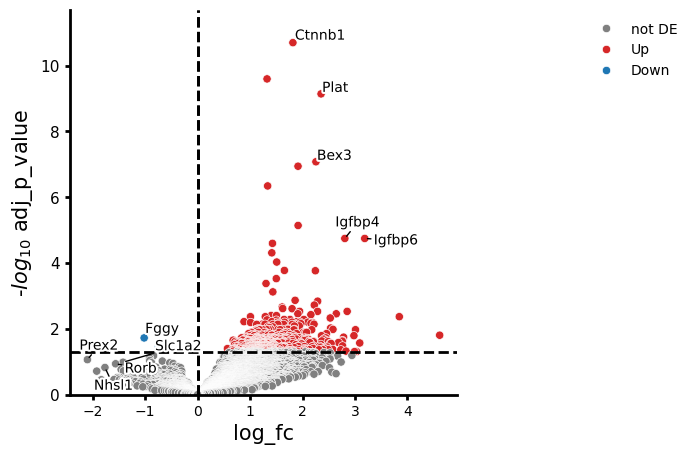

Running Wald tests...
... done in 0.43 seconds.



Log2 fold change & Wald test p-value, contrast vector: [0. 0. 0. 1.]
                      baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Xkr4                179.212479       -0.463716  0.683672 -0.678272  0.497599  0.999947
Gm37180               2.730003        0.186882  0.877935  0.212865  0.831432  0.999947
Gm37363               1.127911        0.301098  1.085249  0.277446  0.781438  0.999947
Gm1992                2.308152       -0.713486  0.912579 -0.781835  0.434312  0.999947
Gm38148               1.674510        0.330969  0.991846  0.333691  0.738613  0.999947
...                        ...             ...       ...       ...       ...       ...
Hccs                  2.337087       -0.044311  0.545358 -0.081251  0.935242  0.999947
Gm15246               2.716744       -0.136966  0.579655 -0.236290  0.813208  0.999947
Mid1                  8.839969        0.059856  0.729548  0.082046  0.934610  0.999947
Gm47283              15.537917        0.289462  0.369284  0.7

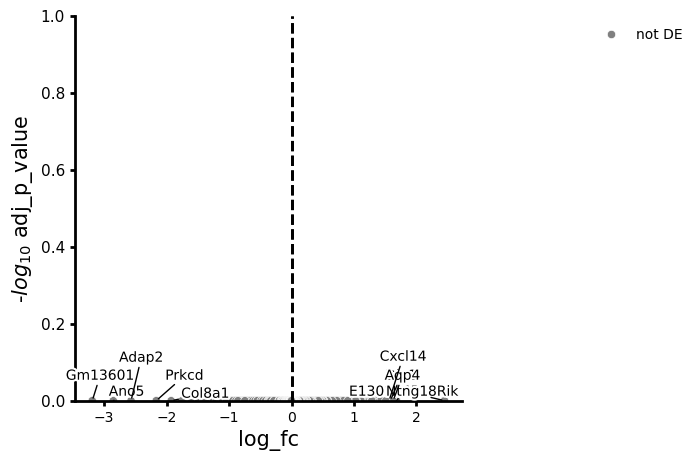

In [145]:
# Setup
design = (f"~{col_condition} + Senescent_Cell_Label + "
          f"{col_condition} * Senescent_Cell_Label")
pdata2 =  scflow.tl.create_pseudobulk(
    self.rna[self.rna.obs[col_age] == keys[col_age]["key_treatment"]], [
        col_sample, col_condition, "Senescent_Cell_Label"],
    "Senescent_Cell_Label_by_Type", layer="counts", mode="sum")
pds2_snc_yng = pt.tl.PyDESeq2(adata=pdata2, design=design)
pds2_snc_yng.fit()
key_control, key_treatment = [keys[col_condition][k] for k in [
    "key_control", "key_treatment"]]
key_control_cov, key_treatment_cov = "Non-Senescent", "Senescent"
sf_sc = {col_condition: key_treatment,
         "Senescent_Cell_Label": key_treatment_cov}
sf_ns = {col_condition: key_treatment,
         "Senescent_Cell_Label": key_control_cov}
gc_snc = {col_condition: key_control,
          "Senescent_Cell_Label": key_treatment_cov}
gc_ns = {col_condition: key_control, "Senescent_Cell_Label": key_control_cov}

# SnC DEGs
res_df_snc = pds2_snc_yng.test_contrasts(pds2_snc_yng.contrast(
    column="Senescent_Cell_Label", baseline=key_control_cov,
    group_to_compare=key_treatment_cov))
print(res_df_snc[res_df_snc.adj_p_value < 0.001].head(10))
pds2_snc_yng.plot_volcano(res_df_snc, log2fc_thresh=0)

# Spaceflight-Specific SnC DEGs
spaceflight_specfic_snc_degs = (pds2_snc_yng.cond(
    **sf_sc) - pds2_snc_yng.cond(**sf_ns)) - (
        pds2_snc_yng.cond(**gc_snc) - pds2_snc_yng.cond(**gc_ns))
interaction_res_df_snc_sf = pds2_snc_yng.test_contrasts(
    spaceflight_specfic_snc_degs)
pds2_snc_yng.plot_volcano(interaction_res_df_snc_sf, log2fc_thresh=0)

#### SnCs (More Permissive Threshold)

Less & More Permissive SnC Threshold:  Senescent_Cell_Label  Senescent_Cell_Label_senmayo_3
Non-Senescent         Non-Senescent                     98751
                      Senescent                          2906
Senescent             Senescent                          1617
Name: count, dtype: int64


Fitting size factors...
... done in 0.02 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.72 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 0.67 seconds.

Fitting LFCs...
... done in 0.63 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 9 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...
... done in 0.45 seconds.



Log2 fold change & Wald test p-value, contrast vector: [0. 0. 1. 0.]
                      baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Xkr4                206.366237       -0.314513  0.460150 -0.683501  0.494290  0.855347
Gm37180               3.295234       -0.110652  0.517918 -0.213647  0.830822  0.967382
Gm37363               1.461366        0.357581  0.628605  0.568848  0.569459  0.889360
Gm1992                2.968704        0.330792  0.537530  0.615393  0.538295  0.876403
Gm38148               2.144230        0.319264  0.563897  0.566174  0.571276  0.889653
...                        ...             ...       ...       ...       ...       ...
Hccs                  3.883770       -0.121759  0.278209 -0.437653  0.661638  0.923309
Gm15246               4.511894       -0.207823  0.285125 -0.728883  0.466073  0.840147
Mid1                 15.125835       -0.211798  0.501828 -0.422052  0.672987  0.927130
Gm47283              19.752385        0.003665  0.187004  0.0

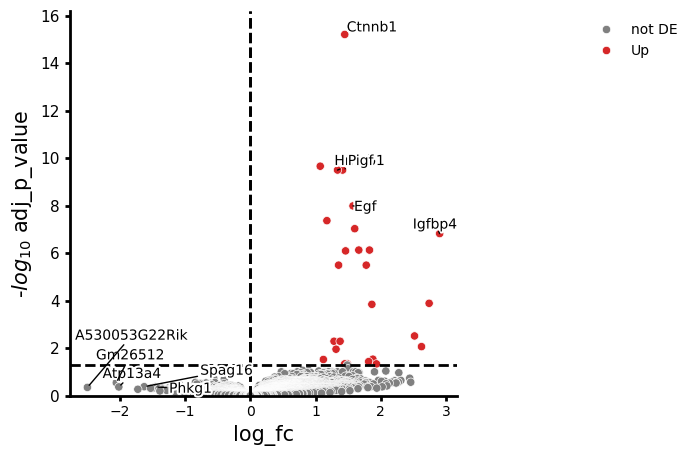

Running Wald tests...
... done in 0.46 seconds.



Log2 fold change & Wald test p-value, contrast vector: [0. 0. 0. 1.]
                      baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Xkr4                206.366237       -0.063479  0.619425 -0.102480  0.918376  0.999955
Gm37180               3.295234       -0.018667  0.697859 -0.026749  0.978660  0.999955
Gm37363               1.461366       -0.147345  0.847134 -0.173934  0.861918  0.999955
Gm1992                2.968704       -0.211352  0.716743 -0.294878  0.768087  0.999955
Gm38148               2.144230       -0.352492  0.767315 -0.459383  0.645959  0.999955
...                        ...             ...       ...       ...       ...       ...
Hccs                  3.883770        0.232654  0.370701  0.627605  0.530262  0.999955
Gm15246               4.511894       -0.077720  0.397181 -0.195679  0.844861  0.999955
Mid1                 15.125835        0.220451  0.674257  0.326954  0.743702  0.999955
Gm47283              19.752385        0.147430  0.251960  0.5

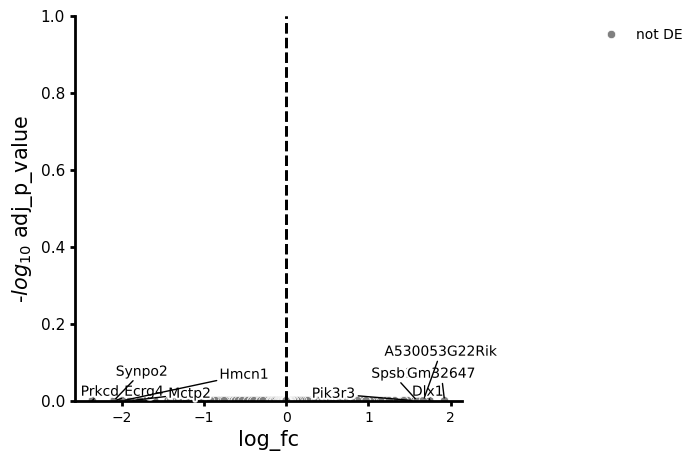

In [150]:
# Compare Less & More Permissive Thresholds
print("Less & More Permissive SnC Threshold: ", self.rna.obs[[
    "Senescent_Cell_Label", f"Senescent_Cell_Label_{use_metric}_{p_h}"
    ]].value_counts())
sen_lab = f"Senescent_Cell_Label_{use_metric}_{p_h}"

# Setup
design = (f"~{col_condition} + {sen_lab} + "
          f"{col_condition} * {sen_lab}")
pdata2_3 =  scflow.tl.create_pseudobulk(
    self.rna[self.rna.obs[col_age] == keys[col_age]["key_treatment"]], [
        col_sample, col_condition, sen_lab],
    col_celltype, layer="counts", mode="sum")
pds2_snc_old_3 = pt.tl.PyDESeq2(adata=pdata2_3, design=design)
pds2_snc_old_3.fit()
key_control, key_treatment = [keys[col_condition][k] for k in [
    "key_control", "key_treatment"]]
key_control_cov, key_treatment_cov = "Non-Senescent", "Senescent"
sf_sc = {col_condition: key_treatment, sen_lab: key_treatment_cov}
sf_ns = {col_condition: key_treatment, sen_lab: key_control_cov}
gc_snc = {col_condition: key_control, sen_lab: key_treatment_cov}
gc_ns = {col_condition: key_control, sen_lab: key_control_cov}

# SnC DEGs
res_df_snc_3 = pds2_snc_old_3.test_contrasts(pds2_snc_old_3.contrast(
    column=sen_lab, baseline=key_control_cov,
    group_to_compare=key_treatment_cov))
print(res_df_snc_3[res_df_snc_3.adj_p_value < 0.001].head(10))
pds2_snc_old_3.plot_volcano(res_df_snc_3, log2fc_thresh=0)

# Spaceflight-Specific SnC DEGs
spaceflight_specfic_snc_degs_3 = (pds2_snc_old_3.cond(
    **sf_sc) - pds2_snc_old_3.cond(**sf_ns)) - (
        pds2_snc_old_3.cond(**gc_snc) - pds2_snc_old_3.cond(**gc_ns))
interaction_res_df_snc_sf_3 = pds2_snc_old_3.test_contrasts(
    spaceflight_specfic_snc_degs_3)
pds2_snc_old_3.plot_volcano(interaction_res_df_snc_sf_3, log2fc_thresh=0)

# SnC GEX Profiles

## SnC DEGs by Group

In [192]:
top_tx_g_snc = res_snc_grps.loc[keys[col_condition][
    "key_treatment"]].sort_values("abs_log_fc", ascending=False).index
print(res_snc_grps.unstack(0).replace(np.nan, "")[[
    "log_fc", "adj_p_value"]].loc[top_tx_g_snc])
just_sf = res_snc_grps.loc[keys[col_condition][
    "key_treatment"]].index.difference(res_snc_grps.loc[keys[
        col_condition]["key_control"]].index)
just_gc = res_snc_grps.loc[keys[col_condition][
    "key_control"]].index.difference(res_snc_grps.loc[keys[
        col_condition]["key_treatment"]].index)
print(res_snc_grps.loc[:, just_gc, :].sort_values(
    "abs_log_fc", ascending=False)[["log_fc", "adj_p_value"]], "\n\n")
res_snc_grps.loc[:, just_sf, :].sort_values(
    "abs_log_fc", ascending=False)[["log_fc", "adj_p_value"]]
self.plot(kind=["matrix"], genes=just_sf, col_celltype=col_batch,
          matrix=dict(swap_axes=True, standard_scale="var"))

                      log_fc                 adj_p_value             
Condition     Ground Control Space Flight Ground Control Space Flight
variable                                                             
Vip                 3.156433     4.289319            0.0          0.0
Slc39a12           -3.551992    -3.180457       0.000003     0.000004
Tac2                1.921187     3.066049       0.000006          0.0
Phkg1                           -2.968877                    0.000006
Acsbg1                          -2.952229                    0.000003
Nwd1               -3.290416    -2.880781       0.000002     0.000008
Nhsl1              -3.295761      -2.7655            0.0     0.000002
Lrig1                           -2.744472                         0.0
Adhfe1                          -2.726487                    0.000007
Ptgs2                            2.672912                    0.000003
Acss1               -2.24669     -2.55111       0.000006     0.000001
Pnpla7             -

log_fc   adj_p_value
Condition    variable                             
Space Flight Phkg1         -2.968877  5.854433e-06
             Acsbg1        -2.952229  3.453443e-06
             Lrig1         -2.744472  4.315019e-07
             Adhfe1        -2.726487  7.208347e-06
             Ptgs2          2.672912  2.804616e-06
             Irak2         -2.447392  2.719703e-06
             Sema4b        -2.344446  1.122562e-06
             Myo10         -2.299259  5.832356e-07
             Fosb           2.253945  5.213249e-07
             Gpld1         -2.172901  1.756315e-06
             Rcbtb2        -2.024693  6.486410e-06
             Trp53bp2      -2.018176  3.016868e-06
             Sat1          -1.972960  1.991226e-06
             Cables1       -1.954440  1.181741e-06
             Pag1          -1.917645  6.822238e-06
             Egr4           1.907752  1.420553e-06
             Soat1         -1.870687  9.563059e-08
             Junos         -1.869604  8.063751e-06
             Limk1         -1.867847  9.040912e-07
             Psd2          -1.845588  9.937513e-06
             Gpam          -1.826651  3.533198e-06
             Crlf3         -1.755764  1.766446e-06
             Rbm12         -1.699022  2.290756e-06
             Rft1          -1.694305  5.572557e-06
             Rnls          -1.685472  4.466070e-06
             Eps15         -1.664543  3.229966e-07
             Aff1          -1.657693  7.870402e-06
             Nek7          -1.619015  7.780528e-07
             Golim4        -1.594119  6.532917e-06
             Denn2b        -1.584930  9.141516e-06
             Cep192        -1.530330  1.569122e-07
             Atp7a         -1.490834  2.780767e-06
             Ppcdc         -1.490009  4.066629e-06
             Pepd          -1.481809  2.403473e-06
             Arhgef1       -1.479845  5.720882e-07
             Dram2         -1.469943  1.327139e-06
             Hdac1         -1.465360  1.146259e-06
             Afg1l         -1.462639  9.877643e-08
             Zfp652        -1.457750  1.856272e-07
             Aven          -1.452047  3.623400e-06
             Elovl5        -1.451515  7.309966e-06
             Foxn2         -1.448836  8.204402e-06
             4931406C07Rik -1.448177  4.694189e-06
             Wdpcp         -1.443782  3.794296e-08
             Mlxip         -1.416183  3.393277e-06
             2610005L07Rik -1.416047  1.024364e-06
             Ift140        -1.415683  2.627021e-06
             Pcyt1b        -1.414975  8.170542e-06
             Fkbp15        -1.408662  9.665160e-08
             E2f3          -1.395828  4.763160e-06
             Bbs9          -1.377205  2.101987e-07
             Kdm3b         -1.372672  5.711425e-09
             Anks1         -1.371977  2.261408e-07
             Ptprm         -1.367174  9.733288e-07
             Fmn1          -1.357201  5.213769e-07
             Slc30a7       -1.356308  3.438518e-07
             2700049A03Rik -1.354757  5.754686e-07
             Hibch         -1.352369  2.563184e-06
             Abcb7         -1.349580  3.010942e-07
             Rap1a         -1.339492  2.886735e-06
             Zbtb20        -1.333404  4.539859e-06
             Tubgcp5       -1.331810  2.179234e-06
             Ranbp10       -1.331549  4.464255e-07
             Xpnpep1       -1.330197  6.846016e-07
             Mettl15       -1.329575  4.539668e-06
             Metap1d       -1.328115  2.054064e-06
             Arhgap12      -1.318575  5.014013e-07
             Kiz           -1.313942  3.708510e-06
             Marf1         -1.301696  5.420371e-07
             Exoc2         -1.299300  1.233345e-07
             Ikbkb         -1.296711  4.609626e-06
             Iffo1         -1.292995  2.563184e-06
             Ets2           1.288177  7.924873e-06
             1110019D14Rik -1.287858  9.937513e-06
             Zfp609        -1.277499  1.567009e-09
             Rbmx          -1.275619  8.547310e-06
             Rsu1          -1.274831  5.041942e-07
 

## Find Top Senescence Genes by Cell Type

Among cells in top x% of senescence scores

In [ ]:
# Overall
# mean_expr = np.asarray(self.rna[self.rna.obs["Senescence_CellType"].isin(
#     high_sen_cts)][:, genes].X.mean(axis=0)).ravel()
# df_expr = pd.DataFrame({"gene": genes, "mean_expression": mean_expr})
# df_expr = df_expr.sort_values("mean_expression", ascending=False)
# top_genes = df_expr["gene"].iloc[:10]
# df_expr.T

# Top 10 for Each Cell Type
genes_valid = [g for g in genes if g in self.rna.var_names]
rna_subset = self.rna[self.rna.obs["Senescent_Cell"].isin([1, True])]
expr_subset = rna_subset[:, genes_valid].X
expr_matrix = expr_subset.toarray() if issparse(
    expr_subset) else expr_subset  # robust sparse-to-dense
df_expr = pd.DataFrame(expr_matrix, columns=genes_valid)
df_expr.loc[:, col_celltype] = rna_subset.obs[col_celltype].values
top_genes = df_expr.groupby(col_celltype).mean(numeric_only=True).apply(
    lambda x: x.sort_values(ascending=False).head(10).index.tolist(), axis=1)
top_genes_dict = dict(top_genes)
top_genes = list(np.unique(top_genes.explode()))
print(top_genes_dict)
# print("\n\n", self.rna.obs[col_celltype].unique())
# np.array([x in self.rna.obs[col_celltype].values for x in top_genes_dict])

## Query Literature, Atlases, & Pathways

In [ ]:
results_toppgene = scflow.pp.annotate_by_toppgene(
    top_genes_dict, species=species, min_genes=2,
    categories=["Pathway", "PubMed"])
restg = results_toppgene.Name.sort_values().reset_index(
    "Category", drop=True).reset_index("ID").groupby(
        "Gene Set").apply(lambda x: x.drop("ID", axis=1).assign(
            ID=np.arange(len(x))), include_groups=False).set_index(
                "ID", append=True).reset_index(0, drop=True).unstack("ID")
all_labels_litpath = restg.stack().Name.unique()
restg = restg.apply(lambda x: pd.Series(dict(zip(all_labels_litpath, ["x" if (
    i in list(x.Name)) else "" for i in all_labels_litpath]))), axis=1).T
print(results_toppgene[["Name", "Symbols"]])
restg

## Plot

In [ ]:
# Top 10 Senescence Genes or All?
ggg = top_genes
# ggg = genes

# Mask for High Senescence Subset & Helper Variable for Figure Dimensions
subset = self.rna.obs["Senescent_Cell"].isin([1, True])
num_cts = len(self.rna[subset].obs[col_celltype].unique())

# Plot SnC Markers Overlap with Marker Sets
sc.pl.violin(self.rna[subset], set(genes).intersection(
    marker_gene_sets.explode().unique()),
             groupby=col_batch, rotation=90)  # plot overlap w/ SnC markers

# Plot Most Highly-Expressed Genes in Each Senescent Cell Type
_ = self.plot(kind=["matrix", "heat"], genes=top_genes,
              col_celltype=col_celltype, layer="log1p",
              subset=subset, dendrogram=True, swap_axes=False, heat=dict(
                  dendrogram=False), standard_scale="var",
              figsize=(len(top_genes) / 1.5, num_cts * 1.5))

# Grouped by Top Cell Types
_ = self.plot(kind=["matrix", "heat"], genes=top_genes_dict,
              standard_scale="obs", col_celltype=col_celltype,
              layer="log1p", swap_axes=False, figsize=(len(ggg), num_cts),
              subset=subset, dendrogram=True)

# Write Object

In [ ]:
# Send Email with Output When Done
if email is not None and html_out is not None:
    os.system(f"jupyter nbconvert --to html {cur_file}")
    os.system(f"echo 'yay' | mutt -s 'JOB DONE' -a {html_out} -- {email}")

if overwrite is True or os.path.exists() is False:
    self.rna.write_h5ad(file_path_new)
else:
    print(f"\n\n\n{'=' * 120}\nOVERWRITE IS FALSE..."
          f"NOT WRITING OBJECT!!!\n{'=' * 120}\n\n\n")

[NbConvertApp] Converting notebook /home/easlinger/AWG/ADBR/senescence/analyze_senescence_celltype_specific_threshold.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 102 image(s).
[NbConvertApp] Writing 16535612 bytes to /home/easlinger/AWG/ADBR/senescence/analyze_senescence_celltype_specific_threshold.html
Authenticating (PLAIN)...
Closing connection to imap.gmail.com...


# SCRATCH

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/gseapy/plot.py:754: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda _x: _x.sort_values(by=self.colname).tail(self.n_terms))
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/gseapy/plot.py:754: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda _x: _x.sort_values(by=self.colname).tail(self.n_terms))


Term Short                                                                                                Genes  Adjusted P-value  Combined Score                    Gene_set  Odds Ratio  \
annotation_by_overlap   Direction                                                                                                                                                                                                                                                            
Space Flight | 12 Weeks up        420                                        Electron Transport Chain WP295                          NDUFA8;UQCRB;NDUFA12;NDUFA4;ATP5E;COX4I1;NDUFC1;COX7A2;COX5A;SLC25A4;COX6B1      3.777844e-20    12289.664347     WikiPathways_2019_Mouse  264.212560   
                                  481                                     Cellular Respiration (GO:0045333)                          NDUFA8;NDUFA13;UQCRB;NDUFA12;NDUFA4;COX4I1;NDUFC1;COX7A2;COX7C;COX5A;COX6B1      9.227446e-20    16025.343807  GO_Biological_Process_2025  328.777778   
                                  440                                     Cellular Respiration (GO:0045333)                          NDUFA8;NDUFA13;UQCRB;NDUFA12;NDUFA4;COX4I1;NDUFC1;COX7A2;COX7C;COX5A;COX6B1      9.838085e-20    16025.343807  GO_Biological_Process_2023  328.777778   
                                  482   Mitochondrial ATP Synthesis Coupled Electron Transport (GO:0042775)                                  NDUFA8;UQCRB;NDUFA12;NDUFA4;COX4I1;NDUFC1;COX7A2;COX7C;COX5A;COX6B1      7.782512e-19    16634.384561  GO_Biological_Process_2025  362.272727   
                                  317                                  Striatum RNA M22 Module (Darkgreen)   H2AZ1;NDUFA8;NDUFA13;UQCRB;NDUFA12;NDUFA4;COX4I1;NDUFC1;COX7A2;COX7C;COX5A;COX6B1;CHCHD2;ATP5E;S...      1.786554e-18     6179.552039          HDSigDB_Mouse_2021  129.869347   
                                  441   Mitochondrial ATP Synthesis Coupled Electron Transport (GO:0042775)                                  NDUFA8;UQCRB;NDUFA12;NDUFA4;COX4I1;NDUFC1;COX7A2;COX7C;COX5A;COX6B1      1.834655e-18    14980.922968  GO_Biological_Process_2023  332.000000   
                                  423   mitochondrial ATP synthesis coupled electron transport (GO:0042775)                                 NDUFA8;NDUFA13;UQCRB;NDUFA12;NDUFA4;COX4I1;NDUFC1;COX7C;COX5A;COX6B1      2.149178e-18    14685.170247  GO_Biological_Process_2021  326.540984   
                                  422                         aerobic electron transport chain (GO:0019646)                                 NDUFA8;NDUFA13;UQCRB;NDUFA12;NDUFA4;COX4I1;NDUFC1;COX7C;COX5A;COX6B1      2.149178e-18    14980.922968  GO_Biological_Process_2021  332.000000   
                                  413                                             Oxidative Phosphorylation                          NDUFA8;UQCRB;NDUFA4;COX4I1;NDUFC1;COX7A2;COX7C;COX5A;SLC25A4;COX6B1;ATP6V1F      9.409673e-17     4989.032439        MSigDB_Hallmark_2020  127.984127   
                                  483                         Aerobic Electron Transport Chain (GO:0019646)                                          NDUFA8;UQCRB;NDUFA4;COX4I1;NDUFC1;COX7A2;COX7C;COX5A;COX6B1      1.447739e-16    11940.792637  GO_Biological_Process_2025  296.404959   
Space Flight | 29 Weeks up        1036  Mitochondrial ATP Synthesis Coupled Electron Transport (GO:0042775)                           NDUFA8;UQCRB;NDUFA12;NDUFA4;COX4I1;NDUFA1;UQCR11;NDUFC1;COX7A2;COX6C;COX7C      1.980073e-21    23409.272197  GO_Biological_Process_2025  451.000000   
                                  1010  Mitochondrial ATP Synthesis Coupled Electron Transport (GO:0042775)                           NDUFA8;UQCRB;NDUFA12;NDUFA4;COX4I1;NDUFA1;UQCR11;NDUFC1;COX7A2;COX6C;COX7C      4.500231e-21    21056.609585  GO_Biological_Process_2023  412.676083   
                                  994                                        Electron Transpo

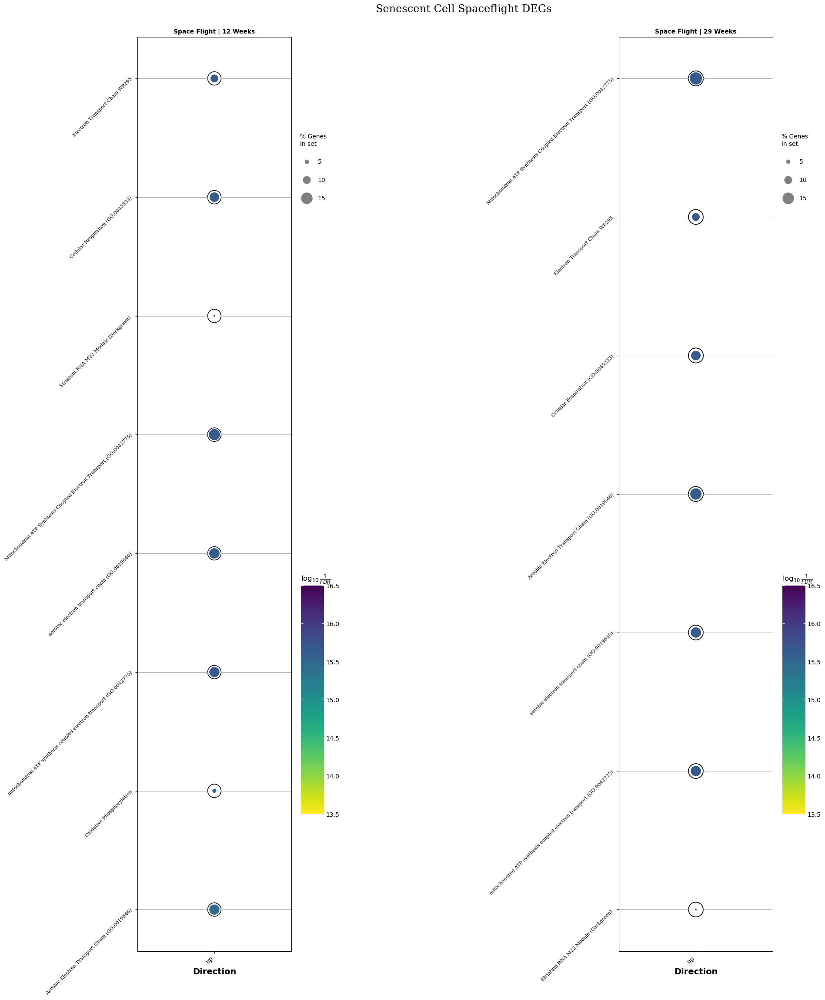

In [235]:
# df_degs = out_edgr_old_sf_v_gc.copy()
df_degs = out_edgr_batches_snc_top.copy()
# df_degs = res_snc_grps.copy()

# factor_name = col_celltype
factor_name = col_condition

names = gp.get_library_name()
# [i for i in names if "brain" in i.lower() or "mouse" in i.lower()]
pathways_snc_vs_no, res_pathways_snc_vs_no = {}, {}
thresh_p_path = 0.05
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021", f"HDSigDB_{species}_2021",
              # "DGIdb_Drug_Targets_2024",
              "MSigDB_Hallmark_2020",
              "MSigDB_Oncogenic_Signatures", "OMIM_Disease",
              # "Reactome_Pathways_2024", "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
# if species.lower() == "mouse":
#     other_sets += ["PerturbAtlas_MouseGenePerturbationSigs"]
for x in df_degs.reset_index()[factor_name].unique():
    pathways_snc_vs_no[x], res_pathways_snc_vs_no[x] = {}, {}
    for i in ["up", "down"]:
        degs_tmp = df_degs.loc[x]
        if i == "up":
            degs_tmp = list(degs_tmp[degs_tmp.log_fc > 0].index.values)
        else:
            degs_tmp = list(degs_tmp[degs_tmp.log_fc < 0].index.values)
        if len(degs_tmp) > 0:
            g_s = [f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
                f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
            g_s = [g for g in g_s if g in names]
            pathways_snc_vs_no[x][i] = gp.enrichr(
                gene_list=degs_tmp, gene_sets=g_s,
                organism=species, cutoff=0.5)
            res_pathways_snc_vs_no[x][i] = pathways_snc_vs_no[x][i].results[
                pathways_snc_vs_no[x][i].results[
                    "Adjusted P-value"] < thresh_p_path]
    res_pathways_snc_vs_no[x] = pd.concat(res_pathways_snc_vs_no[x],
                                          names=["Direction"])
res_pathways_snc_vs_no = pd.concat(res_pathways_snc_vs_no,
                                   names=[col_celltype])
res_pathways_snc_vs_no.loc[
    :, "Term Short"] = res_pathways_snc_vs_no.Term.apply(
        lambda x: re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
            ".*.XLSX", "",
            re.sub(".*Supplementary Table [0-9]+[-]?", "", re.sub(
                ".*.xlsx.", "", re.sub(".*Supplementary Data ..", "", re.sub(
                    "PMID([0-9])+", "", re.sub(
                        "([0-9]+) years v ([0-9]+) years", "\\1 v \\2 yrs.",
                        re.sub("aging:([0-9]+)", "aging", re.sub(
                            "([0-9]+) months v ([0-9]+) mo(nths)?",
                            "\\1 v \\2 mo.", re.sub("SRP[0-9]+ ", "", re.sub(
                                "GSE[0-9]+ ", "", x)))))))))))))
cts_i = res_pathways_snc_vs_no.reset_index()[col_celltype].unique()
res_pathways_snc_top_vs_no = res_pathways_snc_vs_no.reset_index().groupby([
    col_celltype, "Direction"]).apply(lambda x: x.sort_values(
        "Adjusted P-value", ascending=True).head(10), include_groups=False)
fig, axes = plt.subplots(*scflow.pl.square_grid(cts_i), figsize=(
    20, 25), gridspec_kw=dict(wspace=1.5, top=0.95), squeeze=False)
for i, x in enumerate(cts_i):
    gp.dotplot(
        res_pathways_snc_top_vs_no.loc[x].reset_index(),
        column="Adjusted P-value",
        # column="Overlap",
        x="Direction", y="Term Short",
        ax=axes.flatten()[i], size=20, top_term=100,
        title=x, xticklabels_rot=45, yticklabels_rot=45,
        show_ring=True, marker="o", cutoff=0.5)
    axes.flatten()[i].tick_params(axis="y", labelsize=8,
                                  labelfontfamily="serif")
    axes.flatten()[i].tick_params(axis="x", labelsize=10,
                                  labelfontfamily="serif")
    axes.flatten()[i].title.set_fontsize(10)
if len(axes.flatten()) > len(cts_i):
    for a in axes.flatten()[len(cts_i):]:
        a.set_visible(False)
fig.suptitle("Senescent Cell Spaceflight DEGs", fontsize="xx-large",
             fontproperties=dict(family="serif"))
res_pathways_snc_top_vs_no[["Term Short", "Genes"] + list(
    res_pathways_snc_top_vs_no.columns.difference([
        "Term", "Genes", "Term Short"]))]

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/gseapy/plot.py:754: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda _x: _x.sort_values(by=self.colname).tail(self.n_terms))
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/gseapy/plot.py:754: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda _x: _x.sort_values(by=self.colname).tail(self.n_terms))
/home/ea

Term Short                                                                                                Genes  Adjusted P-value  Combined Score  \
annotation_by_overlap     Direction                                                                                                                                                                                                                                            
Ground Control | 12 Weeks up        6                                                           Genes Changed In iSPNs Of R6/2 Vs WT             GRID1;SGIP1;NTM;ATP2B2;ANK2;GRIN2B;DLG2;APC;MMP16;CDH10;B3GALT1;KCNMA1;GRIA3;DYNC1I1;DGKI      9.429651e-14     2368.732160   
                                    7                                                           Genes Changed In dSPNs Of R6/2 Vs WT                  GRID1;SGIP1;NTM;ATP2B2;ANK2;GRIN2B;APC;MMP16;CDH10;B3GALT1;KCNMA1;GRIA3;DYNC1I1;DGKI      1.615311e-11     1343.117546   
                                    8                                  Genes Changed In Foxp2/Olfm3-expressing Neurons Of R6/2 Vs WT                       GRID1;SGIP1;NTM;ATP2B2;ANK2;GRIN2B;TANC2;APC;CDH10;B3GALT1;HIVEP3;GRIA3;DYNC1I1      2.581291e-11     1303.947210   
                                    9                          Up-regulated Genes In Cerebellum Of 6 Mon HD Q140 Mice Vs Q20 GSE78270          GRID1;SGIP1;ATP2B2;ANK2;NOL4;GRIN2B;TANC2;DLG2;APC;B3GALT1;KCNMA1;HIVEP3;AMPH;GRIA3;DYNC1I1      2.798419e-11     1145.601891   
                                    11                                                 Top Neuron-Expressed Genes In Humans And Mice                         DYNC1I2;SGIP1;NTM;ATP2B2;ANK2;GRIN2B;TANC2;DLG2;APC;KCNMA1;AMPH;GRIA3;DYNC1I1      2.254786e-10      930.498937   
                                    10                                                       Genes Changed In iSPNs Of zQ175DN Vs WT                                   DLG2;MMP16;SGIP1;NTM;CDH10;B3GALT1;ANK2;HIVEP3;GRIN2B;GRIA3;DYNC1I1      2.254786e-10     1185.862385   
                                    12                                   Genes Changed In Chat-expressing Interneurons Of R6/2 Vs WT                         GRID1;NOL4;GRIN2B;TANC2;DLG2;APC;MMP16;B3GALT1;HIVEP3;AMPH;GRIA3;DYNC1I1;DGKI      5.485884e-10      819.807501   
                                    13                    Genes Up-Regulated In Control iPSCs After 60 D Of Differentiation GSE109534  DYNC1I2;GRID1;SGIP1;NTM;ATP2B2;ANK2;NOL4;GRIN2B;TANC2;DLG2;APC;CDH10;KCNMA1;HIVEP3;AMPH;GRIA3;DY...      6.402671e-10     1083.738559   
                                    14                           Genes Up-Regulated In Sst/Npy-expressing Interneurons Of R6/2 Vs WT                                                   DLG2;APC;MMP16;CDH10;B3GALT1;KCNMA1;ANK2;NOL4;TANC2      1.212627e-09     1299.964101   
                                    15                                                  Top Neuron-Enriched Genes In Humans And Mice                           DLG2;MMP16;SGIP1;CDH10;B3GALT1;KCNMA1;ATP2B2;AMPH;NOL4;GRIN2B;GRIA3;DYNC1I1      2.780780e-09      691.246334   
Ground Control | 29 Weeks up        507                                        Negative Regulation Of Peptidase Activity (GO:0010466)                                                                             SERPINE2;TIMP2;NRG1;CTSB      9.062129e-05     1324.283459   
                                    508                                               Negative Regulation Of Proteolysis (GO:0045861)                                                                                  SERPINE2;TIMP2;CTSB      1.178829e-03     1077.036200   
                                    510                                    Negative Regulation Of Endopeptidase Activity (GO:0010951)                                                                                  SERPINE2;TIMP2;NRG1      1.897170e-03      568.434094   
                                    509    

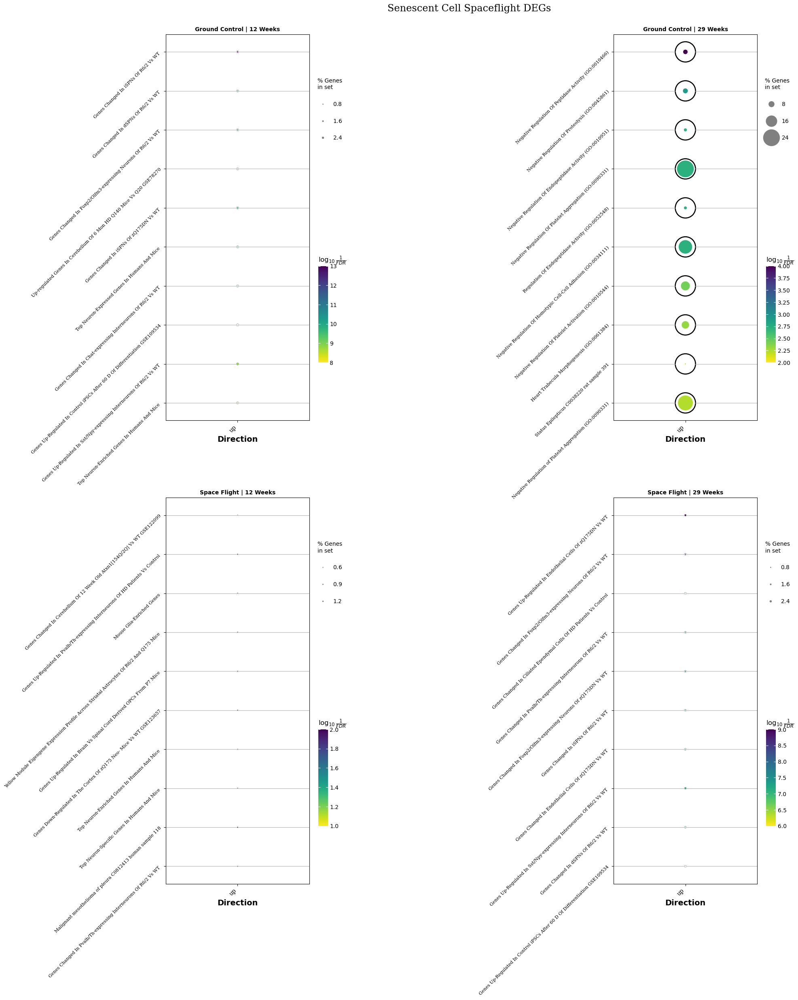

In [231]:
# df_degs = out_edgr_old_sf_v_gc.copy()
# df_degs = out_edgr_batches_snc_top.copy()
# df_degs = res_snc_grps.copy()

# factor_name = col_celltype
# factor_name = col_condition
factor_name = col_batch

df_degs = res_rank_genes_top.loc[:, "Overall", :]
df_degs = df_degs.assign(log_fc=df_degs.logfoldchanges.abs())
df_degs = df_degs.assign(abs_log_fc=df_degs.logfoldchanges_abs)

names = gp.get_library_name()
# [i for i in names if "brain" in i.lower() or "mouse" in i.lower()]
pathways_snc_vs_no, res_pathways_snc_vs_no = {}, {}
thresh_p_path = 0.05
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021", f"HDSigDB_{species}_2021",
              # "DGIdb_Drug_Targets_2024",
              "MSigDB_Hallmark_2020",
              "MSigDB_Oncogenic_Signatures", "OMIM_Disease",
              # "Reactome_Pathways_2024", "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
# if species.lower() == "mouse":
#     other_sets += ["PerturbAtlas_MouseGenePerturbationSigs"]
for x in df_degs.reset_index()[factor_name].unique():
    pathways_snc_vs_no[x], res_pathways_snc_vs_no[x] = {}, {}
    for i in ["up", "down"]:
        degs_tmp = df_degs.loc[x]
        if i == "up":
            degs_tmp = list(degs_tmp[degs_tmp.log_fc > 0].index.values)
        else:
            degs_tmp = list(degs_tmp[degs_tmp.log_fc < 0].index.values)
        if len(degs_tmp) > 0:
            g_s = [f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
                f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
            g_s = [g for g in g_s if g in names]
            pathways_snc_vs_no[x][i] = gp.enrichr(
                gene_list=degs_tmp, gene_sets=g_s,
                organism=species, cutoff=0.5)
            res_pathways_snc_vs_no[x][i] = pathways_snc_vs_no[x][i].results[
                pathways_snc_vs_no[x][i].results[
                    "Adjusted P-value"] < thresh_p_path]
    res_pathways_snc_vs_no[x] = pd.concat(res_pathways_snc_vs_no[x],
                                          names=["Direction"])
res_pathways_snc_vs_no = pd.concat(res_pathways_snc_vs_no,
                                   names=[col_celltype])
res_pathways_snc_vs_no.loc[
    :, "Term Short"] = res_pathways_snc_vs_no.Term.apply(
        lambda x: re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
            ".*.XLSX", "",
            re.sub(".*Supplementary Table [0-9]+[-]?", "", re.sub(
                ".*.xlsx.", "", re.sub(".*Supplementary Data ..", "", re.sub(
                    "PMID([0-9])+", "", re.sub(
                        "([0-9]+) years v ([0-9]+) years", "\\1 v \\2 yrs.",
                        re.sub("aging:([0-9]+)", "aging", re.sub(
                            "([0-9]+) months v ([0-9]+) mo(nths)?",
                            "\\1 v \\2 mo.", re.sub("SRP[0-9]+ ", "", re.sub(
                                "GSE[0-9]+ ", "", x)))))))))))))
cts_i = res_pathways_snc_vs_no.reset_index()[col_celltype].unique()
res_pathways_snc_top_vs_no = res_pathways_snc_vs_no.reset_index().groupby([
    col_celltype, "Direction"]).apply(lambda x: x.sort_values(
        "Adjusted P-value", ascending=True).head(10), include_groups=False)
fig, axes = plt.subplots(*scflow.pl.square_grid(cts_i), figsize=(
    20, 25), gridspec_kw=dict(wspace=1.5, top=0.95), squeeze=False)
for i, x in enumerate(cts_i):
    gp.dotplot(
        res_pathways_snc_top_vs_no.loc[x].reset_index(),
        column="Adjusted P-value",
        # column="Overlap",
        x="Direction", y="Term Short",
        ax=axes.flatten()[i], size=20, top_term=100,
        title=x, xticklabels_rot=45, yticklabels_rot=45,
        show_ring=True, marker="o", cutoff=0.5)
    axes.flatten()[i].tick_params(axis="y", labelsize=8,
                                  labelfontfamily="serif")
    axes.flatten()[i].tick_params(axis="x", labelsize=10,
                                  labelfontfamily="serif")
    axes.flatten()[i].title.set_fontsize(10)
if len(axes.flatten()) > len(cts_i):
    for a in axes.flatten()[len(cts_i):]:
        a.set_visible(False)
fig.suptitle("Senescent Cell Spaceflight DEGs",
             fontsize="xx-large",
             fontproperties=dict(family="serif"))
res_pathways_snc_top_vs_no[["Term Short", "Genes"] + list(
    res_pathways_snc_top_vs_no.columns.difference([
        "Term", "Genes", "Term Short"]))]

Space Flight | 29 Weeks


/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/gseapy/plot.py:754: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda _x: _x.sort_values(by=self.colname).tail(self.n_terms))
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/gseapy/plot.py:754: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda _x: _x.sort_values(by=self.colname).tail(self.n_terms))
/home/ea

Term Short                                                                                              Genes  Adjusted P-value  Combined Score  \
annotation_by_overlap Direction                                                                                                                                                                                                                                                 
Excitatory            up        5                                               Genes Up-Regulated In Oligodendrocytes Of zQ175DN Vs WT                                              TENM2;SYT1;NEGR1;ADGRB3;CELF2;NRXN1;CTNND2;CSMD1;FGF12      9.868939e-16    14425.378650   
                                6                                               Genes Up-Regulated In Microglial Cells Of zQ175DN Vs WT                                                    TENM2;SYT1;NEGR1;ADGRB3;NRXN1;CTNND2;CSMD1;FGF12      4.901372e-14    11987.300746   
                                7                                                     Genes Up-Regulated In Astrocytes Of zQ175DN Vs WT                                                      TENM2;SYT1;NEGR1;ADGRB3;CELF2;KCNQ3;ERC2;CSMD1      1.382226e-13     9441.901030   
                                8                                                    Genes Changed In Microglial Cells Of zQ175DN Vs WT                                                    TENM2;SYT1;NEGR1;ADGRB3;NRXN1;CTNND2;CSMD1;FGF12      4.495854e-13     7415.603564   
                                9                                                    Genes Changed In Oligodendrocytes Of zQ175DN Vs WT                                              TENM2;SYT1;NEGR1;ADGRB3;CELF2;NRXN1;CTNND2;CSMD1;FGF12      6.366682e-13     4424.009348   
                                10                                                              Genes Changed In iSPNs Of zQ175DN Vs WT                          AHI1;CAMK1D;SYT1;NEGR1;ADGRB3;CELF2;NRXN1;B3GALT1;SORBS2;ERC2;DIP2C;GPR158      4.218271e-12     1661.868528   
                                11                                                                 Genes Changed In dSPNs Of R6/2 Vs WT              CAMK1D;SYT1;NEGR1;CELF2;NRXN1;SORBS2;PCLO;ADGRB3;B3GALT1;KCNQ3;ERC2;CSMD1;FGF12;GPR158      4.546108e-12     1343.117546   
                                12                                                         Genes Changed In Astrocytes Of zQ175DN Vs WT                                                      TENM2;SYT1;NEGR1;ADGRB3;CELF2;KCNQ3;ERC2;CSMD1      4.715813e-12     4464.460737   
                                13                                 Genes Down-Regulated In Foxp2/Olfm3-expressing Neurons Of R6/2 Vs WT                          AHI1;CAMK1D;SYT1;NEGR1;ADGRB3;CELF2;B3GALT1;KCNQ3;SORBS2;ERC2;DIP2C;GPR158      4.715813e-12     1561.570553   
                                14                                                       Genes Down-Regulated In iSPNs Of zQ175DN Vs WT                                AHI1;CAMK1D;SYT1;NEGR1;ADGRB3;CELF2;B3GALT1;SORBS2;ERC2;DIP2C;GPR158      5.696360e-12     1763.714254   
Excitatory-Inhibitory up        411                                                                                             dementia                                                                                               MAPT      2.861721e-02      423.083052   
                                412                                                                                    parkinson disease                                                                                               MAPT      2.861721e-02      191.420591   
                                413                                                                                         hypertension                                                                                              NR3C2      2.861721e-02      133.278878   
                               

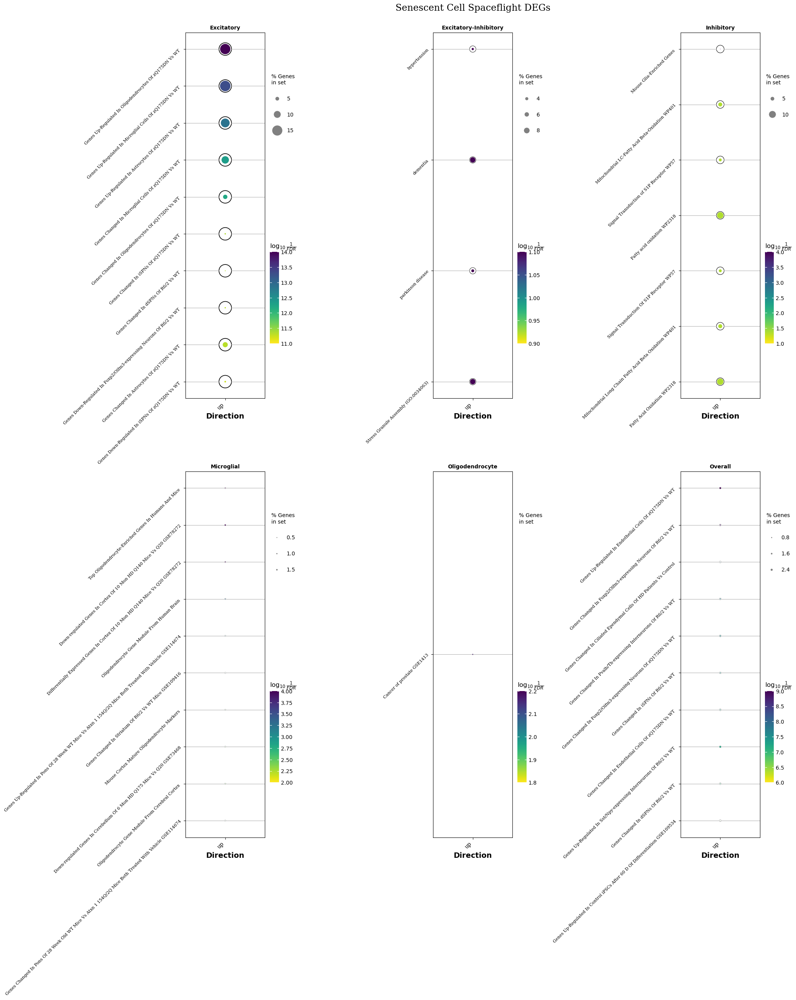

In [232]:
# df_degs = out_edgr_old_sf_v_gc.copy()
# df_degs = out_edgr_batches_snc_top.copy()
# df_degs = res_snc_grps.copy()

factor_name = col_celltype
# factor_name = col_condition

iii = 2
df_degs = res_rank_genes_top.loc[self.rna.obs[col_batch].unique()[iii]]
df_degs = df_degs.assign(log_fc=df_degs.logfoldchanges.abs())
df_degs = df_degs.assign(abs_log_fc=df_degs.logfoldchanges_abs)
print(self.rna.obs[col_batch].unique()[iii])

names = gp.get_library_name()
# [i for i in names if "brain" in i.lower() or "mouse" in i.lower()]
pathways_snc_vs_no, res_pathways_snc_vs_no = {}, {}
thresh_p_path = 0.05
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021", f"HDSigDB_{species}_2021",
              # "DGIdb_Drug_Targets_2024",
              "MSigDB_Hallmark_2020",
              "MSigDB_Oncogenic_Signatures", "OMIM_Disease",
              # "Reactome_Pathways_2024", "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
# if species.lower() == "mouse":
#     other_sets += ["PerturbAtlas_MouseGenePerturbationSigs"]
for x in df_degs.reset_index()[factor_name].unique():
    pathways_snc_vs_no[x], res_pathways_snc_vs_no[x] = {}, {}
    for i in ["up", "down"]:
        degs_tmp = df_degs.loc[x]
        if i == "up":
            degs_tmp = list(degs_tmp[degs_tmp.log_fc > 0].index.values)
        else:
            degs_tmp = list(degs_tmp[degs_tmp.log_fc < 0].index.values)
        if len(degs_tmp) > 0:
            g_s = [f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
                f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
            g_s = [g for g in g_s if g in names]
            pathways_snc_vs_no[x][i] = gp.enrichr(
                gene_list=degs_tmp, gene_sets=g_s,
                organism=species, cutoff=0.5)
            res_pathways_snc_vs_no[x][i] = pathways_snc_vs_no[x][i].results[
                pathways_snc_vs_no[x][i].results[
                    "Adjusted P-value"] < thresh_p_path]
    res_pathways_snc_vs_no[x] = pd.concat(res_pathways_snc_vs_no[x],
                                          names=["Direction"])
res_pathways_snc_vs_no = pd.concat(res_pathways_snc_vs_no,
                                   names=[col_celltype])
res_pathways_snc_vs_no.loc[
    :, "Term Short"] = res_pathways_snc_vs_no.Term.apply(
        lambda x: re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
            ".*.XLSX", "",
            re.sub(".*Supplementary Table [0-9]+[-]?", "", re.sub(
                ".*.xlsx.", "", re.sub(".*Supplementary Data ..", "", re.sub(
                    "PMID([0-9])+", "", re.sub(
                        "([0-9]+) years v ([0-9]+) years", "\\1 v \\2 yrs.",
                        re.sub("aging:([0-9]+)", "aging", re.sub(
                            "([0-9]+) months v ([0-9]+) mo(nths)?",
                            "\\1 v \\2 mo.", re.sub("SRP[0-9]+ ", "", re.sub(
                                "GSE[0-9]+ ", "", x)))))))))))))
cts_i = res_pathways_snc_vs_no.reset_index()[col_celltype].unique()
res_pathways_snc_top_vs_no = res_pathways_snc_vs_no.reset_index().groupby([
    col_celltype, "Direction"]).apply(lambda x: x.sort_values(
        "Adjusted P-value", ascending=True).head(10), include_groups=False)
fig, axes = plt.subplots(*scflow.pl.square_grid(cts_i), figsize=(
    20, 25), gridspec_kw=dict(wspace=1.5, top=0.95), squeeze=False)
for i, x in enumerate(cts_i):
    gp.dotplot(
        res_pathways_snc_top_vs_no.loc[x].reset_index(),
        column="Adjusted P-value",
        # column="Overlap",
        x="Direction", y="Term Short",
        ax=axes.flatten()[i], size=20, top_term=100,
        title=x, xticklabels_rot=45, yticklabels_rot=45,
        show_ring=True, marker="o", cutoff=0.5)
    axes.flatten()[i].tick_params(axis="y", labelsize=8,
                                  labelfontfamily="serif")
    axes.flatten()[i].tick_params(axis="x", labelsize=10,
                                  labelfontfamily="serif")
    axes.flatten()[i].title.set_fontsize(10)
if len(axes.flatten()) > len(cts_i):
    for a in axes.flatten()[len(cts_i):]:
        a.set_visible(False)
fig.suptitle("Senescent Cell Spaceflight DEGs", fontsize="xx-large",
             fontproperties=dict(family="serif"))
res_pathways_snc_top_vs_no[["Term Short", "Genes"] + list(
    res_pathways_snc_top_vs_no.columns.difference([
        "Term", "Genes", "Term Short"]))]

Ground Control | 29 Weeks


/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/gseapy/plot.py:754: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda _x: _x.sort_values(by=self.colname).tail(self.n_terms))
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/gseapy/plot.py:754: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda _x: _x.sort_values(by=self.colname).tail(self.n_terms))
/home/ea

Term Short                                                                                                Genes  Adjusted P-value  Combined Score  \
annotation_by_overlap Direction                                                                                                                                                                                                                                                   
Astrocyte             up        1                                                       Top Astrocyte-Enriched Genes In Humans And Mice                               LGI1;WDR17;DGKB;SGIP1;CTNND2;MMD2;FMN2;BCAN;TOX;SOX6;NCKAP5;BRINP3;RGS7      1.291089e-09      925.100860   
                                2                           Genes Changed In Pvalb/Th-expressing Interneurons Of HD Patients Vs Control                         LGI1;WDR17;DGKB;SGIP1;CTNND2;MMD2;FMN2;DAB1;SOX6;NCKAP5;BRINP3;CBR4;GAS8;RGS7      7.114723e-07      367.758962   
                                3                                                 Genes Changed In Astrocytes Of HD Patients Vs Control                                 LGI1;WDR17;DGKB;SGIP1;MMD2;FMN2;BCAN;TOX;SOX6;NCKAP5;BRINP3;CBR4;RGS7      1.005231e-05      241.836387   
                                4                                          Genes Down-Regulated In Astrocytes Of HD Patients Vs Control                                           LGI1;WDR17;BCAN;SGIP1;MMD2;TOX;SOX6;NCKAP5;BRINP3;CBR4;RGS7      1.752029e-05      226.016634   
                                6                                       Genes Up-Regulated In Ciliated Ependymal Cells Of zQ175DN Vs WT                                                                    WDR17;DAB1;DGKB;CTNND2;SOX6;BRINP3      1.752029e-05      568.275792   
                                5                                                  Genes Up-Regulated In OPCs Of HD Patients Vs Control                                                                DGKB;SGIP1;CTNND2;MMD2;FMN2;TOX;NCKAP5      1.752029e-05      418.683167   
                                7                                            Genes Changed In Ciliated Ependymal Cells Of zQ175DN Vs WT                                                               LGI1;WDR17;DAB1;DGKB;CTNND2;SOX6;BRINP3      1.752029e-05      396.091544   
                                8                      Genes Up-Regulated In Pvalb/Th-expressing Interneurons Of HD Patients Vs Control                                                          LGI1;DAB1;SGIP1;CTNND2;MMD2;FMN2;SOX6;BRINP3      1.752029e-05      307.147712   
                                9                                                             Top OPC-enriched Genes In Humans And Mice                                                     BCAN;DAB1;CTNND2;MMD2;FMN2;TOX;SOX6;NCKAP5;BRINP3      3.102987e-05      227.189098   
                                10                                                            Genes Changed In Astrocytes Of R6/2 Vs WT                                                                          WDR17;BCAN;SGIP1;MMD2;NCKAP5      3.466799e-05      670.424264   
Excitatory            up        85                    Genes Down-Regulated In Sst/Npy-expressing Interneurons Of HD Patients Vs Control   PDIA3;RBM39;UVRAG;PTPN1;DYNC1H1;KCNJ6;UBE2E2;NRG1;DDX50;SCAF8;SIPA1L1;OLFM3;CPD;TET3;PHF24;ATXN7...      1.119974e-05      338.279839   
                                86                     Genes Down-Regulated In Foxp2/Olfm3-expressing Neurons Of HD Patients Vs Control                                    RBM39;SCAF8;SIPA1L1;OLFM3;DESI2;UBE2E2;NRG1;ATXN7L1;PAXBP1;FAM118B      3.348232e-03      108.678502   
                                87                                              Genes Down-Regulated In Endothelial Cells Of R6/2 Vs WT                                                                                DESI2;CPD;NRG1;ATXN7L1      9.082970e-03      297.765344   
 

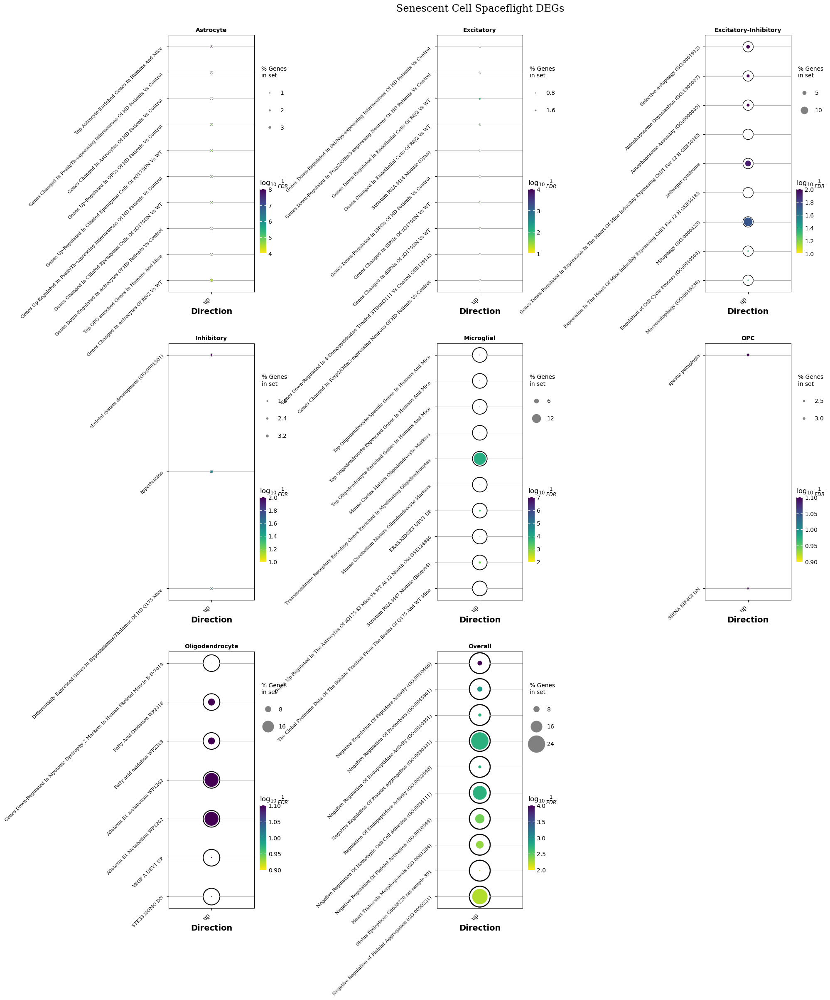

In [230]:
# df_degs = out_edgr_old_sf_v_gc.copy()
# df_degs = out_edgr_batches_snc_top.copy()
# df_degs = res_snc_grps.copy()

factor_name = col_celltype
# factor_name = col_condition

iii = 1
df_degs = res_rank_genes_top.loc[self.rna.obs[col_batch].unique()[iii]]
df_degs = df_degs.assign(log_fc=df_degs.logfoldchanges.abs())
df_degs = df_degs.assign(abs_log_fc=df_degs.logfoldchanges_abs)
print(self.rna.obs[col_batch].unique()[iii])

names = gp.get_library_name()
# [i for i in names if "brain" in i.lower() or "mouse" in i.lower()]
pathways_snc_vs_no, res_pathways_snc_vs_no = {}, {}
thresh_p_path = 0.05
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021", f"HDSigDB_{species}_2021",
              # "DGIdb_Drug_Targets_2024",
              "MSigDB_Hallmark_2020",
              "MSigDB_Oncogenic_Signatures", "OMIM_Disease",
              # "Reactome_Pathways_2024", "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
# if species.lower() == "mouse":
#     other_sets += ["PerturbAtlas_MouseGenePerturbationSigs"]
for x in df_degs.reset_index()[factor_name].unique():
    pathways_snc_vs_no[x], res_pathways_snc_vs_no[x] = {}, {}
    for i in ["up", "down"]:
        degs_tmp = df_degs.loc[x]
        if i == "up":
            degs_tmp = list(degs_tmp[degs_tmp.log_fc > 0].index.values)
        else:
            degs_tmp = list(degs_tmp[degs_tmp.log_fc < 0].index.values)
        if len(degs_tmp) > 0:
            g_s = [f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
                f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
            g_s = [g for g in g_s if g in names]
            pathways_snc_vs_no[x][i] = gp.enrichr(
                gene_list=degs_tmp, gene_sets=g_s,
                organism=species, cutoff=0.5)
            res_pathways_snc_vs_no[x][i] = pathways_snc_vs_no[x][i].results[
                pathways_snc_vs_no[x][i].results[
                    "Adjusted P-value"] < thresh_p_path]
    res_pathways_snc_vs_no[x] = pd.concat(res_pathways_snc_vs_no[x],
                                          names=["Direction"])
res_pathways_snc_vs_no = pd.concat(res_pathways_snc_vs_no,
                                   names=[col_celltype])
res_pathways_snc_vs_no.loc[
    :, "Term Short"] = res_pathways_snc_vs_no.Term.apply(
        lambda x: re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
            ".*.XLSX", "",
            re.sub(".*Supplementary Table [0-9]+[-]?", "", re.sub(
                ".*.xlsx.", "", re.sub(".*Supplementary Data ..", "", re.sub(
                    "PMID([0-9])+", "", re.sub(
                        "([0-9]+) years v ([0-9]+) years", "\\1 v \\2 yrs.",
                        re.sub("aging:([0-9]+)", "aging", re.sub(
                            "([0-9]+) months v ([0-9]+) mo(nths)?",
                            "\\1 v \\2 mo.", re.sub("SRP[0-9]+ ", "", re.sub(
                                "GSE[0-9]+ ", "", x)))))))))))))
cts_i = res_pathways_snc_vs_no.reset_index()[col_celltype].unique()
res_pathways_snc_top_vs_no = res_pathways_snc_vs_no.reset_index().groupby([
    col_celltype, "Direction"]).apply(lambda x: x.sort_values(
        "Adjusted P-value", ascending=True).head(10), include_groups=False)
fig, axes = plt.subplots(*scflow.pl.square_grid(cts_i), figsize=(
    20, 25), gridspec_kw=dict(wspace=1.5, top=0.95), squeeze=False)
for i, x in enumerate(cts_i):
    gp.dotplot(
        res_pathways_snc_top_vs_no.loc[x].reset_index(),
        column="Adjusted P-value",
        # column="Overlap",
        x="Direction", y="Term Short",
        ax=axes.flatten()[i], size=20, top_term=100,
        title=x, xticklabels_rot=45, yticklabels_rot=45,
        show_ring=True, marker="o", cutoff=0.5)
    axes.flatten()[i].tick_params(axis="y", labelsize=8,
                                  labelfontfamily="serif")
    axes.flatten()[i].tick_params(axis="x", labelsize=10,
                                  labelfontfamily="serif")
    axes.flatten()[i].title.set_fontsize(10)
if len(axes.flatten()) > len(cts_i):
    for a in axes.flatten()[len(cts_i):]:
        a.set_visible(False)
fig.suptitle("Senescent Cell Spaceflight DEGs", fontsize="xx-large",
             fontproperties=dict(family="serif"))
res_pathways_snc_top_vs_no[["Term Short", "Genes"] + list(
    res_pathways_snc_top_vs_no.columns.difference([
        "Term", "Genes", "Term Short"]))]